In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.dates import DateFormatter

/home/24m1518/.local/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/home/24m1518/.local/lib/python3.9/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
df=pd.read_excel("SalesRegisterSAP-UP-selected columns.xlsx")

In [3]:
# check columns with null values
df.isnull().sum()

Year                       0
Distribution_channel       0
Plant                      0
Sales_District             0
Destination                0
Customer_Group             0
Customer_Code              0
Invoice_No                 0
Invoice_Date               0
Material_Code              0
Invoice_Quantity           0
Trade_Rate                 0
Additional_Rate            0
Privilege_Rate             0
Intro_Rate                 0
Global_Rate                0
Special_Rate               0
Scheme_1_Rate              0
Scheme_2_Rate              0
Scheme_3_Rate              0
Scheme_4_Rate              0
Freight_Charges            0
ORC_Commission_Rate        0
Assessable_value           0
IGST_Rate                  0
Material_Group             0
Product                    0
Product_Type               0
Thickness                  0
Grade                      0
Size                       0
Shade_Top               6880
Shade_Bottom            9987
Paper_Type              7631
Sides_OBR     

In [4]:
print(df.columns.tolist())

['Year', 'Distribution_channel', 'Plant', 'Sales_District', 'Destination', 'Customer_Group', 'Customer_Code', 'Invoice_No', 'Invoice_Date', 'Material_Code', 'Invoice_Quantity', 'Trade_Rate', 'Additional_Rate', 'Privilege_Rate', 'Intro_Rate', 'Global_Rate', 'Special_Rate', 'Scheme_1_Rate', 'Scheme_2_Rate', 'Scheme_3_Rate', 'Scheme_4_Rate', 'Freight_Charges', 'ORC_Commission_Rate', 'Assessable_value', 'IGST_Rate', 'Material_Group', 'Product', 'Product_Type', 'Thickness', 'Grade', 'Size', 'Shade_Top', 'Shade_Bottom', 'Paper_Type', 'Sides_OBR', 'Texture_Top', 'Texture_Bottom', 'Lam_Type', 'Resin_Type', 'Miscellaneous', 'Quality_Mark', 'Sales_Order_EDD', 'Sales_Office', 'M2', 'Standard_Weight', 'CBM']


In [5]:
df['Invoice_Quantity'].describe()

count    15705.000000
mean        96.083604
std        262.224575
min          1.000000
25%         17.000000
50%         33.000000
75%         80.000000
max       3830.000000
Name: Invoice_Quantity, dtype: float64

In [6]:
df.value_counts("Product")

Product
LR    4147
MD    3229
HD    2431
LP    1514
DR     826
FA     751
LF     638
LB     422
BP     381
EM     371
LM     354
PB     231
UV     226
OM      86
AH      81
DS      16
HM       1
Name: count, dtype: int64

In [7]:
df_filtered = df[~df["Product"].isin(["DS", "HM"])]

In [8]:
df_filtered.value_counts("Product")

Product
LR    4147
MD    3229
HD    2431
LP    1514
DR     826
FA     751
LF     638
LB     422
BP     381
EM     371
LM     354
PB     231
UV     226
OM      86
AH      81
Name: count, dtype: int64

In [9]:
# Drop the columns which you think not important for the forecasting and having null values more in number
cols_to_drop=['Shade_Top','Shade_Bottom','Paper_Type','Sides_OBR','Texture_Top','Texture_Bottom','Lam_Type','Resin_Type','Miscellaneous']

# create the new data frame by droping the columns
df1=df_filtered[[col for col in df_filtered.columns if col not in cols_to_drop]]
df1

,Year,Distribution_channel,Plant,Sales_District,Destination,Customer_Group,Customer_Code,Invoice_No,Invoice_Date,Material_Code,...,Product_Type,Thickness,Grade,Size,Quality_Mark,Sales_Order_EDD,Sales_Office,M2,Standard_Weight,CBM
0,2023,DO,1100,India - North Zone 1,KANPUR,2,1010001298,6000002619,2023-05-03,9000000001,...,HD,12.0,E,BB,A+,2023-04-29,ZEUP,59.54,640.400,0.714
1,2024,DO,1100,India - North Zone 1,VARANASI,2,1010003180,6000051471,2024-06-06,9000000011,...,PB,9.0,I,BA,A+,2024-06-06,ZEUP,17.86,117.508,0.161
2,2023,DO,1100,India - North Zone 1,CHITRAKOOT,4,1010003742,6000031361,2023-12-21,9000000060,...,MD,12.0,I,BB,A+,2023-12-21,ZEUP,14.88,141.280,0.179
3,2023,DO,1100,India - North Zone 1,AGRA,2,1010000942,6000017757,2023-09-06,9000000086,...,PF,8.0,I,JH,A+,2023-09-06,ZEUP,26.24,198.800,0.210
4,2024,DO,1100,India - North Zone 1,LUCKNOW,4,1010002942,6000050319,2024-05-29,9000000096,...,PB,9.0,I,BA,A+,2024-05-29,ZEUP,22.33,146.885,0.201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15700,2024,DO,1100,India - North Zone 1,KANPUR,4,1010004257,6000058242,2024-07-26,9000033021,...,MD,18.0,E,BB,BG,2024-07-25,ZEUP,1271.09,17708.971,22.880
15701,2024,DO,1100,India - North Zone 1,LUCKNOW,2,1010000182,6000061311,2024-08-19,9000033435,...,HD,18.0,E,BB,A+,2024-08-19,ZEUP,14.88,233.300,0.268
15702,2024,DO,1100,India - North Zone 1,KASGANJ,4,1010002459,6000060910,2024-08-16,9000033495,...,PB,17.0,I,AA,BG,2024-08-14,ZEUP,175.82,1963.710,2.989
15703,2024,DO,1100,India - North Zone 1,ALLAHABAD,2,1010000209,6000062591,2024-08-28,9000033625,...,LR,32.0,E,BB,A+,2024-08-28,ZEUP,35.72,920.184,1.143


In [10]:
# verify are there any null values
df1.isnull().sum()

Year                    0
Distribution_channel    0
Plant                   0
Sales_District          0
Destination             0
Customer_Group          0
Customer_Code           0
Invoice_No              0
Invoice_Date            0
Material_Code           0
Invoice_Quantity        0
Trade_Rate              0
Additional_Rate         0
Privilege_Rate          0
Intro_Rate              0
Global_Rate             0
Special_Rate            0
Scheme_1_Rate           0
Scheme_2_Rate           0
Scheme_3_Rate           0
Scheme_4_Rate           0
Freight_Charges         0
ORC_Commission_Rate     0
Assessable_value        0
IGST_Rate               0
Material_Group          0
Product                 0
Product_Type            0
Thickness               0
Grade                   0
Size                    0
Quality_Mark            0
Sales_Order_EDD         0
Sales_Office            0
M2                      0
Standard_Weight         0
CBM                     0
dtype: int64

In [11]:
# check the correlation between the columns
correlation_matrix = df1.corr(numeric_only=True)
print(correlation_matrix)

                         Year  Plant  Customer_Group  Customer_Code  \
Year                 1.000000    NaN       -0.011910       0.137900   
Plant                     NaN    NaN             NaN            NaN   
Customer_Group      -0.011910    NaN        1.000000       0.091015   
Customer_Code        0.137900    NaN        0.091015       1.000000   
Invoice_No           0.795626    NaN        0.003583       0.158969   
Material_Code        0.141204    NaN       -0.082606       0.078068   
Invoice_Quantity    -0.015747    NaN        0.029455       0.003008   
Trade_Rate          -0.020825    NaN        0.048825      -0.034154   
Additional_Rate      0.031432    NaN       -0.016572       0.105929   
Privilege_Rate      -0.043250    NaN        0.066041      -0.038229   
Intro_Rate           0.003067    NaN       -0.020528       0.001330   
Global_Rate          0.029619    NaN        0.053049      -0.012266   
Special_Rate        -0.029140    NaN       -0.039783      -0.060512   
Scheme

In [12]:
import seaborn as sns

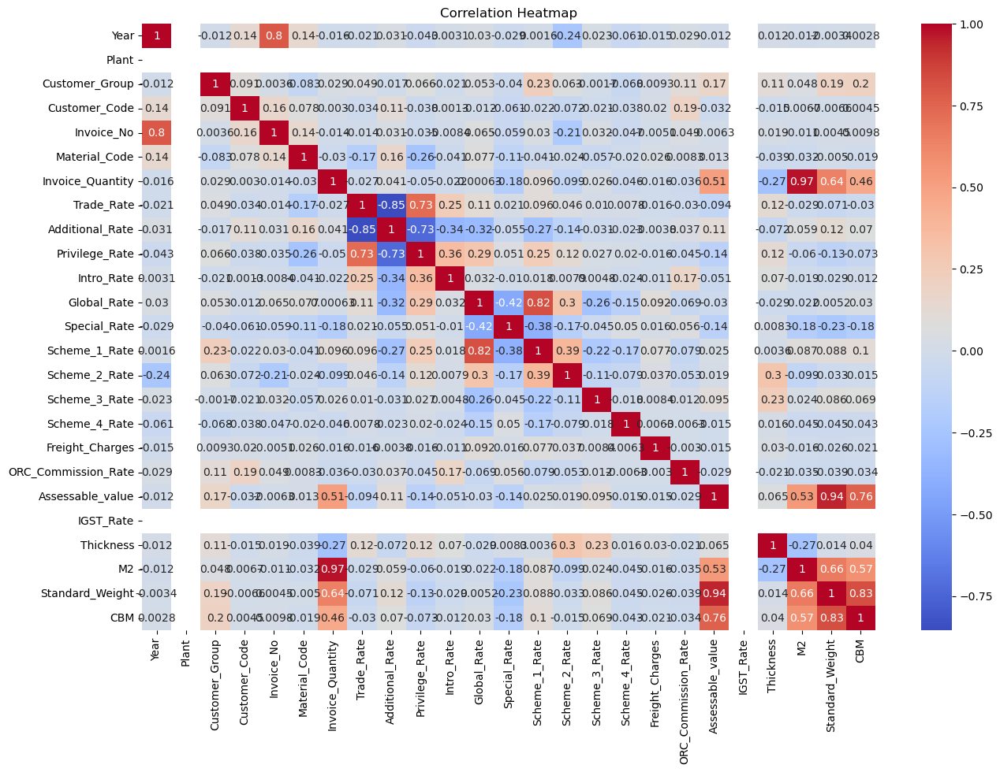

In [13]:
# Draw the correlation matrix to visualize clearly
plt.figure(figsize=(15,10))
sns.heatmap(correlation_matrix,annot=True,cmap='coolwarm' )

plt.title('Correlation Heatmap')
plt.show()

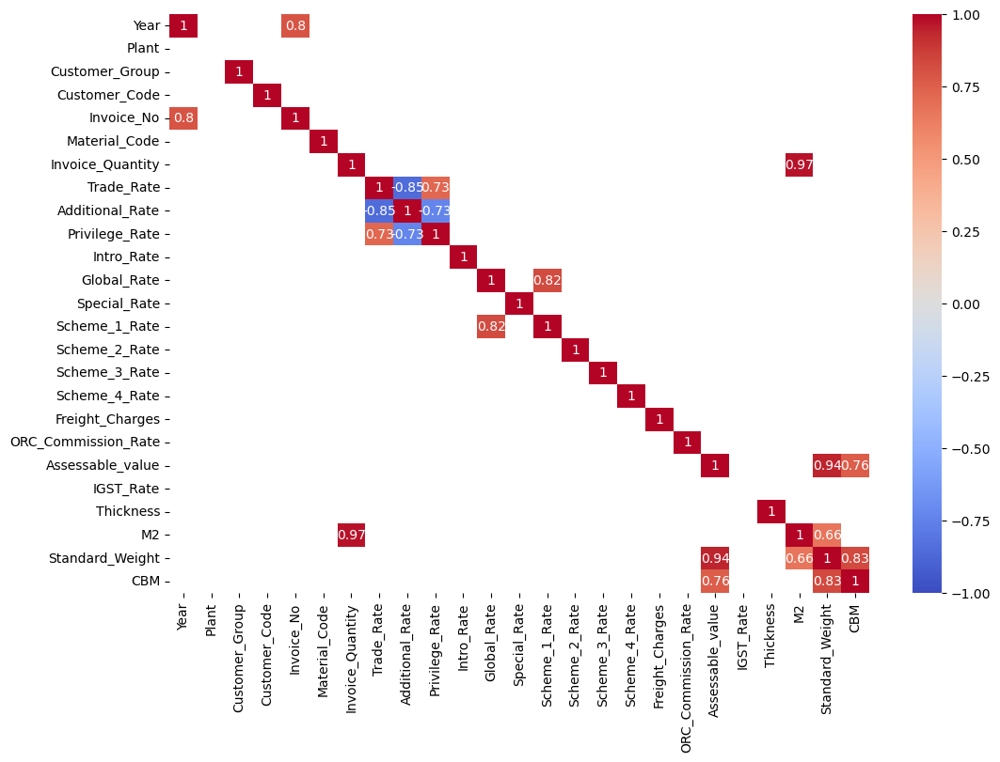

In [14]:
# Show only highly correlated columns
mask=abs(correlation_matrix)>0.65
high_corr = correlation_matrix[mask]
plt.figure(figsize=(12, 8))
sns.heatmap(high_corr, annot=True, cmap='coolwarm',vmin=-1,vmax=1)
plt.show()

In [15]:
# Stack the matrix and reset index
corr_pairs = correlation_matrix.stack().reset_index()
corr_pairs.columns = ['Var1', 'Var2', 'Correlation']

# Filter out:
# 1. Self-correlations (Var1 == Var2)
# 2. Duplicate pairs (e.g., keep only one of (A,B) or (B,A))
# 3. Keep only correlations where absolute value > 0.65
mask2=(corr_pairs['Var1']<corr_pairs["Var2"]) & (corr_pairs['Correlation']>0.65)
corr_pairs = corr_pairs[mask2]
# Sort by absolute correlation strength
corr_pairs['Abs_Correlation'] = corr_pairs['Correlation'].abs()
corr_pairs = corr_pairs.sort_values('Abs_Correlation',ascending=False)

print(corr_pairs.drop(columns='Abs_Correlation'))

                 Var1             Var2  Correlation
135  Invoice_Quantity               M2     0.973327
435  Assessable_value  Standard_Weight     0.943351
527               CBM  Standard_Weight     0.832099
242       Global_Rate    Scheme_1_Rate     0.823544
69         Invoice_No             Year     0.795626
436  Assessable_value              CBM     0.762265
190    Privilege_Rate       Trade_Rate     0.725784
481                M2  Standard_Weight     0.664968


In [16]:
# select the highly correlated columns and drop 
drop_high_corr_cols=['M2','Assessable_value','CBM','Scheme_1_Rate','Invoice_No','Privilege_Rate']
df2=df1[[col for col in df1.columns if col not in drop_high_corr_cols]]
df2.head()

,Year,Distribution_channel,Plant,Sales_District,Destination,Customer_Group,Customer_Code,Invoice_Date,Material_Code,Invoice_Quantity,...,Material_Group,Product,Product_Type,Thickness,Grade,Size,Quality_Mark,Sales_Order_EDD,Sales_Office,Standard_Weight
0,2023,DO,1100,India - North Zone 1,KANPUR,2,1010001298,2023-05-03,9000000001,20,...,FG-008,LR,HD,12.0,E,BB,A+,2023-04-29,ZEUP,640.400
1,2024,DO,1100,India - North Zone 1,VARANASI,2,1010003180,2024-06-06,9000000011,4,...,FG-002,LP,PB,9.0,I,BA,A+,2024-06-06,ZEUP,117.508
2,2023,DO,1100,India - North Zone 1,CHITRAKOOT,4,1010003742,2023-12-21,9000000060,5,...,FG-004,LM,MD,12.0,I,BB,A+,2023-12-21,ZEUP,141.280
3,2023,DO,1100,India - North Zone 1,AGRA,2,1010000942,2023-09-06,9000000086,14,...,FG-014,LF,PF,8.0,I,JH,A+,2023-09-06,ZEUP,198.800
4,2024,DO,1100,India - North Zone 1,LUCKNOW,4,1010002942,2024-05-29,9000000096,5,...,FG-002,LP,PB,9.0,I,BA,A+,2024-05-29,ZEUP,146.885


In [17]:
## Trying to understand the data

In [18]:
df2.columns

Index(['Year', 'Distribution_channel', 'Plant', 'Sales_District',
       'Destination', 'Customer_Group', 'Customer_Code', 'Invoice_Date',
       'Material_Code', 'Invoice_Quantity', 'Trade_Rate', 'Additional_Rate',
       'Intro_Rate', 'Global_Rate', 'Special_Rate', 'Scheme_2_Rate',
       'Scheme_3_Rate', 'Scheme_4_Rate', 'Freight_Charges',
       'ORC_Commission_Rate', 'IGST_Rate', 'Material_Group', 'Product',
       'Product_Type', 'Thickness', 'Grade', 'Size', 'Quality_Mark',
       'Sales_Order_EDD', 'Sales_Office', 'Standard_Weight'],
      dtype='object')

In [19]:
df2['Distribution_channel'].unique()

array(['DO'], dtype=object)

In [20]:
df2['Plant'].unique()

array([1100])

In [21]:
df2['Sales_District'].unique()

array(['India - North Zone 1'], dtype=object)

In [22]:
df2.drop(['Distribution_channel','Plant','Sales_District','Customer_Code','Material_Code'], axis=1, inplace=True)

/tmp/ipykernel_3863891/1610013385.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(['Distribution_channel','Plant','Sales_District','Customer_Code','Material_Code'], axis=1, inplace=True)


In [23]:
df2['Quality_Mark'].unique()

array(['A+', 'BG', 'CM', 'CG'], dtype=object)

In [24]:
df2['Sales_Office'].unique()

array(['ZEUP'], dtype=object)

In [25]:
del df2['Sales_Office']

In [26]:
df2.columns

Index(['Year', 'Destination', 'Customer_Group', 'Invoice_Date',
       'Invoice_Quantity', 'Trade_Rate', 'Additional_Rate', 'Intro_Rate',
       'Global_Rate', 'Special_Rate', 'Scheme_2_Rate', 'Scheme_3_Rate',
       'Scheme_4_Rate', 'Freight_Charges', 'ORC_Commission_Rate', 'IGST_Rate',
       'Material_Group', 'Product', 'Product_Type', 'Thickness', 'Grade',
       'Size', 'Quality_Mark', 'Sales_Order_EDD', 'Standard_Weight'],
      dtype='object')

In [27]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15688 entries, 0 to 15704
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Year                 15688 non-null  int64         
 1   Destination          15688 non-null  object        
 2   Customer_Group       15688 non-null  int64         
 3   Invoice_Date         15688 non-null  datetime64[ns]
 4   Invoice_Quantity     15688 non-null  int64         
 5   Trade_Rate           15688 non-null  float64       
 6   Additional_Rate      15688 non-null  float64       
 7   Intro_Rate           15688 non-null  float64       
 8   Global_Rate          15688 non-null  int64         
 9   Special_Rate         15688 non-null  float64       
 10  Scheme_2_Rate        15688 non-null  int64         
 11  Scheme_3_Rate        15688 non-null  int64         
 12  Scheme_4_Rate        15688 non-null  int64         
 13  Freight_Charges      15688 non-null 

In [28]:
df2.head()

,Year,Destination,Customer_Group,Invoice_Date,Invoice_Quantity,Trade_Rate,Additional_Rate,Intro_Rate,Global_Rate,Special_Rate,...,IGST_Rate,Material_Group,Product,Product_Type,Thickness,Grade,Size,Quality_Mark,Sales_Order_EDD,Standard_Weight
0,2023,KANPUR,2,2023-05-03,20,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-008,LR,HD,12.0,E,BB,A+,2023-04-29,640.400
1,2024,VARANASI,2,2024-06-06,4,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-002,LP,PB,9.0,I,BA,A+,2024-06-06,117.508
2,2023,CHITRAKOOT,4,2023-12-21,5,-25.0,-4.0,-2.0,-1,0.0,...,18,FG-004,LM,MD,12.0,I,BB,A+,2023-12-21,141.280
3,2023,AGRA,2,2023-09-06,14,-35.0,-5.0,-5.0,0,0.0,...,18,FG-014,LF,PF,8.0,I,JH,A+,2023-09-06,198.800
4,2024,LUCKNOW,4,2024-05-29,5,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-002,LP,PB,9.0,I,BA,A+,2024-05-29,146.885


In [29]:
df2['Intro_Rate'].nunique()

10

In [30]:
# Convert to datetime first
df2['Invoice_Date'] = pd.to_datetime(df2['Invoice_Date'])
df2['Sales_Order_EDD']=pd.to_datetime(df2['Sales_Order_EDD'])

/tmp/ipykernel_3863891/1826492165.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['Invoice_Date'] = pd.to_datetime(df2['Invoice_Date'])
/tmp/ipykernel_3863891/1826492165.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['Sales_Order_EDD']=pd.to_datetime(df2['Sales_Order_EDD'])


In [31]:
# Sort the data based on the Invoice Date 
df2.sort_values('Invoice_Date', ascending=True, inplace=True, ignore_index=True)
df2.head(10)

/tmp/ipykernel_3863891/1525357090.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.sort_values('Invoice_Date', ascending=True, inplace=True, ignore_index=True)


,Year,Destination,Customer_Group,Invoice_Date,Invoice_Quantity,Trade_Rate,Additional_Rate,Intro_Rate,Global_Rate,Special_Rate,...,IGST_Rate,Material_Group,Product,Product_Type,Thickness,Grade,Size,Quality_Mark,Sales_Order_EDD,Standard_Weight
0,2023,MATHURA,2,2023-04-10,300,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-003,MD,RM,3.3,I,BB,A+,2023-04-09,2419.500
1,2023,AGRA,2,2023-04-10,50,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-003,MD,RM,3.3,I,BB,A+,2023-04-09,403.250
2,2023,AGRA,2,2023-04-10,20,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-007,HD,MR,5.5,E,BB,A+,2023-04-09,283.900
3,2023,MATHURA,2,2023-04-10,30,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-008,LR,HD,18.0,E,BB,A+,2023-04-09,1399.500
4,2023,MATHURA,2,2023-04-10,79,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-003,MD,RM,7.0,I,BB,A+,2023-04-09,1251.123
5,2023,MATHURA,2,2023-04-10,10,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-007,HD,MR,8.0,E,BB,A+,2023-04-09,204.800
6,2023,AGRA,2,2023-04-10,40,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-003,MD,RM,7.0,I,BB,A+,2023-04-09,633.480
7,2023,AGRA,2,2023-04-10,30,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-003,MD,RM,11.0,I,BB,A+,2023-04-09,756.390
8,2023,MATHURA,2,2023-04-10,100,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-003,MD,RM,11.0,I,BB,A+,2023-04-09,2521.300
9,2023,AGRA,2,2023-04-10,30,-25.0,-4.0,-3.0,-1,0.0,...,18,FG-003,MD,RM,16.5,I,BB,A+,2023-04-09,1119.870


In [32]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15688 entries, 0 to 15687
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Year                 15688 non-null  int64         
 1   Destination          15688 non-null  object        
 2   Customer_Group       15688 non-null  int64         
 3   Invoice_Date         15688 non-null  datetime64[ns]
 4   Invoice_Quantity     15688 non-null  int64         
 5   Trade_Rate           15688 non-null  float64       
 6   Additional_Rate      15688 non-null  float64       
 7   Intro_Rate           15688 non-null  float64       
 8   Global_Rate          15688 non-null  int64         
 9   Special_Rate         15688 non-null  float64       
 10  Scheme_2_Rate        15688 non-null  int64         
 11  Scheme_3_Rate        15688 non-null  int64         
 12  Scheme_4_Rate        15688 non-null  int64         
 13  Freight_Charges      15688 non-

In [33]:
df2.select_dtypes('object').nunique()

Destination       65
Material_Group    16
Product           15
Product_Type      25
Grade              2
Size              55
Quality_Mark       4
dtype: int64

In [34]:
df_new=df2.copy()
df_new.tail(30)

,Year,Destination,Customer_Group,Invoice_Date,Invoice_Quantity,Trade_Rate,Additional_Rate,Intro_Rate,Global_Rate,Special_Rate,...,IGST_Rate,Material_Group,Product,Product_Type,Thickness,Grade,Size,Quality_Mark,Sales_Order_EDD,Standard_Weight
15658,2024,MAU-NATH BHANJAN,4,2024-08-31,31,-25.0,-4.0,-3.0,0,-14.70,...,18,FG-002,LP,PB,25.00,I,DD,CM,2024-08-31,579.700
15659,2024,FAIZABAD,2,2024-08-31,15,-25.0,-4.0,-3.0,0,0.00,...,18,FG-007,HD,MR,12.00,E,BB,A+,2024-08-30,460.815
15660,2024,BARHALGANJ,2,2024-08-31,10,-25.0,-4.0,-2.0,0,0.00,...,18,FG-008,LR,HD,12.00,E,BB,A+,2024-08-31,313.800
15661,2024,MAU-NATH BHANJAN,4,2024-08-31,60,-25.0,-4.0,-3.0,0,-38.23,...,18,FG-002,LP,PB,18.00,E,DC,CM,2024-08-31,1202.580
15662,2024,MAU-NATH BHANJAN,4,2024-08-31,255,-25.0,-4.0,-3.0,0,-23.68,...,18,FG-002,LP,PB,18.00,I,DC,CM,2024-08-31,5133.915
15663,2024,MAU-NATH BHANJAN,4,2024-08-31,42,-25.0,-4.0,-3.0,0,-23.68,...,18,FG-002,LP,PB,18.00,I,DD,CM,2024-08-31,563.724
15664,2024,BARHALGANJ,2,2024-08-31,4,-25.0,-4.0,-2.0,0,0.00,...,18,FG-016,DR,LR,30.00,E,CC,A+,2024-08-31,192.932
15665,2024,BARHALGANJ,2,2024-08-31,3,-25.0,-4.0,-2.0,0,0.00,...,18,FG-016,DR,LR,30.00,E,V3,A+,2024-08-31,127.902
15666,2024,BARHALGANJ,2,2024-08-31,25,-25.0,-4.0,-2.0,0,0.00,...,18,FG-007,HD,MR,12.00,E,BB,A+,2024-08-31,768.025
15667,2024,AGRA,2,2024-08-31,100,-25.0,-5.0,-3.0,0,0.00,...,18,FG-012,BP,RH,18.00,E,BB,A+,2024-09-01,5358.200


In [35]:
df2["Invoice_Date"].unique()[-10:]

<DatetimeArray>
['2024-08-22 00:00:00', '2024-08-23 00:00:00', '2024-08-24 00:00:00',
 '2024-08-25 00:00:00', '2024-08-26 00:00:00', '2024-08-27 00:00:00',
 '2024-08-28 00:00:00', '2024-08-29 00:00:00', '2024-08-30 00:00:00',
 '2024-08-31 00:00:00']
Length: 10, dtype: datetime64[ns]

In [36]:
del df_new['Material_Group']

In [37]:
df_new['Size'].dtype

dtype('O')

In [38]:
df_new.dtypes

Year                            int64
Destination                    object
Customer_Group                  int64
Invoice_Date           datetime64[ns]
Invoice_Quantity                int64
Trade_Rate                    float64
Additional_Rate               float64
Intro_Rate                    float64
Global_Rate                     int64
Special_Rate                  float64
Scheme_2_Rate                   int64
Scheme_3_Rate                   int64
Scheme_4_Rate                   int64
Freight_Charges               float64
ORC_Commission_Rate             int64
IGST_Rate                       int64
Product                        object
Product_Type                   object
Thickness                     float64
Grade                          object
Size                           object
Quality_Mark                   object
Sales_Order_EDD        datetime64[ns]
Standard_Weight               float64
dtype: object

In [39]:
# Create a list of unique products
products=list(df_new['Product'].unique())
products

['MD',
 'HD',
 'LR',
 'DR',
 'LB',
 'LM',
 'EM',
 'LP',
 'LF',
 'FA',
 'PB',
 'AH',
 'UV',
 'BP',
 'OM']

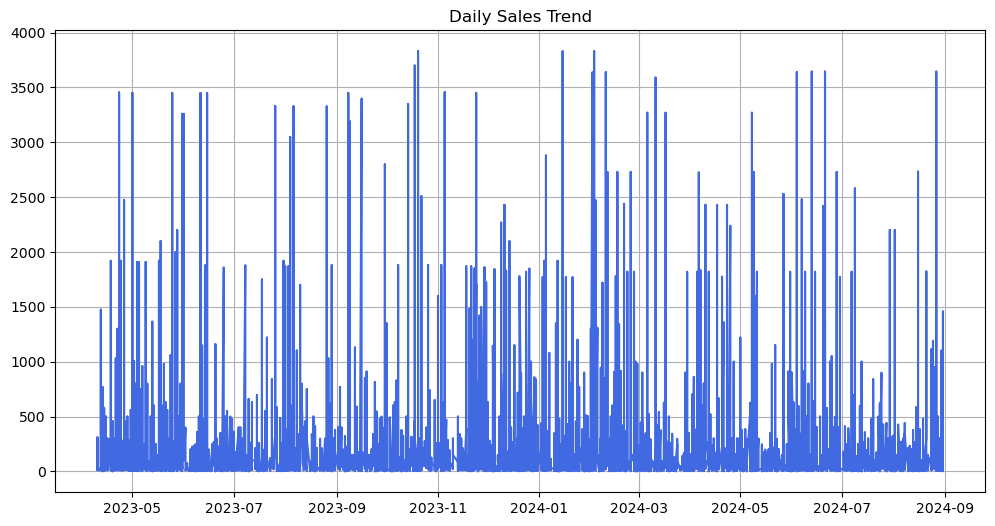

In [41]:
# Plot for overall data
plt.figure(figsize=(12,6))
plt.plot(df_new['Invoice_Date'],df_new['Invoice_Quantity'],'royalblue')
plt.title(f'Daily Sales Trend')
plt.grid()
plt.show()

In [42]:
## For plotting purpose
# Convert to datetime and clean data
df_new['date'] = pd.to_datetime(df_new['Invoice_Date'], dayfirst=True)

# Weekly Analysis
df_new['Week'] = df_new['date'].dt.to_period('W').dt.end_time
df_weekly = df_new.groupby(['Product', 'Week'])['Invoice_Quantity'].sum().reset_index()

# Monthly Analysis
df_new['Month'] = df_new['date'].dt.to_period('M').dt.end_time
df_monthly = df_new.groupby(['Product', 'Month'])['Invoice_Quantity'].sum().reset_index()

# Custom date formatter
date_fmt = DateFormatter("%d-%b-%Y")

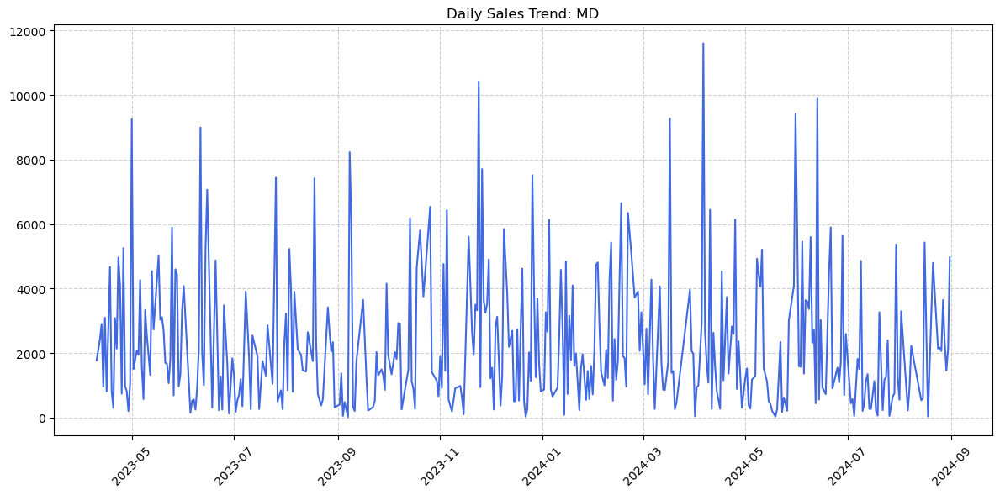

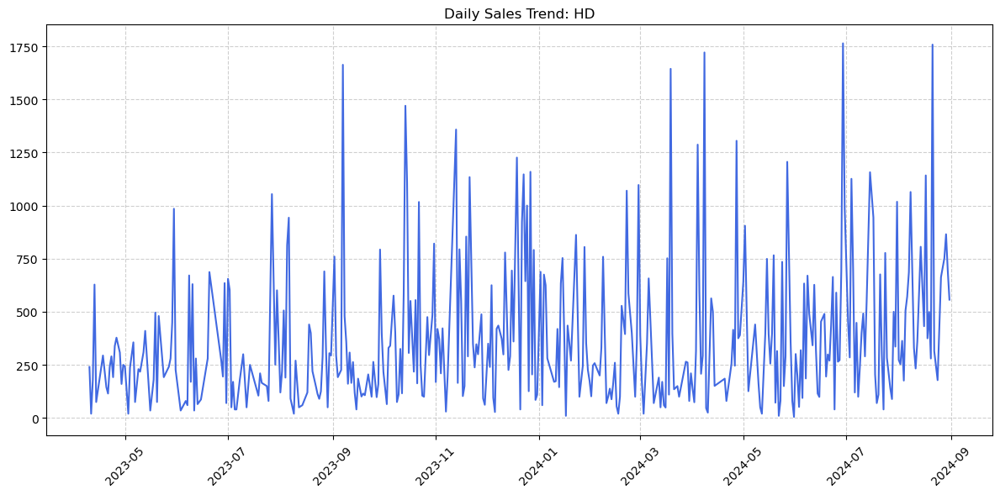

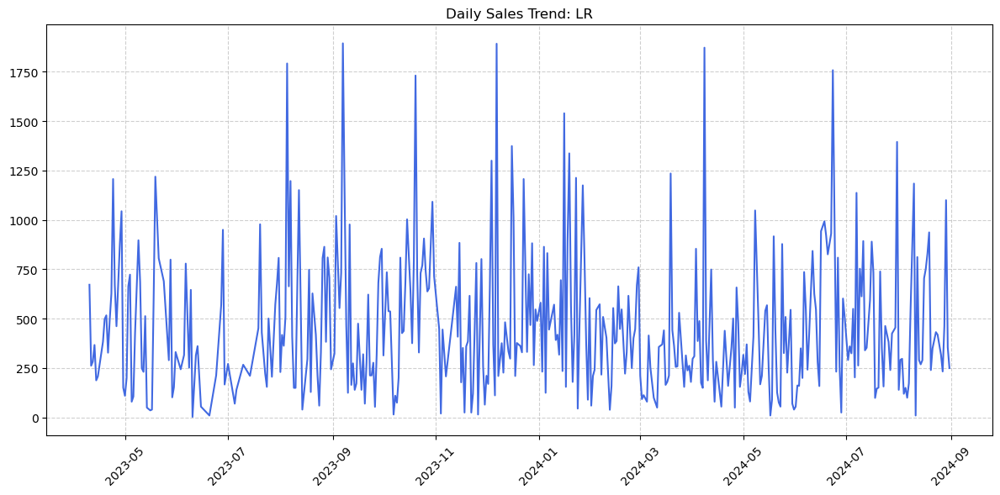

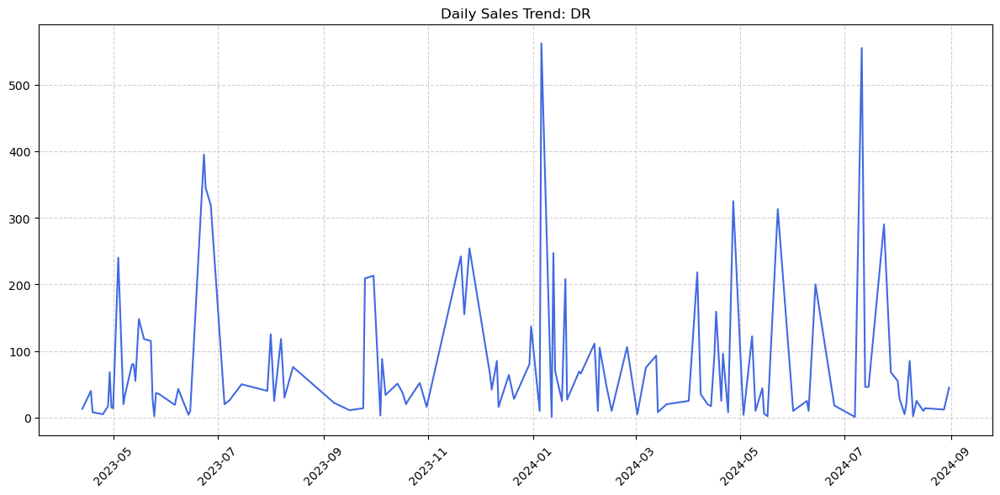

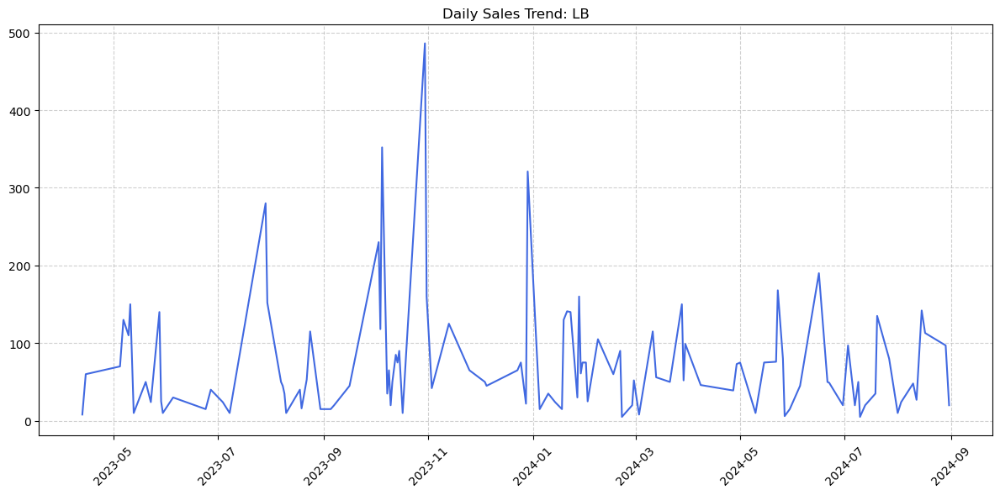

...

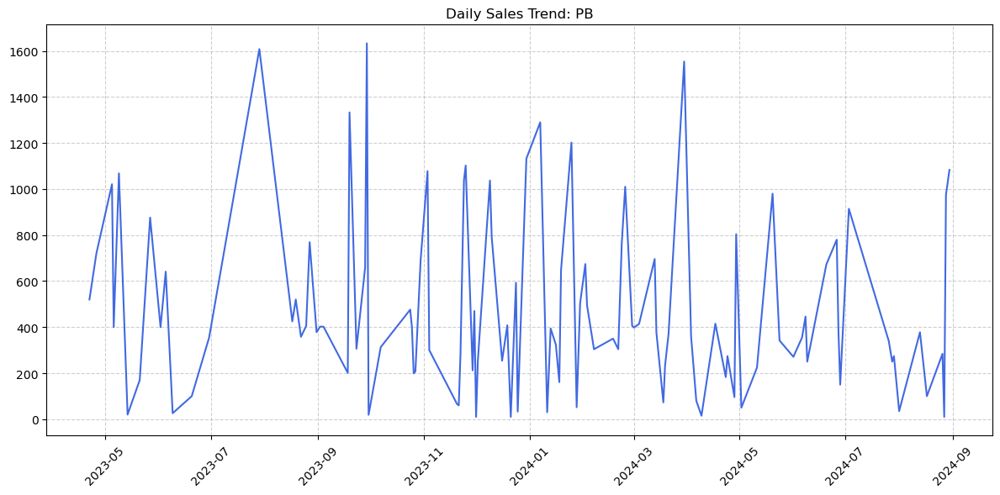

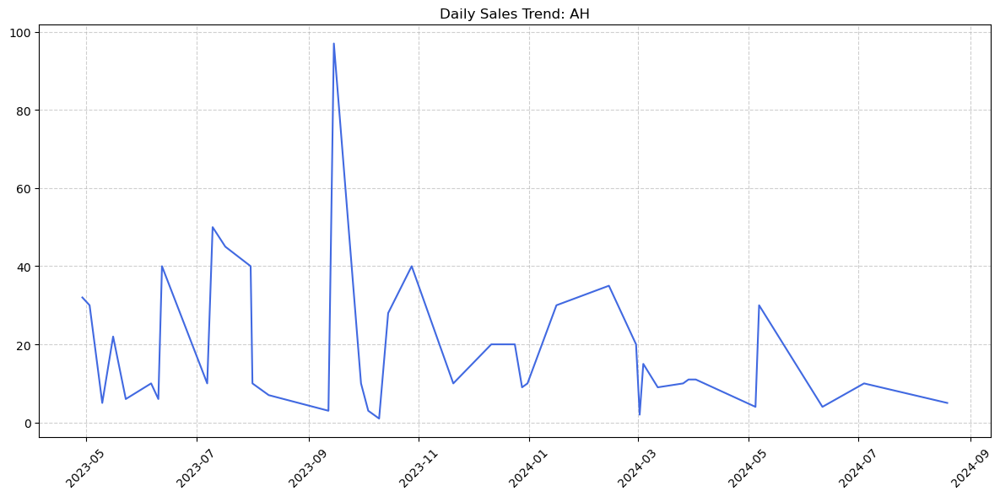

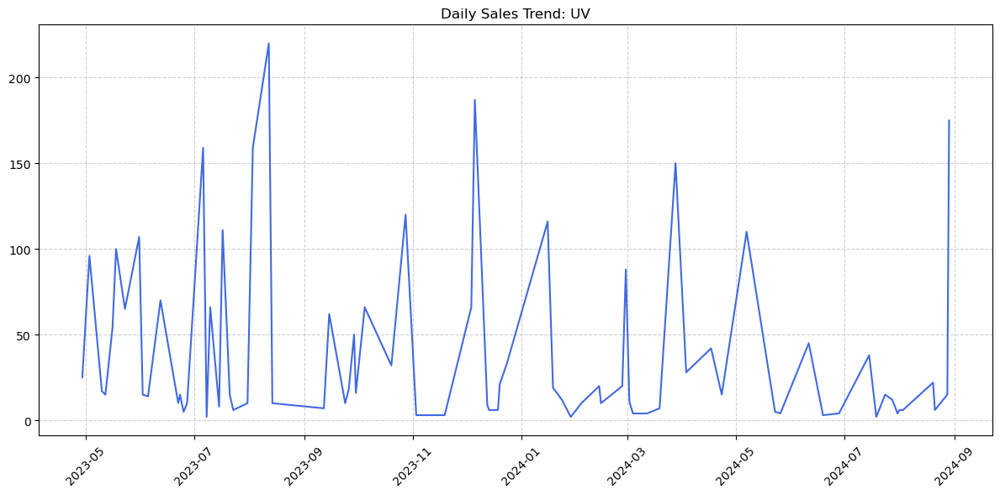

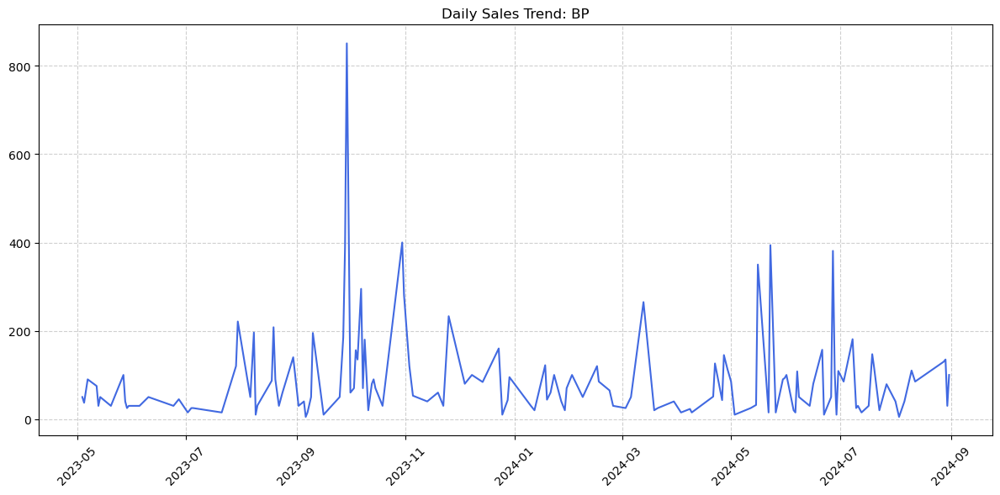

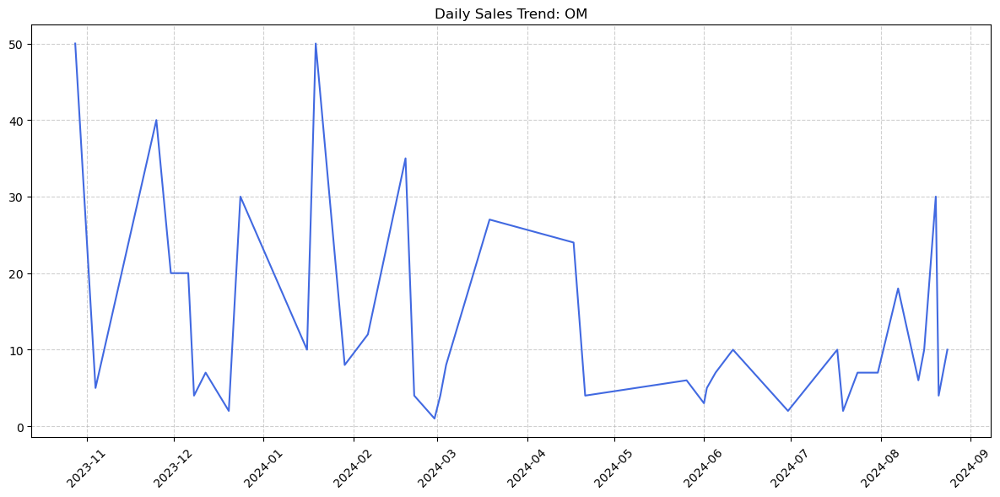

In [45]:
# plot for the data at individual product level on daily basis

for product in products:
    # Group by date and sum quantities (handles duplicates)
    product_data = (df_new[df_new['Product'] == product]
                   .groupby('Invoice_Date')['Invoice_Quantity']
                   .sum()
                   .reset_index())
    
    plt.figure(figsize=(12,6))
    ax=plt.plot(product_data['Invoice_Date'], 
                 product_data['Invoice_Quantity'],
                 'royalblue')
    
    plt.title(f'Daily Sales Trend: {product}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.grid(True,linestyle='--',alpha=0.6)
    plt.show()

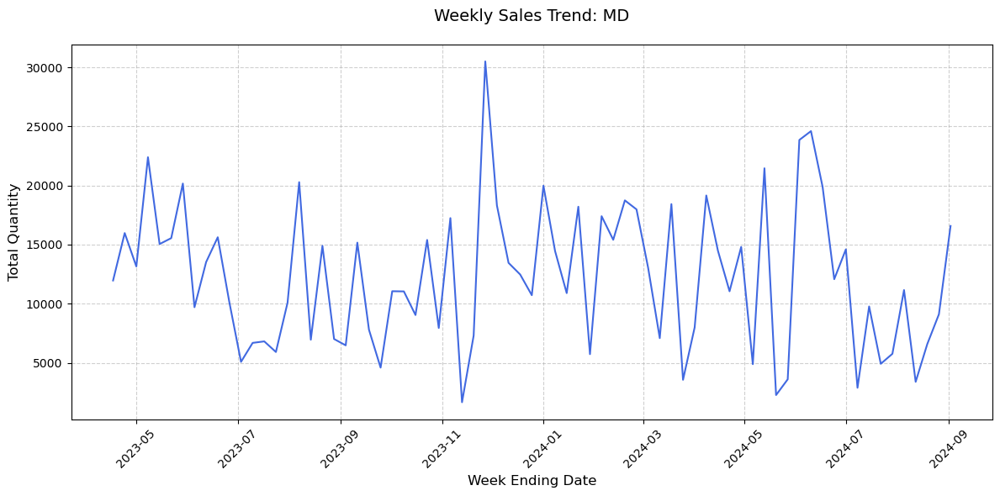

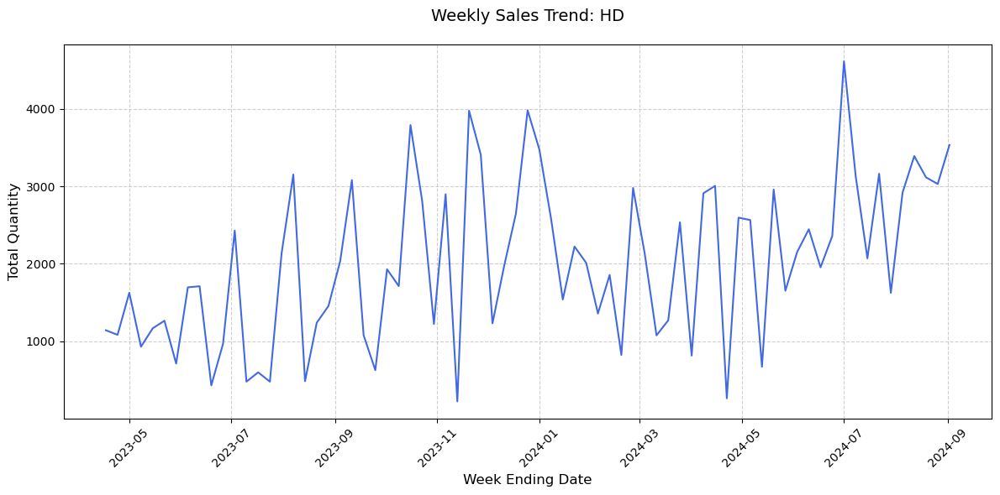

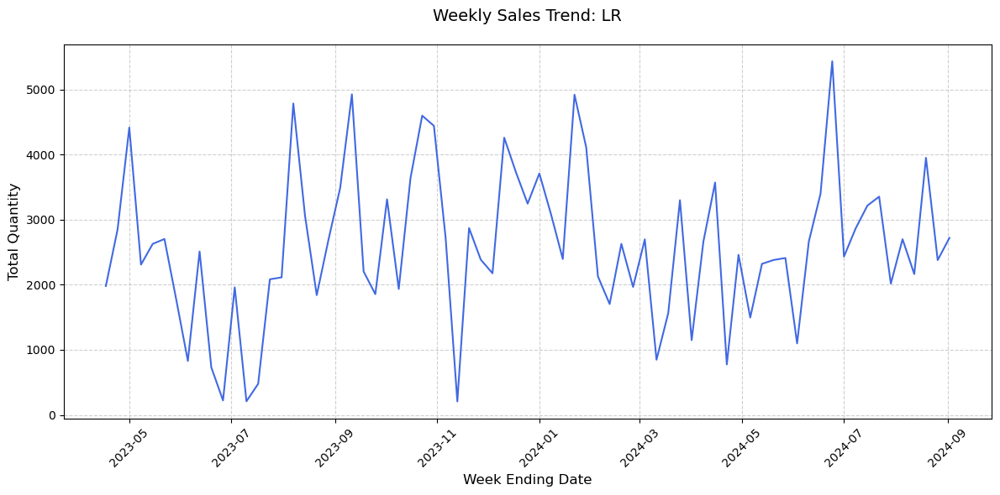

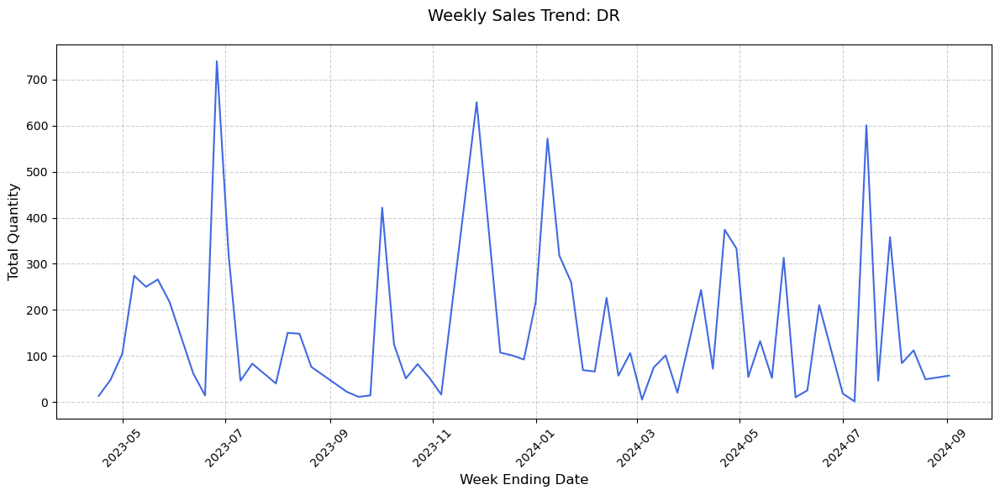

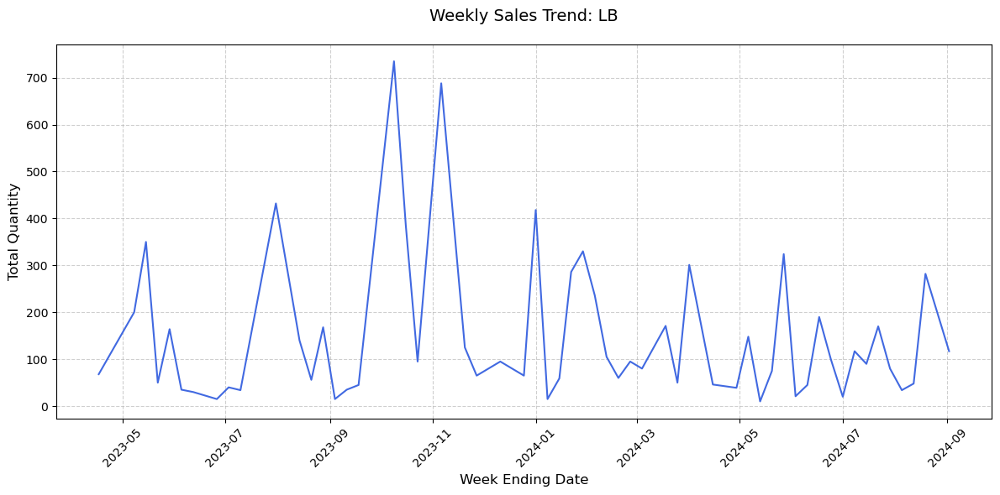

...

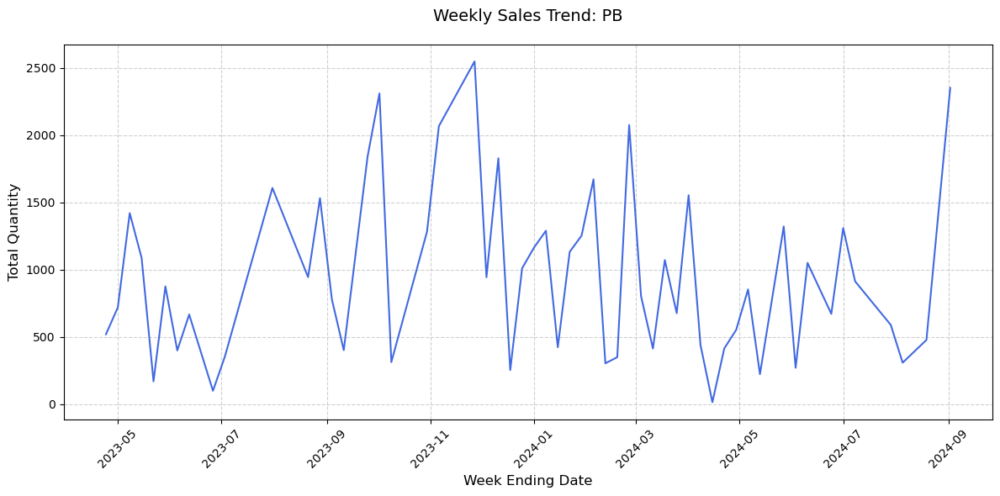

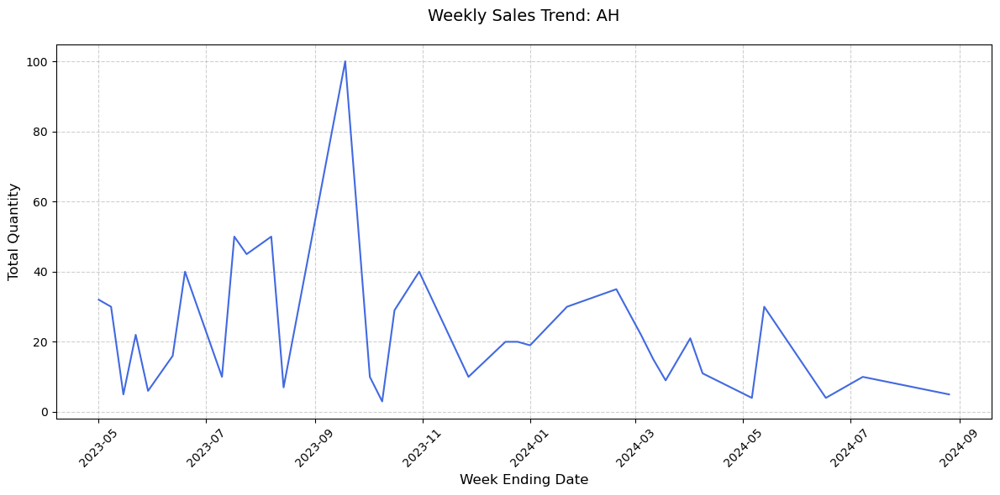

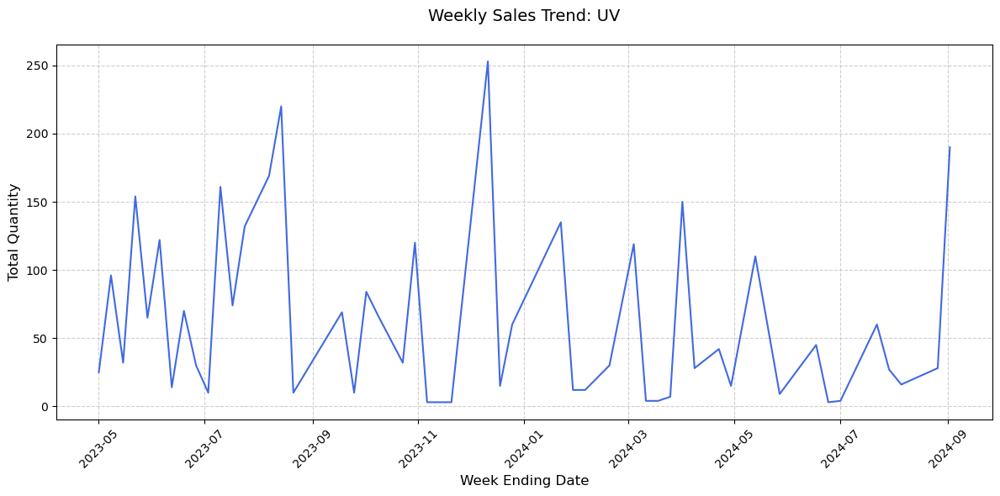

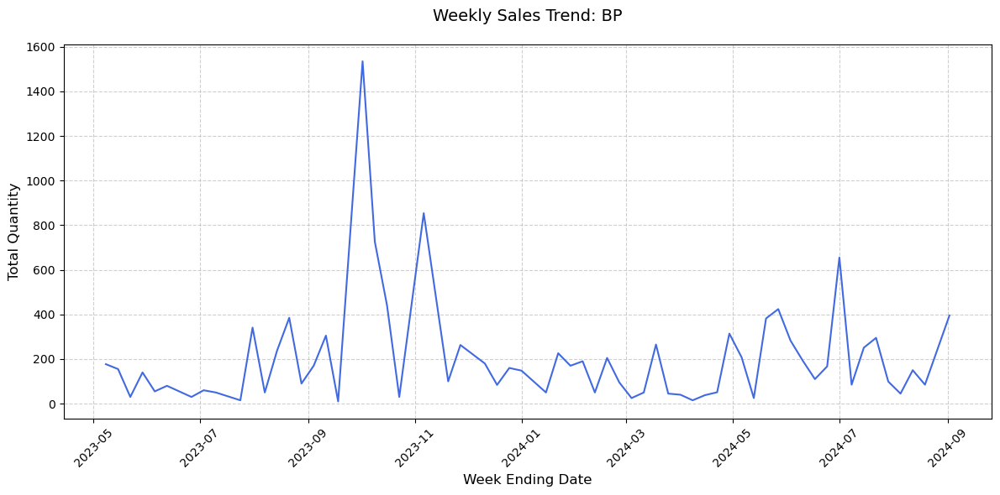

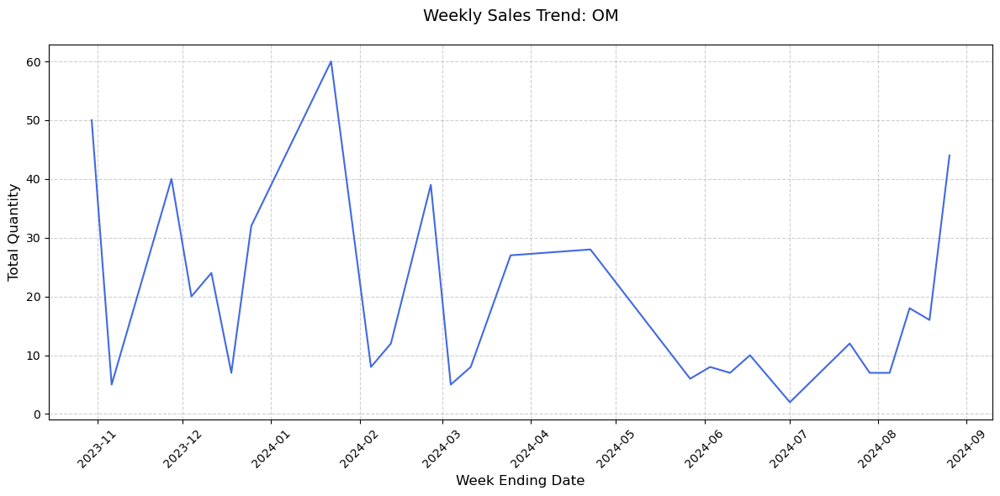

In [46]:
# Weekly Plots for individual product level

for product in products:
    product_data = df_weekly[df_weekly['Product'] == product]
    
    plt.figure(figsize=(12,6))
    ax = plt.plot(product_data['Week'], product_data['Invoice_Quantity'],
                     'royalblue')
    
    # Formatting
    
    plt.title(f'Weekly Sales Trend: {product}', fontsize=14, pad=20)
    plt.xlabel('Week Ending Date', fontsize=12)
    plt.ylabel('Total Quantity', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()



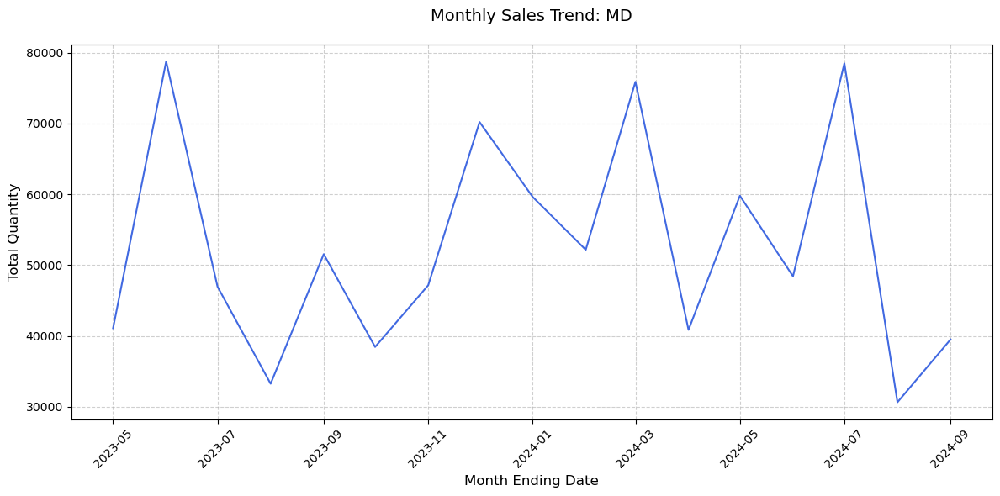

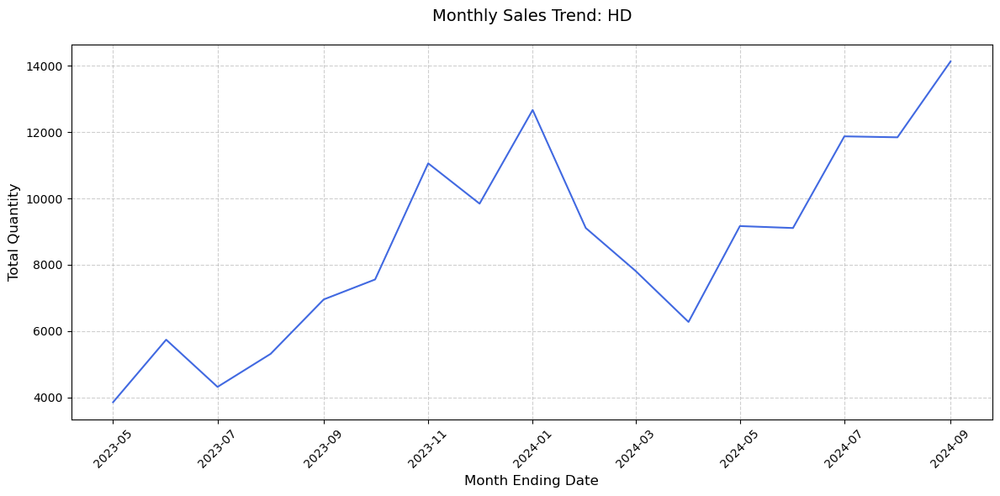

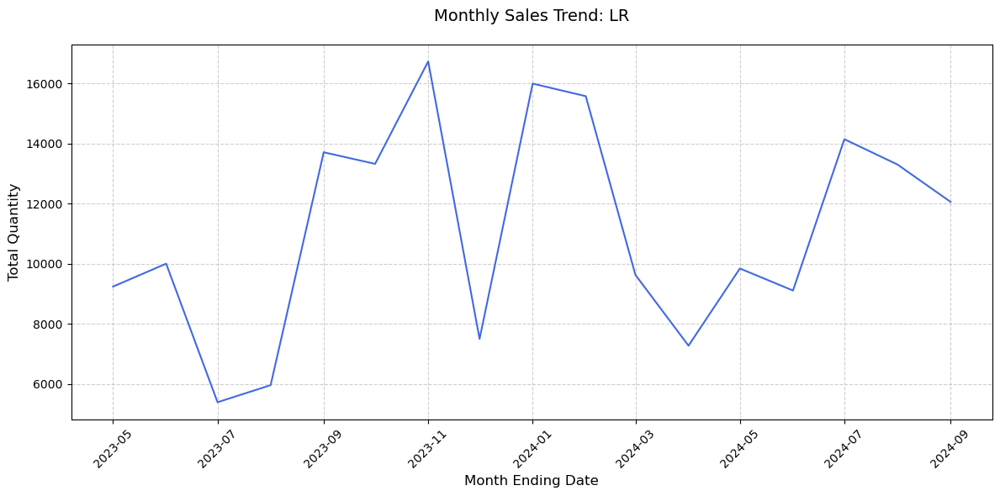

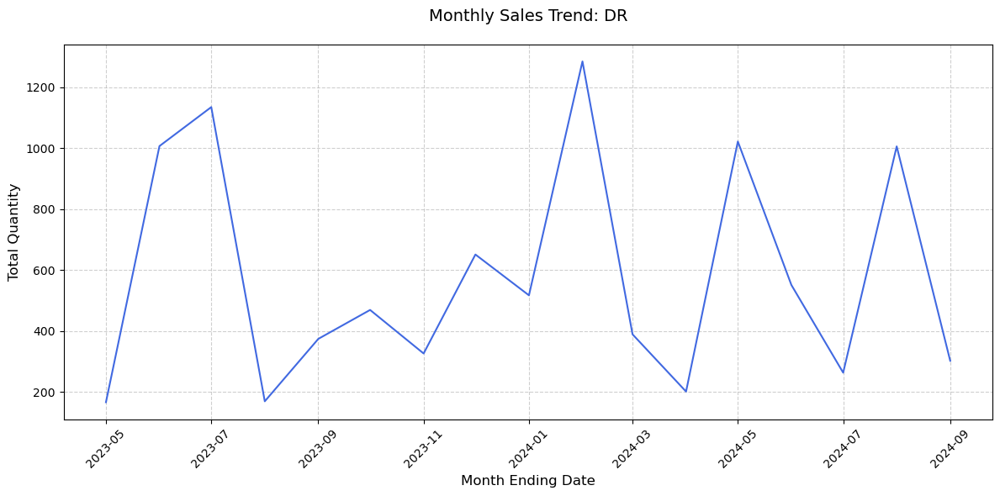

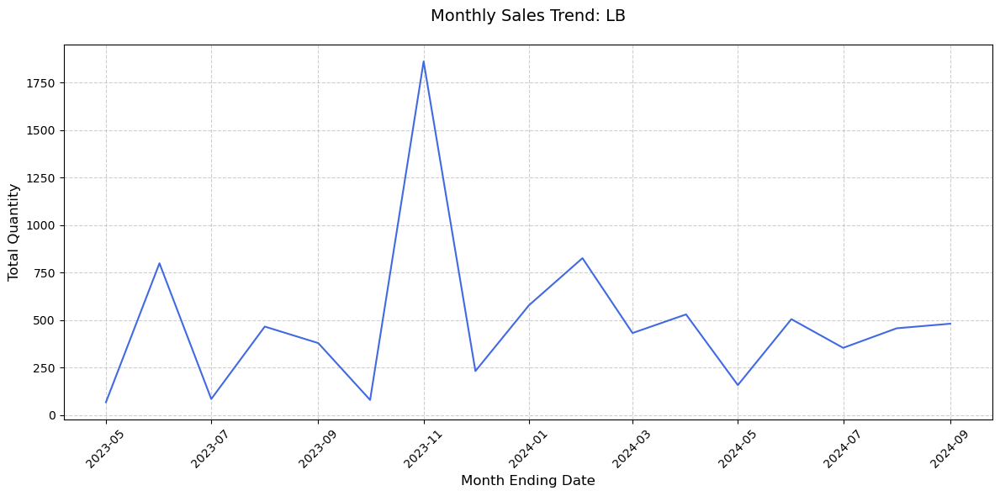

...

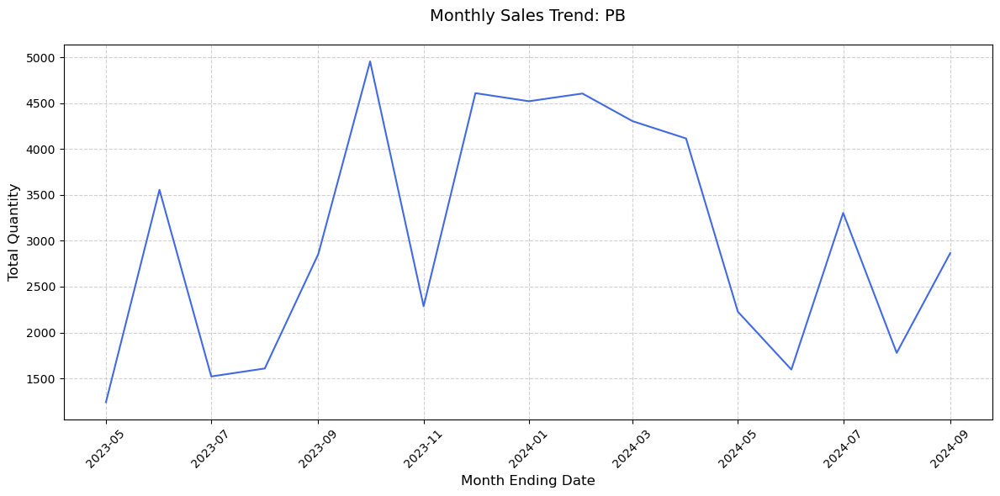

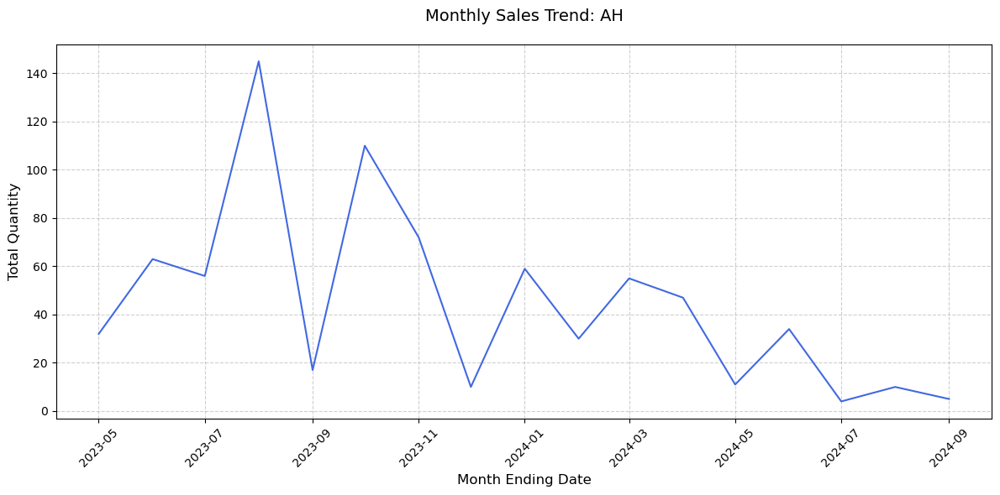

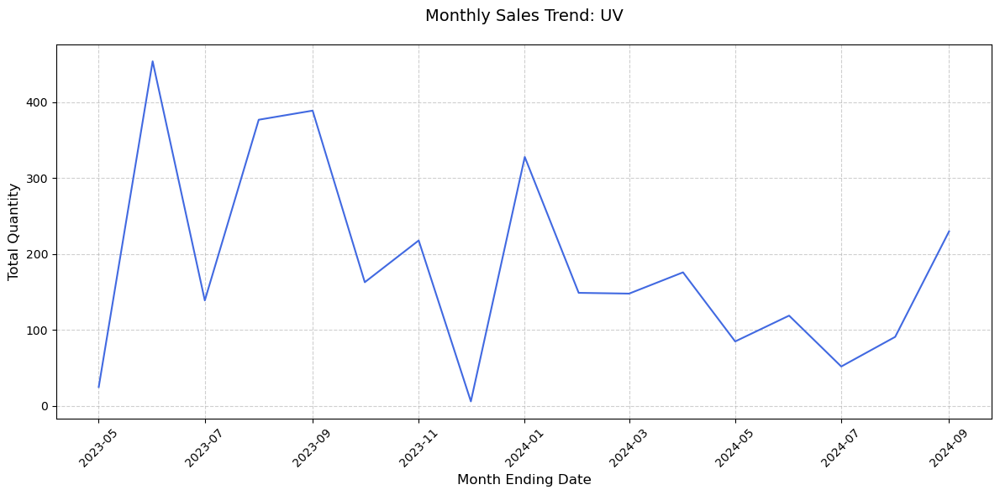

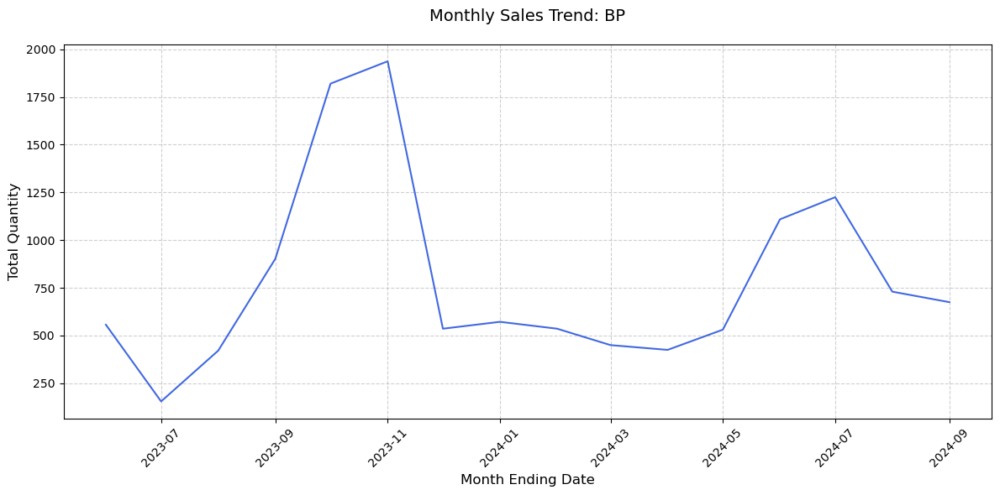

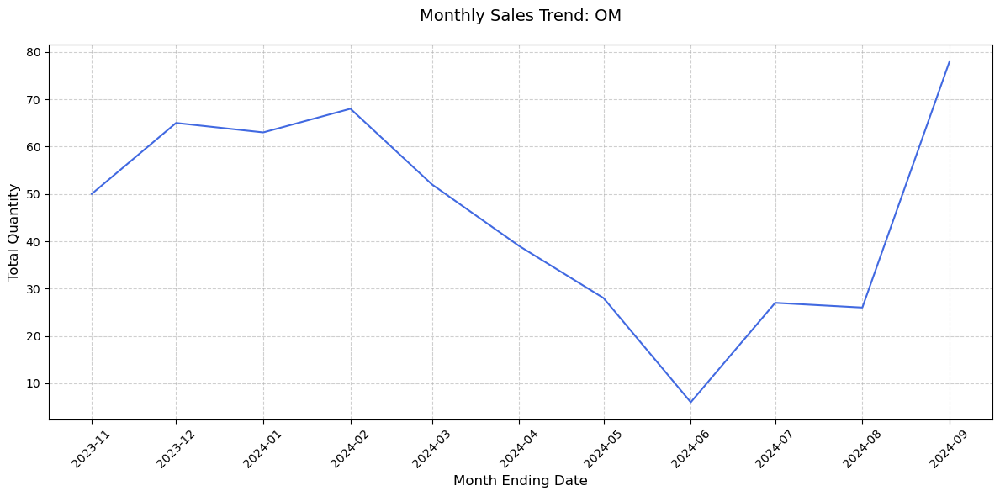

In [49]:
# Monthly Plots for the products at individual level

for product in products:
    product_data = df_monthly[df_monthly['Product'] == product] # create a boolean mask and apply to filter the data at product level
    
    plt.figure(figsize=(12,6))
    ax = plt.plot(product_data['Month'], product_data['Invoice_Quantity'],'royalblue')
    
    # Formatting
    #ax.xaxis.set_major_formatter(date_fmt)
    plt.title(f'Monthly Sales Trend: {product}', fontsize=14, pad=20)
    plt.xlabel('Month Ending Date', fontsize=12)
    plt.ylabel('Total Quantity', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

## Stationarity check

## Augmented Dickey-Fuller (ADF) Test:
A formal statistical test for stationarity (null hypothesis: the series is non-stationary)

Interpretation:

If p-value ≤ 0.05, reject the null hypothesis (series is stationary).
If p-value > 0.05, the series is non-stationary.

In [50]:
from statsmodels.tsa.stattools import adfuller

In [51]:
def adf_test(series,product):
    result = adfuller(series, autolag='AIC')
    print(f'ADF Statistic: {result[0]} of product {product}')
    print(f'p-value: {result[1]} of product {product}')
    print(f"{'stationary' if result[1] <= 0.05 else 'non-stationary'}")
    print('Critical Values:')
    for k, v in result[4].items():
        print(f'   {k}: {v}  of product {product}')

In [52]:
for product in products:
     
    print(f"{'##'*10} {product} {'##'*10}")
    product_data=(df_new[df_new['Product'] == product]
                       .groupby('Invoice_Date')['Invoice_Quantity']
                       .sum()
                       .reset_index())
    if len(product_data)<10:
        print(f"skipping the the product {product} as it sample size is {len(product_data)}")
    else:
        adf_test(product_data['Invoice_Quantity'],product)


#################### MD ####################
ADF Statistic: -18.785692750916844 of product MD
p-value: 2.0238590237182837e-30 of product MD
stationary
Critical Values:
   1%: -3.4471856790801514  of product MD
   5%: -2.868960436182993  of product MD
   10%: -2.5707229006220524  of product MD
#################### HD ####################
ADF Statistic: -17.737644404029233 of product HD
p-value: 3.4131319784395635e-30 of product HD
stationary
Critical Values:
   1%: -3.447099431978147  of product HD
   5%: -2.8689225261604263  of product HD
   10%: -2.57070269105012  of product HD
#################### LR ####################
ADF Statistic: -17.61448206917149 of product LR
p-value: 3.8653063733648685e-30 of product LR
stationary
Critical Values:
   1%: -3.4464400156784927  of product LR
   5%: -2.868632644097719  of product LR
   10%: -2.5705481612974577  of product LR
#################### DR ####################
ADF Statistic: -11.356043757734517 of product DR
p-value: 9.729186403574339e

## KPSS Test 
(Complementary Check):KPSS tests the null hypothesis that the series is stationary:
Interpretation:

If p-value < 0.05, reject the null (series is non-stationary).
Use ADF and KPSS together for robust conclusions.

In [53]:
from statsmodels.tsa.stattools import kpss

In [54]:
def kpss_test(series,product):
    result = kpss(series, regression='c')
    print(f'KPSS Statistic: {result[0]} of product {product}')
    print(f'p-value: {result[1]} of product {product}')
    print(f"{'stationary' if result[1] >= 0.05 else 'non-stationary'}")
    print('Critical Values:')
    for k, v in result[3].items():
        print(f'   {k}: {v} of the product {product}')

In [55]:
for product in products:
    print(f"{'=='*10} {product} {'=='*10}")
    product_data=(df_new[df_new['Product'] == product]
                   .groupby('Invoice_Date')['Invoice_Quantity']
                   .sum()
                   .reset_index())
    if len(product_data)>10:
        kpss_test(product_data['Invoice_Quantity'],product)

==================== MD ====================
KPSS Statistic: 0.0762921438475817 of product MD
p-value: 0.1 of product MD
stationary
Critical Values:
   10%: 0.347 of the product MD
   5%: 0.463 of the product MD
   2.5%: 0.574 of the product MD
   1%: 0.739 of the product MD
==================== HD ====================
KPSS Statistic: 1.1292856564961093 of product HD
p-value: 0.01 of product HD
non-stationary
Critical Values:
   10%: 0.347 of the product HD
   5%: 0.463 of the product HD
   2.5%: 0.574 of the product HD
   1%: 0.739 of the product HD
==================== LR ====================
KPSS Statistic: 0.1583117017819487 of product LR
p-value: 0.1 of product LR
stationary
Critical Values:
   10%: 0.347 of the product LR
   5%: 0.463 of the product LR
   2.5%: 0.574 of the product LR
   1%: 0.739 of the product LR
==================== DR ====================
KPSS Statistic: 0.060824325327513536 of product DR
p-value: 0.1 of product DR
stationary
Critical Values:
   10%: 0.347 of

/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is great

In [56]:
## The products OM and HD are non-statitionary so we can not apply ARIMA directly as it needs stationary data

Autocorrelation Function (ACF) Plot

Check for decaying autocorrelation:
Slow decay in ACF suggests non-stationarity.

In [57]:
from statsmodels.graphics.tsaplots import plot_acf

In [58]:
def plottting_acf(series,product):
    return plot_acf(series, lags=30)

==================== MD ====================


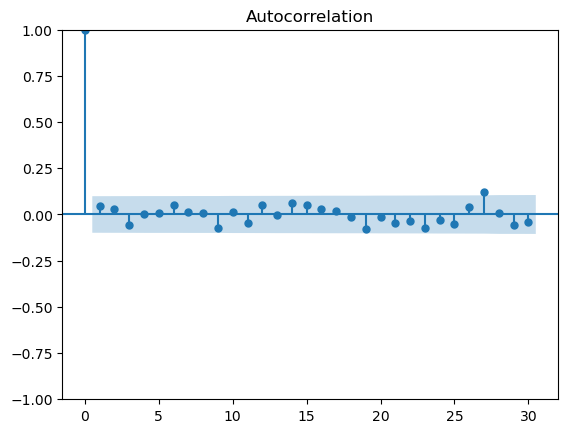

==================== HD ====================


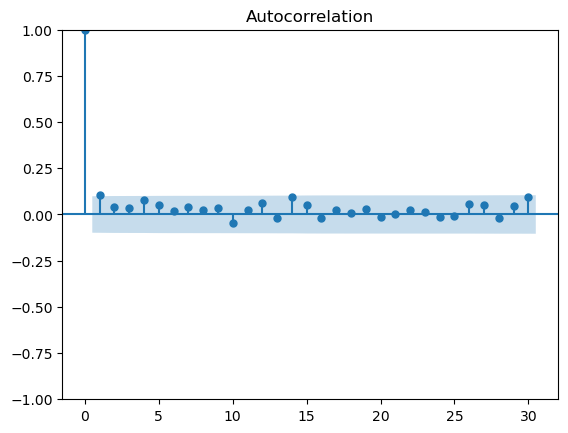

==================== LR ====================


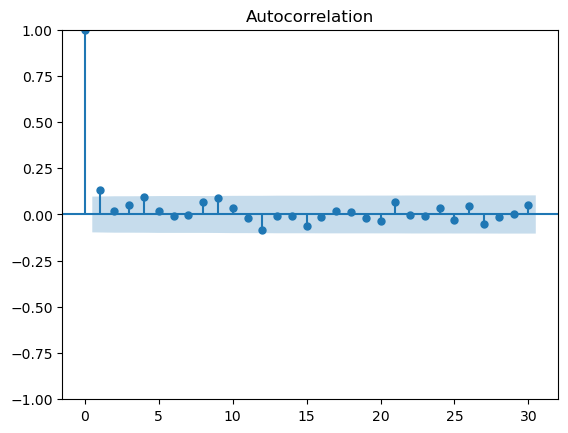

==================== DR ====================


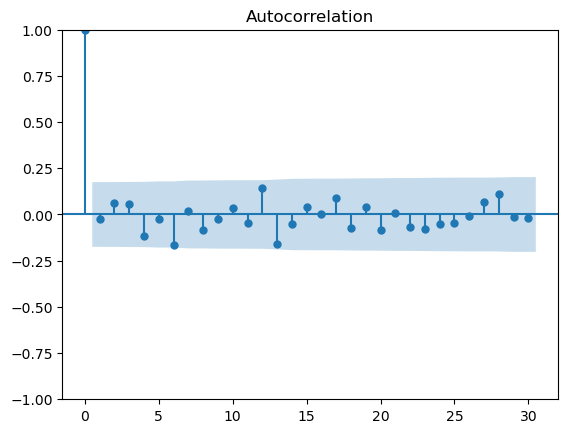

==================== LB ====================


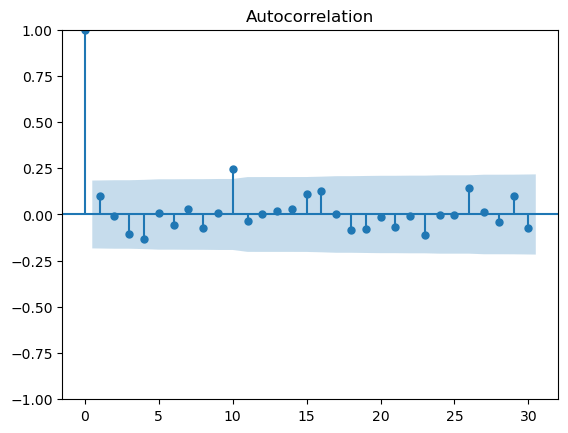

==================== LM ====================


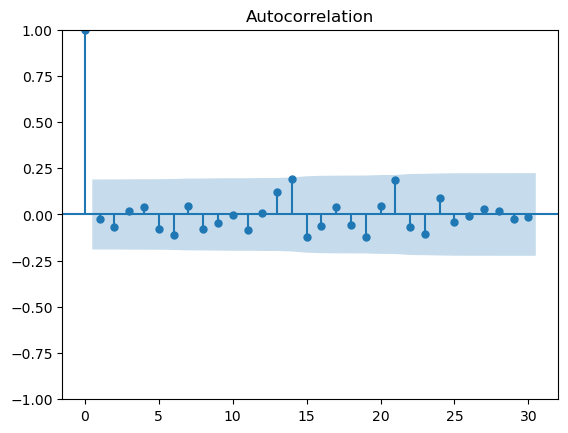

==================== EM ====================


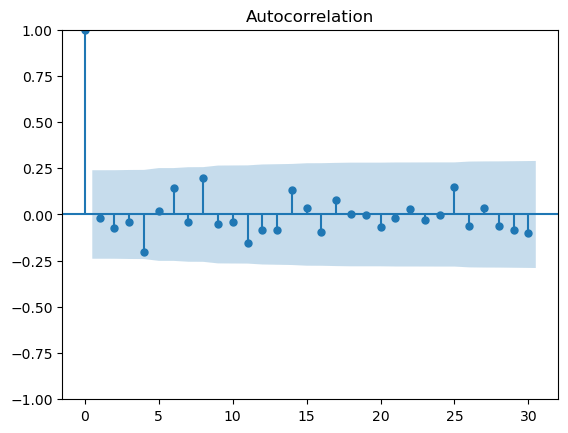

==================== LP ====================


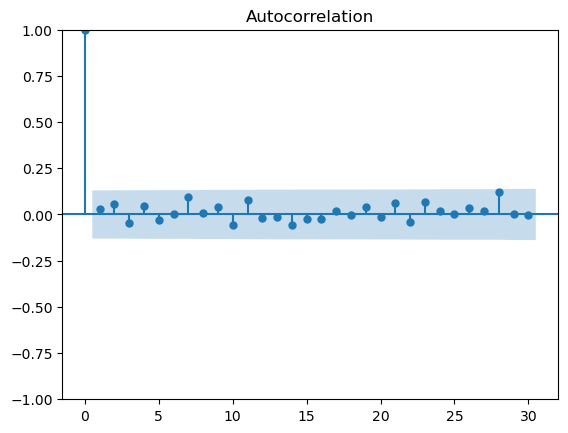

==================== LF ====================


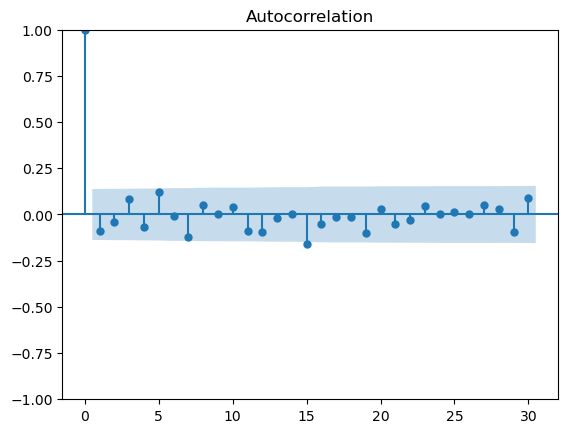

==================== FA ====================


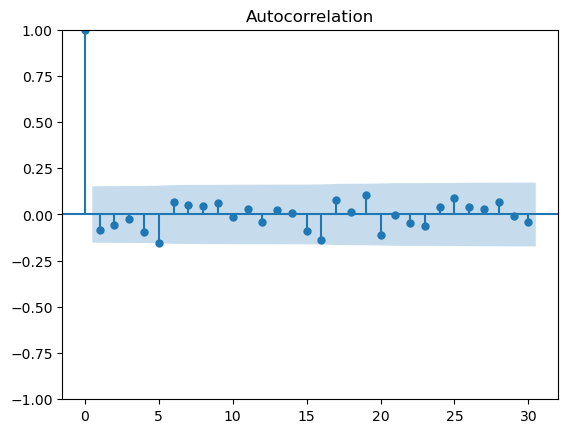

==================== PB ====================


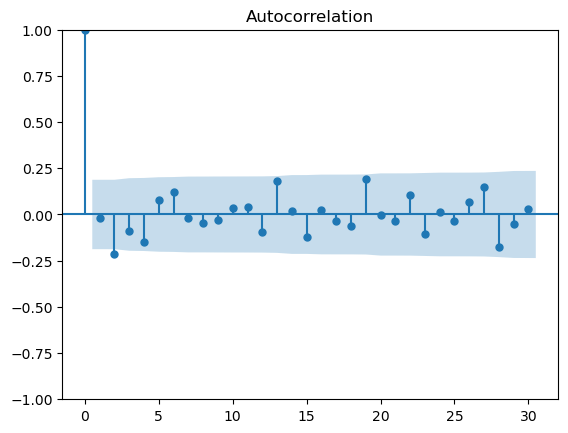

==================== AH ====================


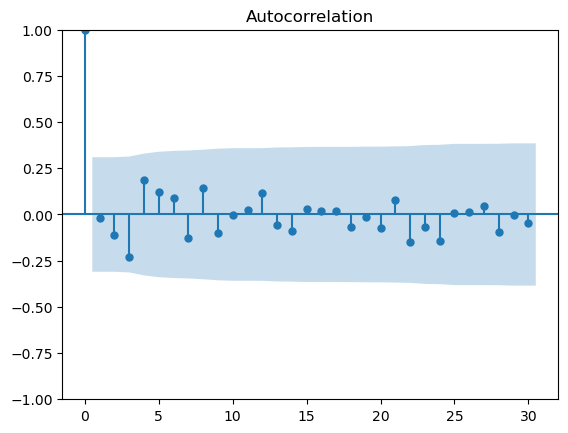

==================== UV ====================


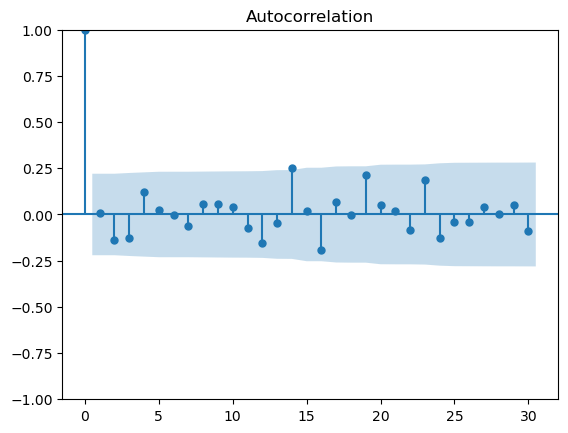

==================== BP ====================


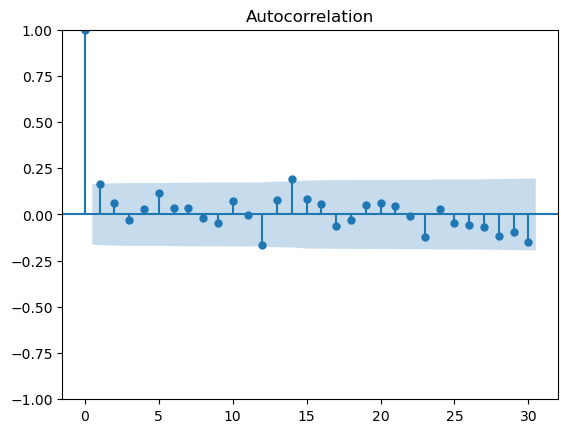

==================== OM ====================


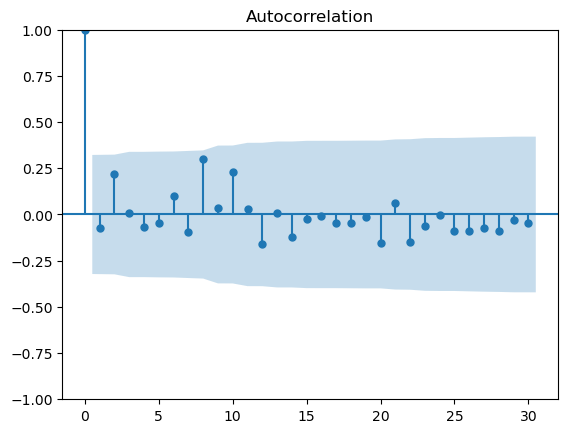

In [59]:
for product in products:
    print(f"{'=='*10} {product} {'=='*10}")
    product_data=(df_new[df_new['Product'] == product]
                   .groupby('Invoice_Date')['Invoice_Quantity']
                   .sum()
                   .reset_index())
    if len(product_data)>=10:
        plottting_acf(product_data['Invoice_Quantity'], product)
        plt.show()

In [60]:
## Check for the transformation methods using BOX-COX

In [61]:
from scipy.stats import boxcox, boxcox_normmax
from scipy.special import inv_boxcox

In [62]:
#find the lambda value for individual products

In [63]:
for product in products:
    product_data=(df_new[df_new['Product']==product]
                                            .groupby('Invoice_Date')["Invoice_Quantity"]
                  .sum().reset_index())
    
    
    if len(product_data) > 10:                                       
        optimal_lambda = boxcox_normmax(product_data['Invoice_Quantity'])
        print(f"Optimal lambda for the product {product}: {optimal_lambda:.4f}")  # Often ~0.2 for economic data
    else:
        print(f'Skipping the product:{product} as the sample length is very small')

Optimal lambda for the product MD: 0.2926
Optimal lambda for the product HD: 0.2235
Optimal lambda for the product LR: 0.3665
Optimal lambda for the product DR: 0.0853
Optimal lambda for the product LB: 0.0971
Optimal lambda for the product LM: 0.0999
Optimal lambda for the product EM: -0.0612
Optimal lambda for the product LP: 0.2871
Optimal lambda for the product LF: 0.1815
Optimal lambda for the product FA: 0.0695
Optimal lambda for the product PB: 0.4497
Optimal lambda for the product AH: 0.1031
Optimal lambda for the product UV: -0.1275
Optimal lambda for the product BP: -0.0113
Optimal lambda for the product OM: -0.0258


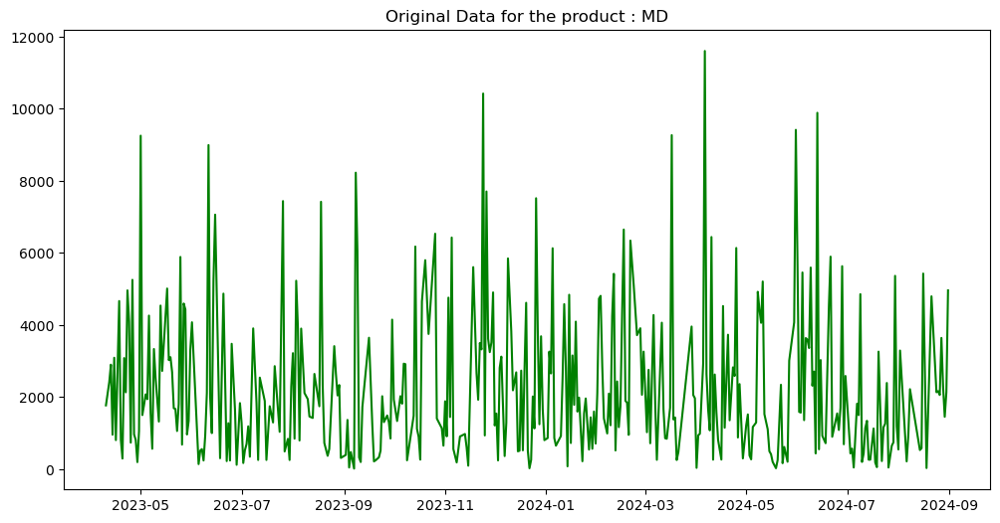

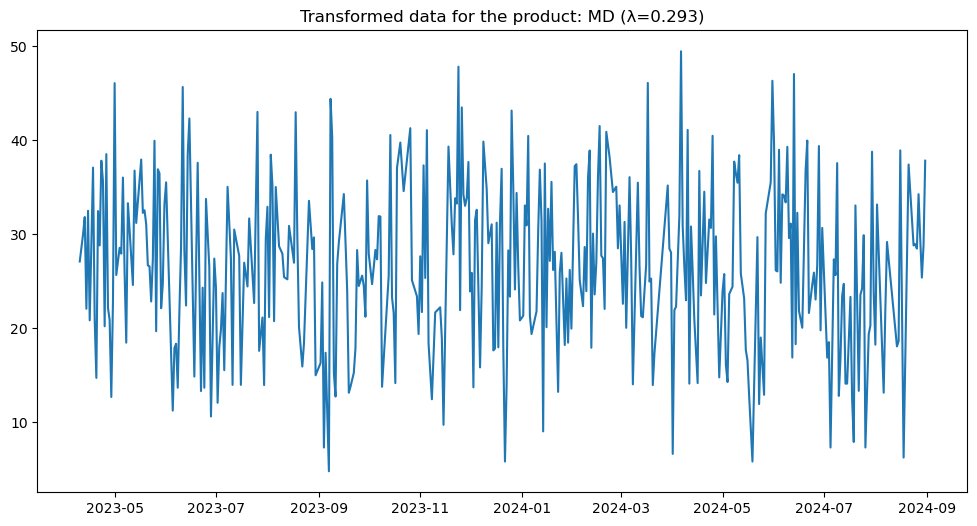

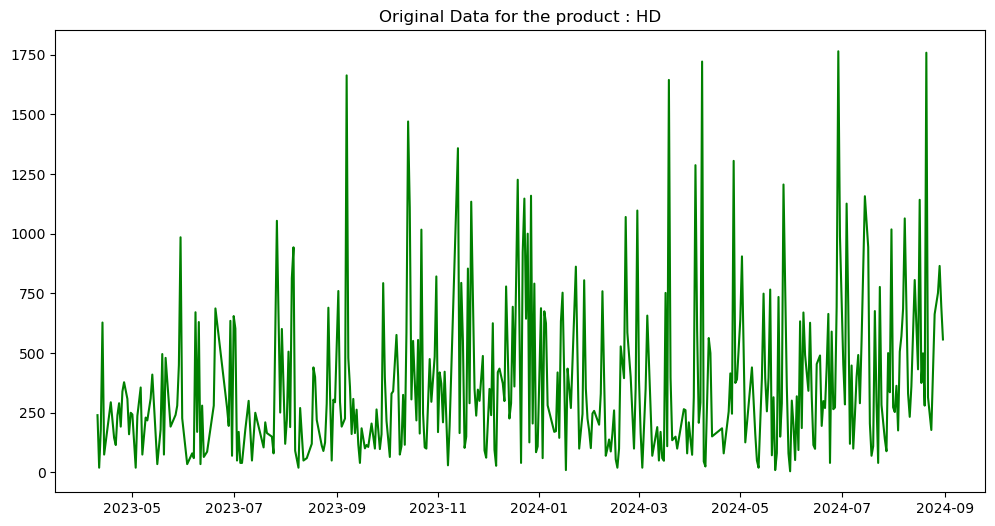

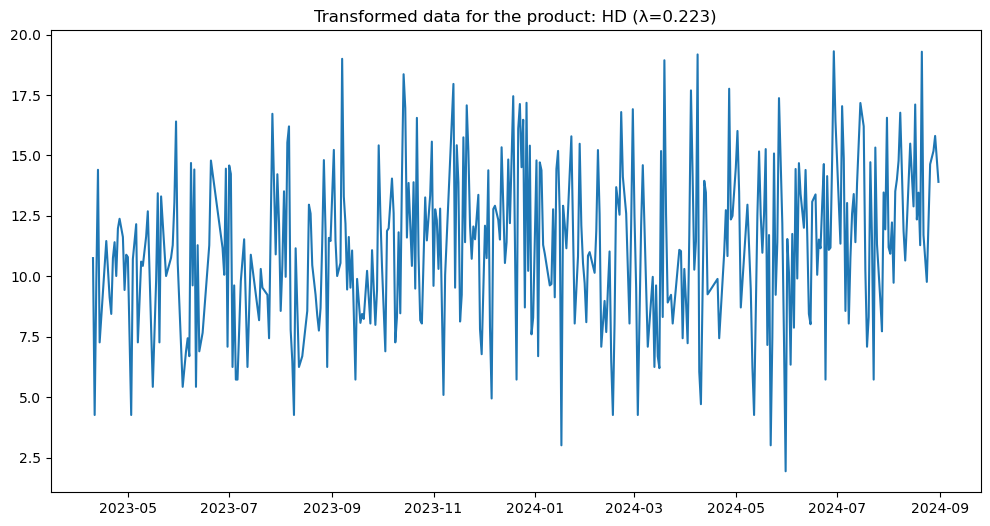

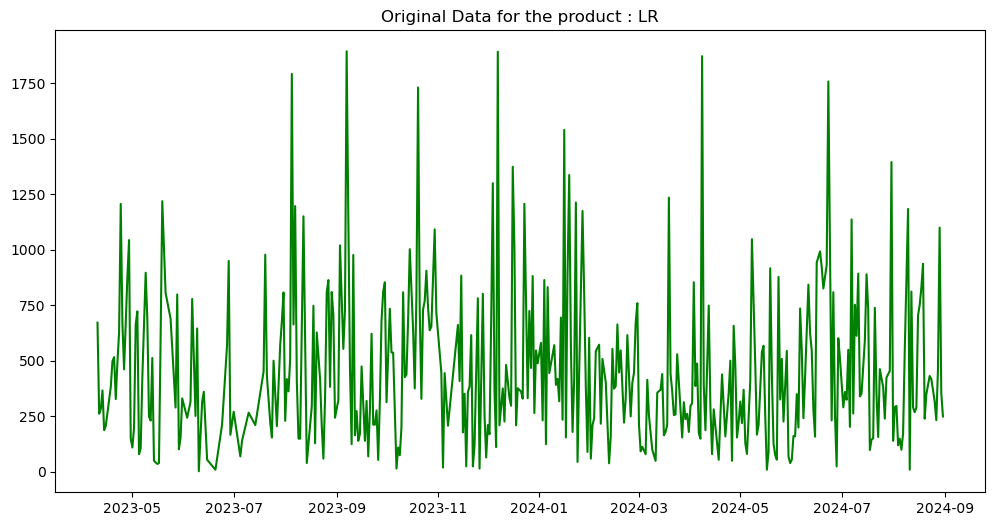

...

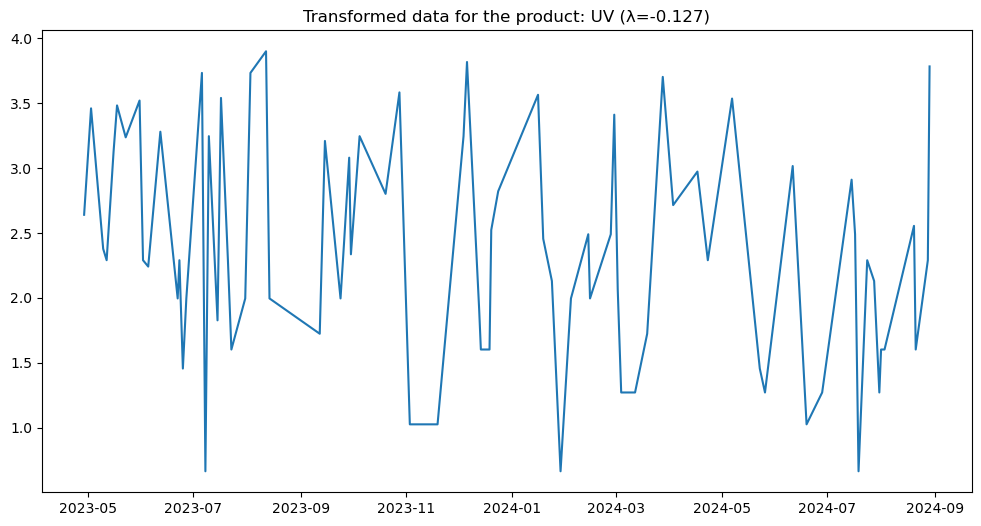

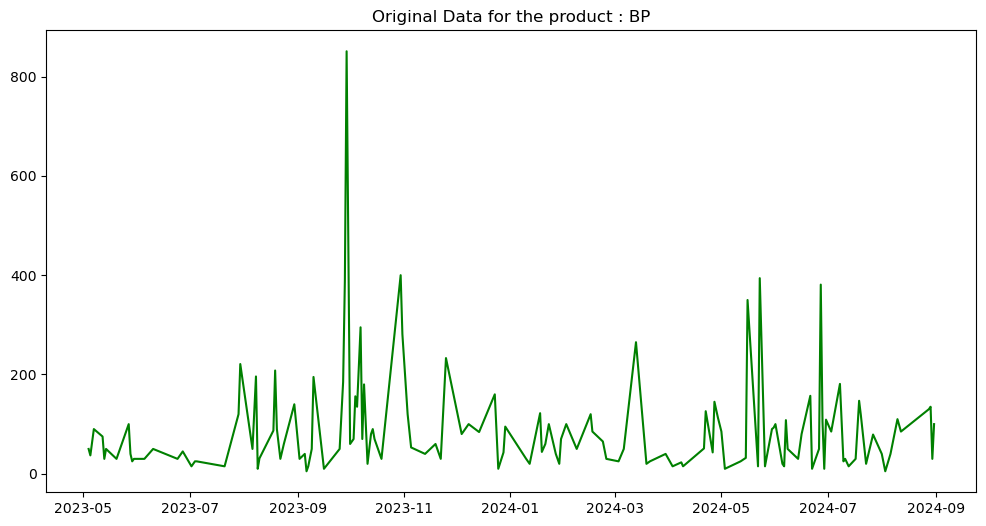

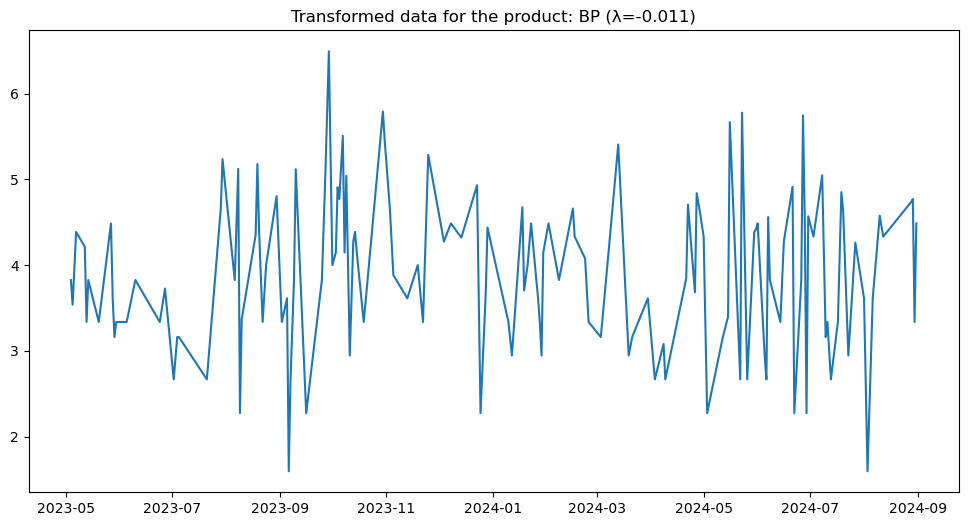

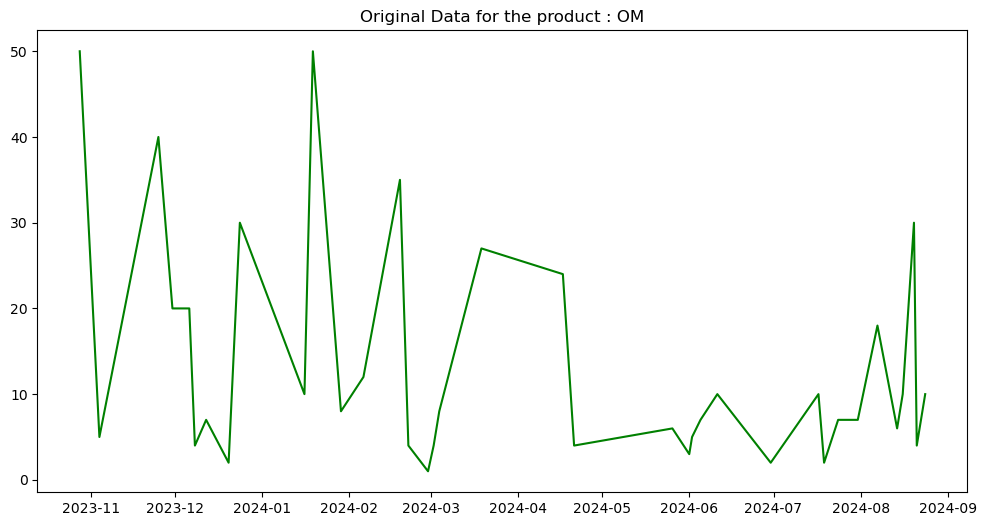

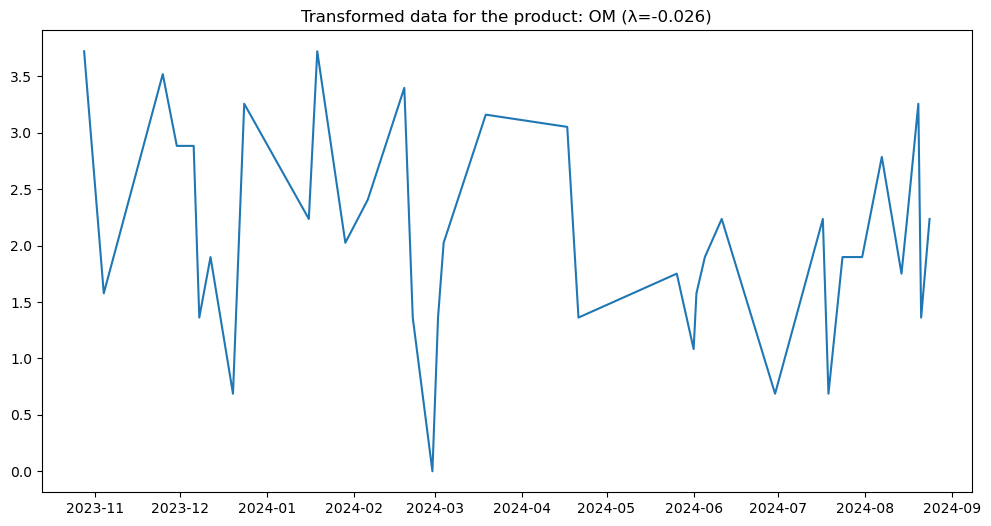

In [64]:
for product in products:
    product_data=(df_new[df_new['Product']==product]
                                            .groupby('Invoice_Date')["Invoice_Quantity"]
                  .sum().reset_index())
    
    
    if len(product_data) > 10:                                       
        optimal_lambda = boxcox_normmax(product_data['Invoice_Quantity'])
        y=product_data['Invoice_Quantity'].copy()
        y_transformed=boxcox(y, lmbda=optimal_lambda)
        # Plot original vs. transformed data
        plt.figure(figsize=(12, 6))
        plt.plot(product_data['Invoice_Date'],y, label='Original',color='green')
        plt.title(f"Original Data for the product : {product}")
        plt.figure(figsize=(12, 6))
        plt.plot(product_data['Invoice_Date'],y_transformed, label='Box-Cox Transformed')
        plt.title(f"Transformed data for the product: {product} (λ={optimal_lambda:.3f})")
        plt.show()

## ARIMA

In [65]:
import pandas as pd
import numpy as np
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings('ignore')

In [66]:
# Create full daily date range for entire dataset
min_date = df['Invoice_Date'].min()
max_date = df['Invoice_Date'].max()
full_days = pd.date_range(start=min_date, end=max_date, freq='D')

def prepare_daily_product_data(product_df, product_id):
    """Create complete daily time series for a product without duplicate dates"""
    # 1. Filter to specific product
    product_data = product_df[product_df['Product'] == product_id].copy()
    
    # 2. Group by day and sum quantities (handles multiple invoices per day)
    daily_sales = product_data.groupby('Invoice_Date')['Invoice_Quantity'].sum().reset_index()
    
    # 3. Remove potential duplicate index entries
    daily_sales = daily_sales.set_index('Invoice_Date')
    if daily_sales.index.duplicated().any():
        daily_sales = daily_sales.groupby(level=0).sum()  # Sum any remaining duplicates
    
    # 4. Reindex to full date range
    daily_sales = daily_sales.reindex(full_days, fill_value=0)
    
    return daily_sales['Invoice_Quantity']

In [67]:
# Return Series with DateTimeIndex
def evaluate_arima(train, test, product_id):
    """Train ARIMA model and evaluate on test set"""
    # AutoARIMA for parameter tuning
    model = auto_arima(
        train,
        start_p=0, max_p=5,
        start_q=0, max_q=5,
        d=None, max_d=3,
        seasonal=True,  # Enable for daily seasonality
        m=7,           # Weekly seasonality (7 days)
        stepwise=True,
        suppress_warnings=True,
        error_action='ignore',
        trace=True
    )
    
    # Forecast test period
    forecast = model.predict(n_periods=len(test))
    
    return {
        'Product': product_id,
        'Parameters': str(model.order),
        'Seasonal_Parameters': str(model.seasonal_order),
        'MAE': mean_absolute_error(test, forecast),
        'RMSE': np.sqrt(mean_squared_error(test, forecast)),
        'R2_Score':r2_score(test,forecast)
    }, forecast



Processing MD
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=4139.450, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=4135.737, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=4133.583, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=4134.268, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=4554.622, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=4132.441, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=4133.651, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(2,0,0)(0,0,0)[7] intercept   : AIC=4133.053, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[7] intercept   : AIC=4132.739, Time=0.46 sec
 ARIMA(0,0,1)(0,0,0)[7] intercept   : AIC=4133.038, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[7] intercept   : AIC=4135.051, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[7]             : AIC=4299.407, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[7] intercept
Total fit time: 3.289 seconds


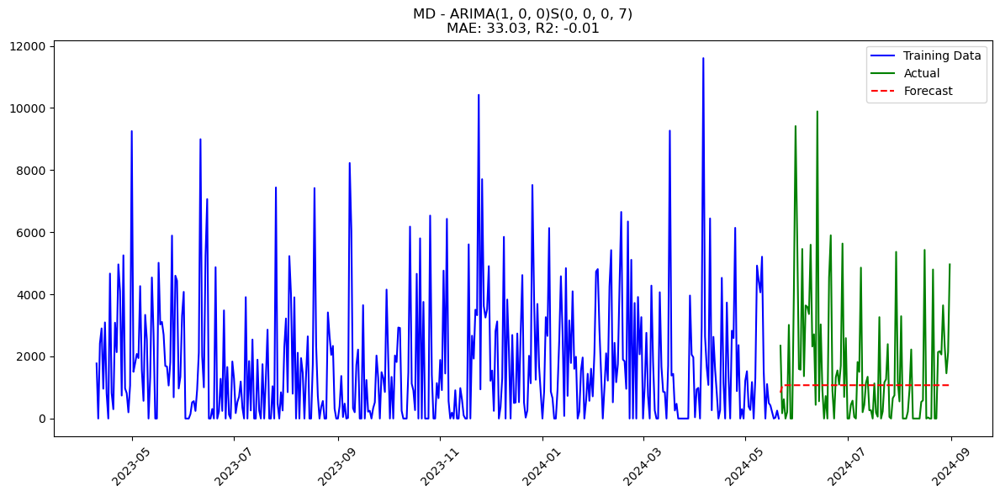

Results for MD:
ARIMA Order: (1, 0, 0)
Seasonal Order: (0, 0, 0, 7)
MAE: 33.03, RMSE: 39.01, R2: -0.01

Processing HD
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[7] intercept   : AIC=3596.734, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=3593.861, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=3512.306, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=3404.103, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=3591.861, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[7] intercept   : AIC=3403.529, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[7] intercept   : AIC=3404.345, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=3405.383, Time=0.39 sec
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=3392.555, Time=0.16 sec
 ARIMA(1,1,1)(1,0,0)[7] intercept   : AIC=3393.713, Time=0.38 sec
 ARIMA(1,1,1)(0,0,1)[7] intercept   : AIC=3393.588, Time=0.43 sec
 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=3395.202, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=3510.

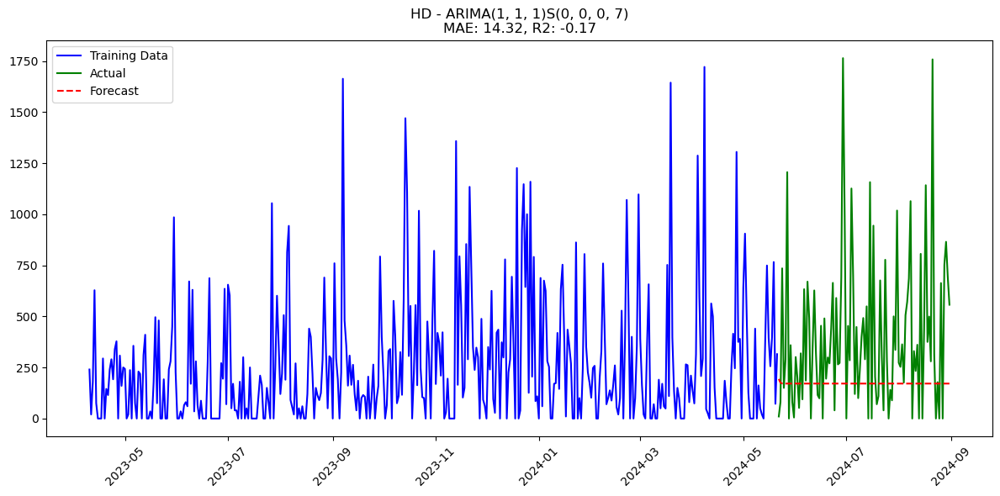

Results for HD:
ARIMA Order: (1, 1, 1)
Seasonal Order: (0, 0, 0, 7)
MAE: 14.32, RMSE: 17.16, R2: -0.17

Processing LR
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=3906.886, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=3908.831, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=3895.946, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=3898.245, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=4332.601, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=3894.212, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=3895.922, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[7] intercept   : AIC=3893.606, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[7] intercept   : AIC=3895.514, Time=0.28 sec
 ARIMA(2,0,0)(0,0,1)[7] intercept   : AIC=3895.501, Time=0.23 sec
 ARIMA(2,0,0)(1,0,1)[7] intercept   : AIC=3897.505, Time=0.51 sec
 ARIMA(3,0,0)(0,0,0)[7] intercept   : AIC=3893.650, 

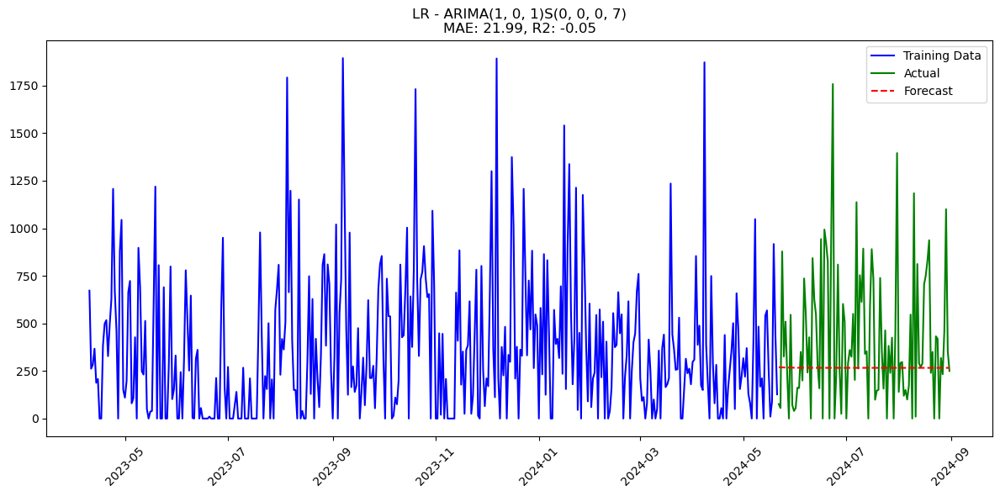

Results for LR:
ARIMA Order: (1, 0, 1)
Seasonal Order: (0, 0, 0, 7)
MAE: 21.99, RMSE: 27.42, R2: -0.05

Processing DR
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=1540.963, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=1537.348, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=1539.204, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=1539.061, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=1641.269, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=1537.379, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=1537.261, Time=0.06 sec
 ARIMA(0,0,0)(0,0,2)[7] intercept   : AIC=1539.025, Time=0.11 sec
 ARIMA(0,0,0)(1,0,2)[7] intercept   : AIC=1539.109, Time=0.42 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=1539.079, Time=0.07 sec
 ARIMA(1,0,1)(0,0,1)[7] intercept   : AIC=1540.353, Time=0.35 sec
 ARIMA(0,0,0)(0,0,1)[7]             : AIC=1617.028, Time=0.03 sec

Best model:  ARIMA(0,0,0)(0,0,1)[7] intercept


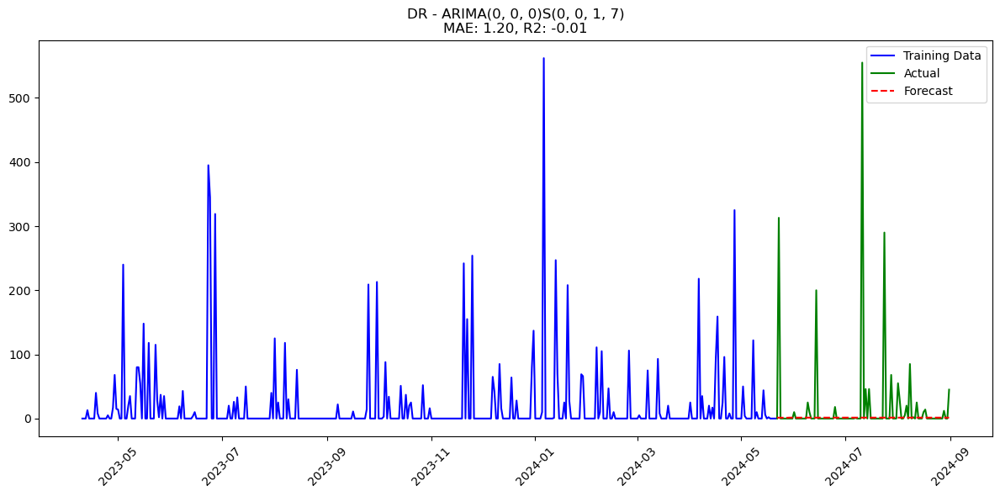

Results for DR:
ARIMA Order: (0, 0, 0)
Seasonal Order: (0, 0, 1, 7)
MAE: 1.20, RMSE: 1.47, R2: -0.01

Processing LB
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=1783.894, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=1772.899, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=1776.037, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=1871.489, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=1771.332, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=1772.880, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(2,0,0)(0,0,0)[7] intercept   : AIC=1768.721, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[7] intercept   : AIC=1769.834, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[7] intercept   : AIC=1769.786, Time=0.12 sec
 ARIMA(2,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(3,0,0)(0,0,0)[7] intercept   : AIC=1768.039, Time=0.10 se

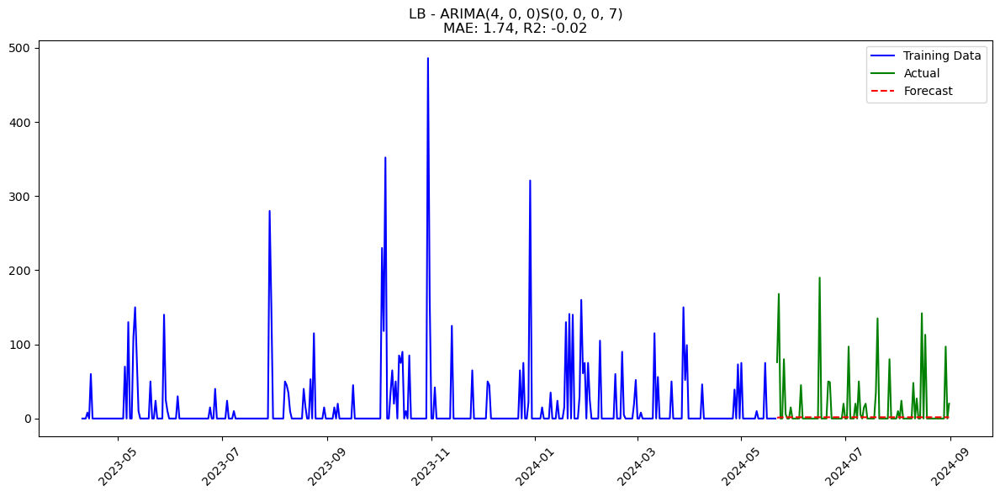

Results for LB:
ARIMA Order: (4, 0, 0)
Seasonal Order: (0, 0, 0, 7)
MAE: 1.74, RMSE: 2.20, R2: -0.02

Processing LM
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=1848.661, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=1844.661, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=1848.232, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=1848.257, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=1923.952, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=1846.579, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=1846.584, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=1846.292, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[7] intercept   : AIC=1846.314, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[7] intercept   : AIC=1847.828, Time=0.16 sec

Best model:  ARIMA(0,0,0)(0,0,0)[7] intercept
Total fit time: 0.714 seconds


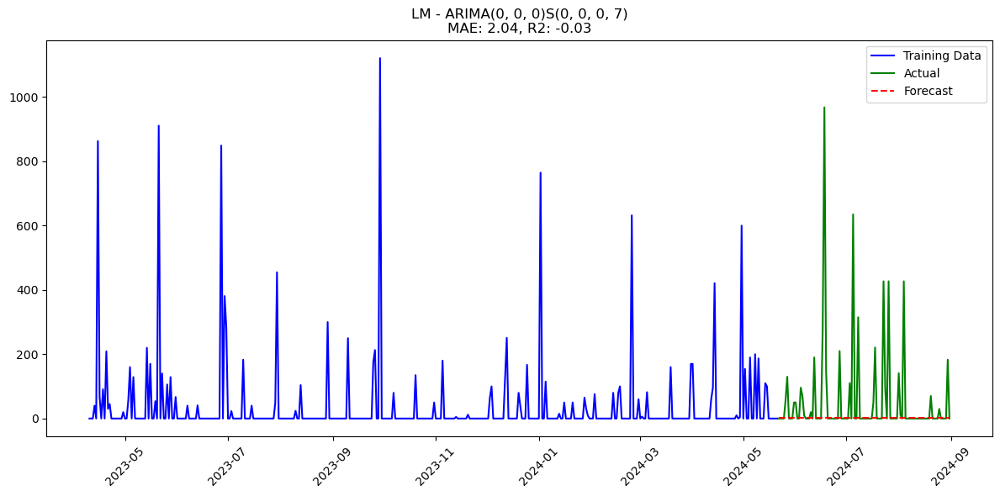

Results for LM:
ARIMA Order: (0, 0, 0)
Seasonal Order: (0, 0, 0, 7)
MAE: 2.04, RMSE: 2.72, R2: -0.03

Processing EM
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=1679.135, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=1678.734, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=1679.632, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=1679.880, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=1733.783, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=1677.842, Time=0.07 sec
 ARIMA(0,0,0)(2,0,0)[7] intercept   : AIC=1679.283, Time=0.16 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=1678.059, Time=0.06 sec
 ARIMA(0,0,0)(2,0,1)[7] intercept   : AIC=1680.937, Time=0.65 sec
 ARIMA(0,0,1)(1,0,0)[7] intercept   : AIC=1679.644, Time=0.09 sec
 ARIMA(1,0,1)(1,0,0)[7] intercept   : AIC=1680.798, Time=0.32 sec
 ARIMA(0,0,0)(1,0,0)[7]             : AIC=1718.910, Time=0.03 sec

Best model:  ARIMA(0,0,0)(1,0,0)[7] intercept
To

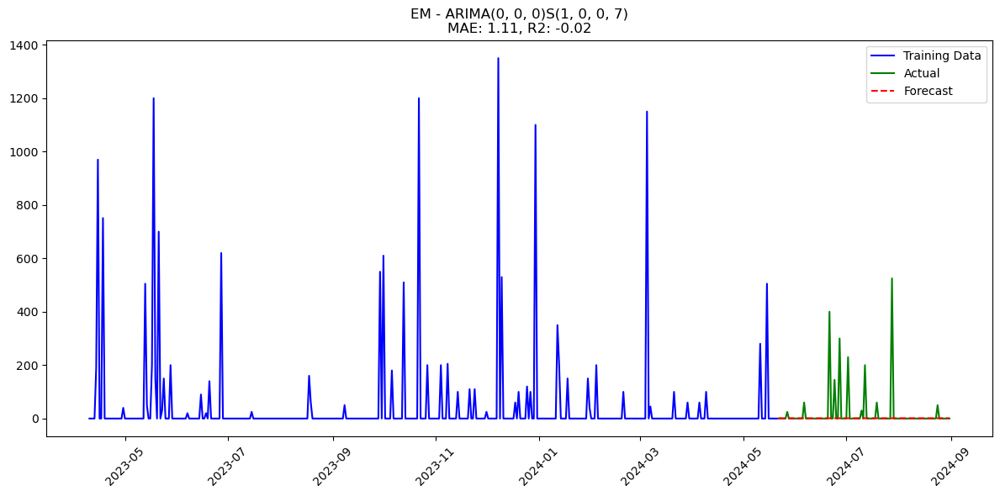

Results for EM:
ARIMA Order: (0, 0, 0)
Seasonal Order: (1, 0, 0, 7)
MAE: 1.11, RMSE: 1.59, R2: -0.02

Processing LP
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=3047.350, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=3043.475, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=3046.934, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=3046.952, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=3232.982, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=3045.389, Time=0.11 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=3045.383, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=3045.001, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[7] intercept   : AIC=3045.024, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[7] intercept   : AIC=3046.911, Time=0.28 sec

Best model:  ARIMA(0,0,0)(0,0,0)[7] intercept
Total fit time: 1.199 seconds


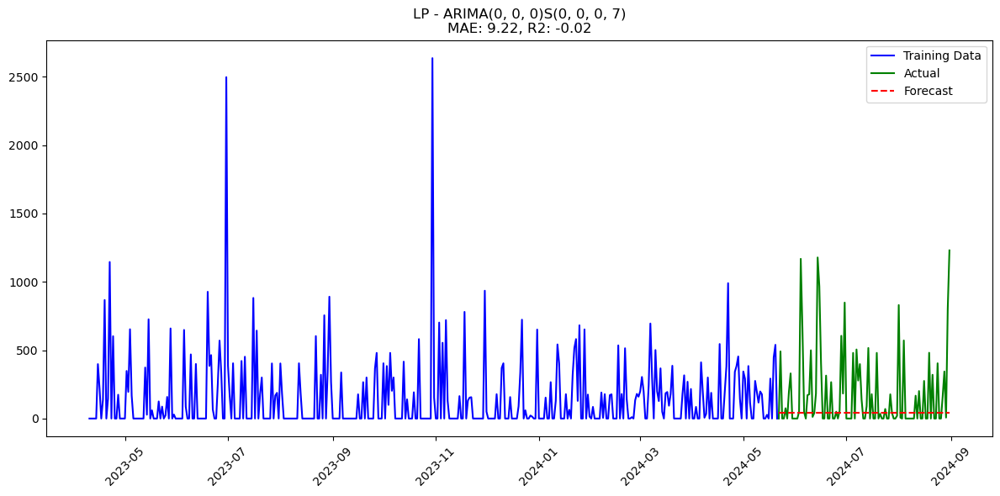

Results for LP:
ARIMA Order: (0, 0, 0)
Seasonal Order: (0, 0, 0, 7)
MAE: 9.22, RMSE: 10.62, R2: -0.02

Processing LF
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=2553.517, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=2556.219, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=2556.216, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=2736.362, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=2555.226, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=2555.222, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=2554.605, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[7] intercept   : AIC=2554.608, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[7] intercept   : AIC=2556.605, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[7] intercept
Total fit time: 1.128 seconds


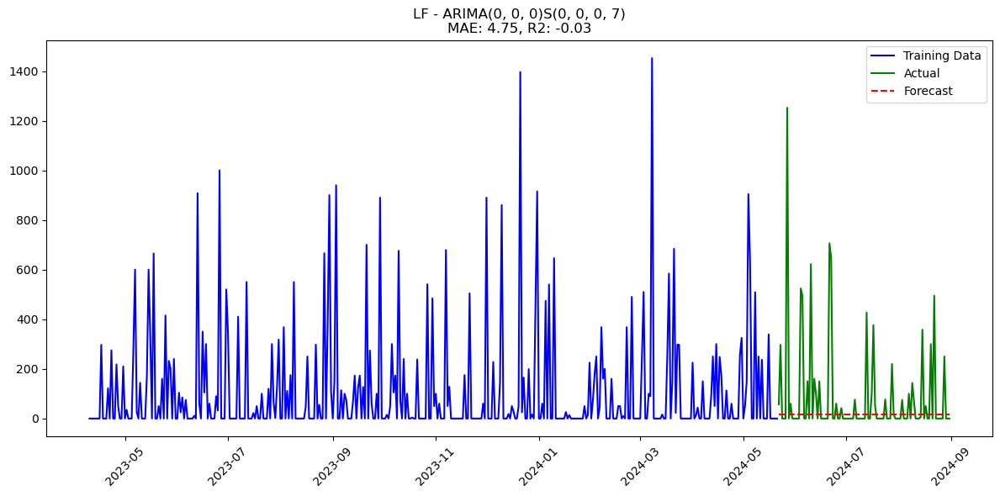

Results for LF:
ARIMA Order: (0, 0, 0)
Seasonal Order: (0, 0, 0, 7)
MAE: 4.75, RMSE: 5.22, R2: -0.03

Processing FA
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=1692.358, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=1694.645, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=1691.657, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=1691.816, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=1844.408, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=1696.278, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=1693.646, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=1693.646, Time=0.35 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=1691.840, Time=0.09 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=1695.452, Time=0.92 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=1690.373, Time=0.08 sec
 ARIMA(0,0,0)(2,0,0)[7] intercept   : AIC=1692.357, Time=0.17 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=1690.55

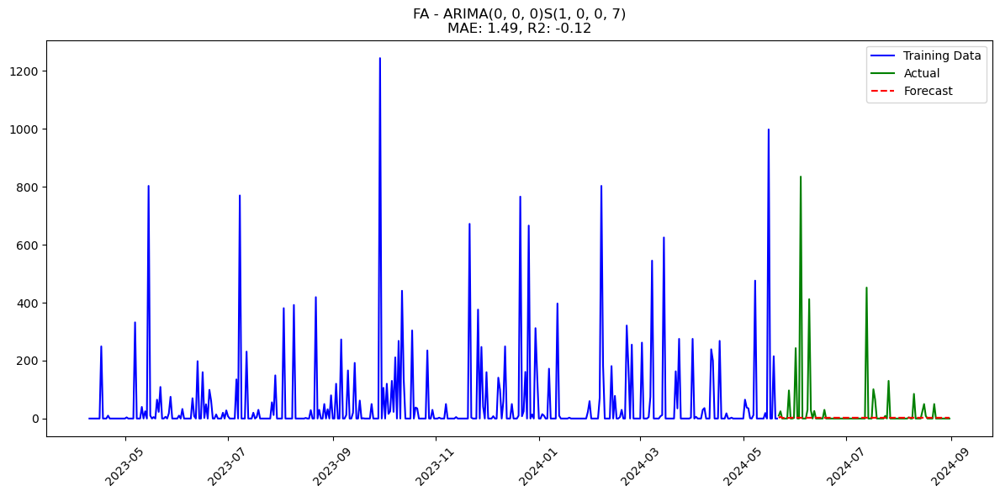

Results for FA:
ARIMA Order: (0, 0, 0)
Seasonal Order: (1, 0, 0, 7)
MAE: 1.49, RMSE: 1.64, R2: -0.12

Processing PB
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[7] intercept   : AIC=2674.765, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=2677.494, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=2578.734, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=2414.735, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=2675.494, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[7] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=2416.703, Time=0.69 sec
 ARIMA(0,1,1)(0,0,2)[7] intercept   : AIC=2416.680, Time=0.56 sec
 ARIMA(0,1,1)(1,0,0)[7] intercept   : AIC=2414.704, Time=0.24 sec
 ARIMA(0,1,1)(2,0,0)[7] intercept   : AIC=2416.702, Time=0.42 sec
 ARIMA(0,1,1)(2,0,1)[7] intercept   : AIC=2418.703, Time=0.72 sec
 ARIMA(0,1,0)(1,0,0)[7] intercept   : AIC=2673.556, Time=0.06 sec
 ARIMA(1,1,1)(1,0,0)[7] intercept   : AIC=inf, Time=0.

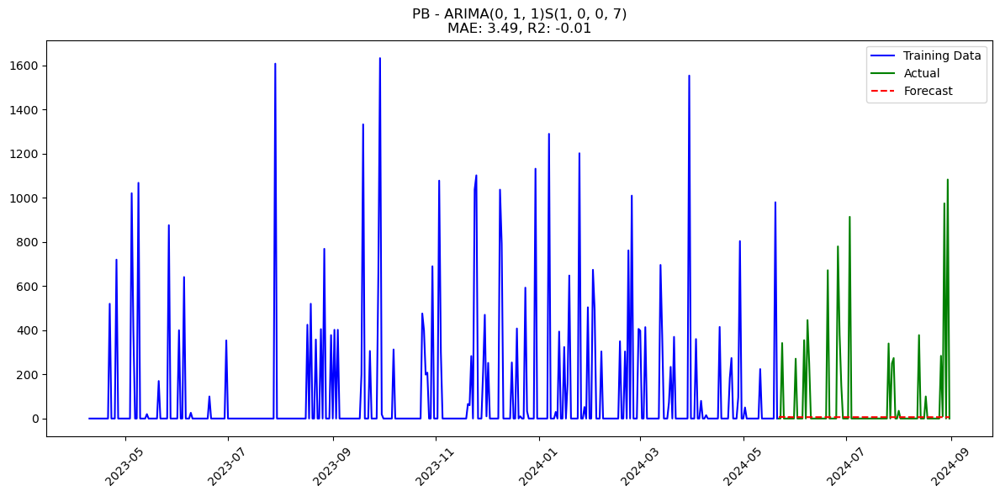

Results for PB:
ARIMA Order: (0, 1, 1)
Seasonal Order: (1, 0, 0, 7)
MAE: 3.49, RMSE: 4.31, R2: -0.01

Processing AH
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=515.216, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=512.802, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=514.119, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=514.107, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=548.049, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=513.468, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=513.438, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=513.207, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[7] intercept   : AIC=513.182, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[7] intercept   : AIC=515.179, Time=0.23 sec

Best model:  ARIMA(0,0,0)(0,0,0)[7] intercept
Total fit time: 1.046 seconds


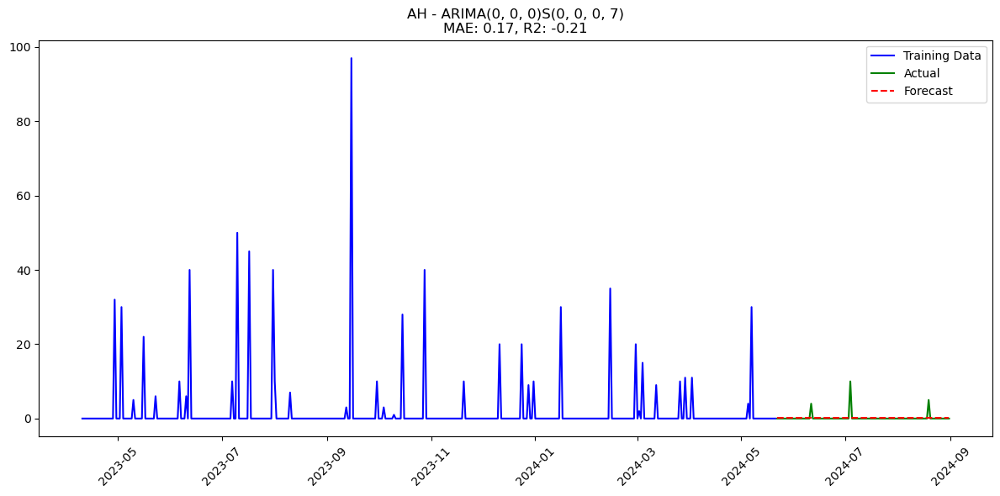

Results for AH:
ARIMA Order: (0, 0, 0)
Seasonal Order: (0, 0, 0, 7)
MAE: 0.17, RMSE: 0.24, R2: -0.21

Processing UV
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=923.584, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=919.588, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=919.783, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=920.297, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=981.064, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=921.355, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[7] intercept   : AIC=921.367, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=917.996, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=919.801, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=921.960, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[7] intercept   : AIC=917.311, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[7] intercept   : AIC=919.082, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[7] intercept   : AIC=919.105, Time=0.11 

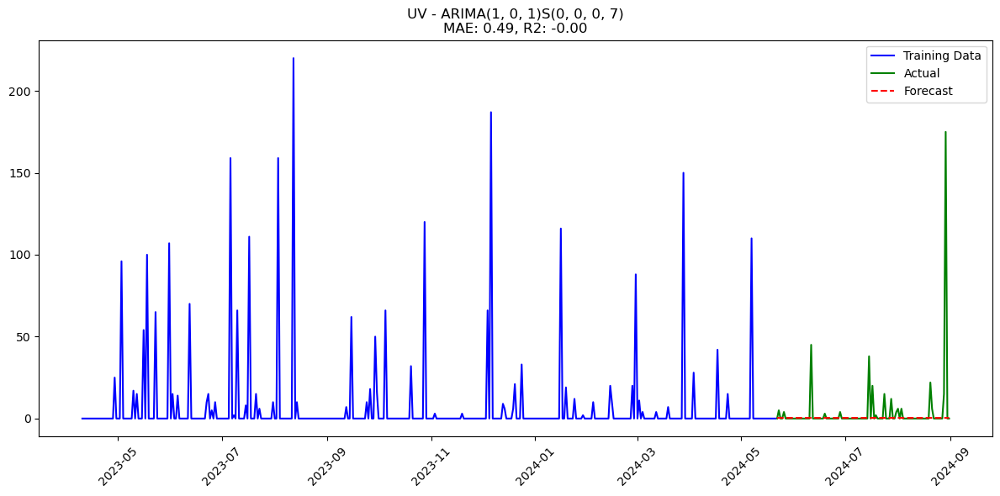

Results for UV:
ARIMA Order: (1, 0, 1)
Seasonal Order: (0, 0, 0, 7)
MAE: 0.49, RMSE: 0.66, R2: -0.00

Processing BP
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[7] intercept   : AIC=1968.295, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=1964.583, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=1958.216, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=1960.032, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=2070.830, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=1957.329, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=1958.176, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=1960.142, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[7] intercept   : AIC=1955.801, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[7] intercept   : AIC=1956.571, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[7] intercept   : AIC=1956.518, Time=0.13 sec
 ARIMA(2,0,0)(1,0,1)[7] intercept   : AIC=1958.465, Time=0.55 sec
 ARIMA(3,0,0)(0,0,0)[7] intercept   : AIC=1957.53

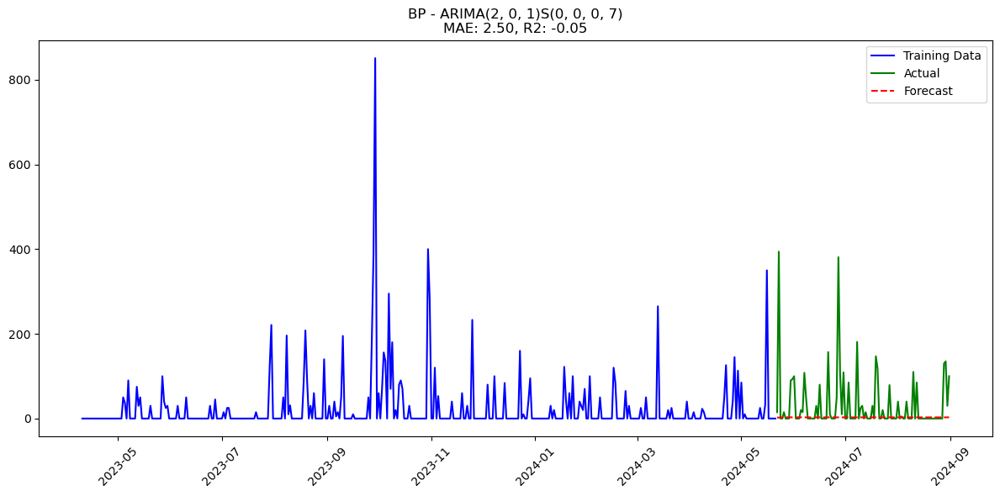

Results for BP:
ARIMA Order: (2, 0, 1)
Seasonal Order: (0, 0, 0, 7)
MAE: 2.50, RMSE: 3.05, R2: -0.05

Processing OM
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[7] intercept   : AIC=448.453, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=445.359, Time=0.09 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=303.859, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=139.853, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=443.359, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[7] intercept   : AIC=138.168, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[7] intercept   : AIC=139.855, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=141.855, Time=0.28 sec
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=135.632, Time=0.28 sec
 ARIMA(1,1,1)(1,0,0)[7] intercept   : AIC=137.287, Time=0.83 sec
 ARIMA(1,1,1)(0,0,1)[7] intercept   : AIC=137.283, Time=0.50 sec
 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=139.288, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=301.860, Time=0.06 

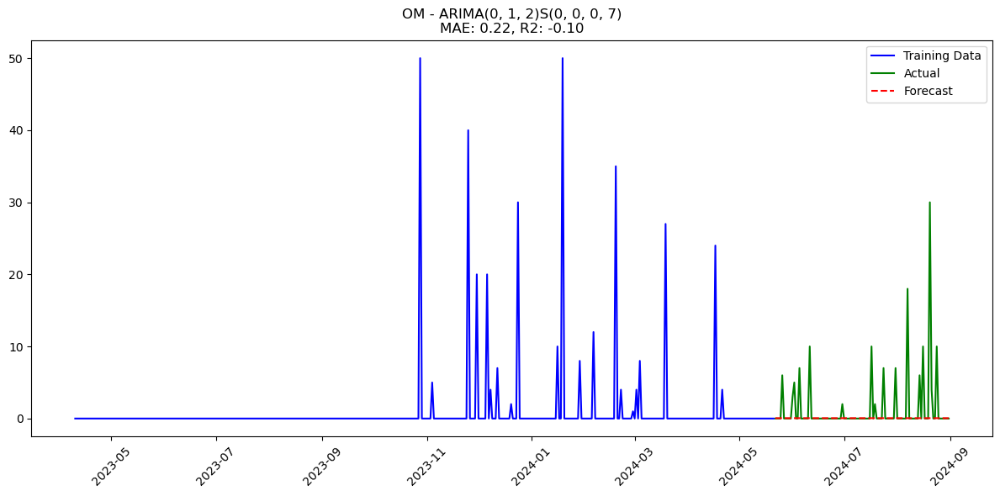

Results for OM:
ARIMA Order: (0, 1, 2)
Seasonal Order: (0, 0, 0, 7)
MAE: 0.22, RMSE: 0.46, R2: -0.10


In [68]:
# Main analysis 
all_results = []
products = df_new['Product'].unique()

# Pre-aggregate data
df_agg = df_new.groupby(['Product', 'Invoice_Date'])['Invoice_Quantity'].sum().reset_index()

for product_id in products:
    print(f"\n{'='*50}\nProcessing {product_id}\n{'='*50}")
    
    # Prepare time series
    ts = prepare_daily_product_data(df_agg, product_id)
    
    # Handle zero values for Box-Cox transformation
    constant_shift = 1  # Add constant to make all values positive
    ts_shifted = ts + constant_shift
    
    # Skip products with insufficient data
    if len(ts_shifted) < 60:  # Minimum 60 days of data
        print(f"Skipping {product_id} - only {len(ts_shifted)} days of data")
        continue
    
    # Box-Cox transformation (using pre-computed lambda)
    optimal_lambda = boxcox_normmax(ts_shifted)
    ts_transformed = boxcox(ts_shifted, lmbda=optimal_lambda)  # Only returns transformed array
    lambda_used = optimal_lambda  # We already have this value
    
    # Split data (80% train, 20% test)
    train_size = int(len(ts_transformed) * 0.8)
    train, test = ts_transformed[:train_size], ts_transformed[train_size:]
    
    # Evaluate model
    try:
        results, forecast = evaluate_arima(train, test, product_id)
        
        # Inverse transformations (with constant shift reversal)
        train_original = inv_boxcox(train, lambda_used) - constant_shift
        test_original = inv_boxcox(test, lambda_used) - constant_shift
        forecast_original = inv_boxcox(forecast, lambda_used) - constant_shift
        
        all_results.append(results)
        
        # Plot results (using original scale data)
        plt.figure(figsize=(12, 6))
        plt.plot(train_original.index, train_original, 'b-', label='Training Data')
        plt.plot(test_original.index, test_original, 'g-', label='Actual')
        plt.plot(test_original.index, forecast_original, 'r--', label='Forecast')
        plt.title(f"{product_id} - ARIMA{results['Parameters']}S{results['Seasonal_Parameters']}\nMAE: {results['MAE']:.2f}, R2: {results['R2_Score']:.2f}")
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        
        print(f"Results for {product_id}:")
        print(f"ARIMA Order: {results['Parameters']}")
        print(f"Seasonal Order: {results['Seasonal_Parameters']}")
        print(f"MAE: {results['MAE']:.2f}, RMSE: {results['RMSE']:.2f}, R2: {results['R2_Score']:.2f}")
    
    except Exception as e:
        print(f"Failed for {product_id}: {str(e)}")

In [69]:
# Save results
if all_results:
    results_df = pd.DataFrame(all_results)
    #results_df.to_csv('daily_arima_results.csv', index=False)
    print("\nFinal Results Summary:")
    print(results_df)
else:
    print("No products successfully modeled")


Final Results Summary:
   Product Parameters Seasonal_Parameters        MAE       RMSE  R2_Score
0       MD  (1, 0, 0)        (0, 0, 0, 7)  33.028735  39.005753 -0.009005
1       HD  (1, 1, 1)        (0, 0, 0, 7)  14.322804  17.163704 -0.169770
2       LR  (1, 0, 1)        (0, 0, 0, 7)  21.988595  27.423811 -0.045275
3       DR  (0, 0, 0)        (0, 0, 1, 7)   1.197003   1.467399 -0.009985
4       LB  (4, 0, 0)        (0, 0, 0, 7)   1.737576   2.197589 -0.015505
5       LM  (0, 0, 0)        (0, 0, 0, 7)   2.042110   2.718694 -0.027884
6       EM  (0, 0, 0)        (1, 0, 0, 7)   1.109939   1.588970 -0.019454
7       LP  (0, 0, 0)        (0, 0, 0, 7)   9.221783  10.623135 -0.015132
8       LF  (0, 0, 0)        (0, 0, 0, 7)   4.752559   5.215958 -0.032016
9       FA  (0, 0, 0)        (1, 0, 0, 7)   1.494159   1.642476 -0.115990
10      PB  (0, 1, 1)        (1, 0, 0, 7)   3.488186   4.306957 -0.006468
11      AH  (0, 0, 0)        (0, 0, 0, 7)   0.169622   0.243273 -0.209714
12      UV  (1

## Prophet

In [70]:
from prophet import Prophet

In [71]:
from sklearn.model_selection import ParameterGrid

In [72]:
from tqdm import tqdm

In [73]:
def tune_prophet(train, val):
    """Hyperparameter tuning for Prophet - returns best parameters only"""
    best_score = float('inf')
    best_params = None
    
    param_grid = {
        'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
        'seasonality_prior_scale': [0.01, 0.1, 1.0],
        'seasonality_mode': ['additive', 'multiplicative']
    }
    
    train_df = pd.DataFrame({'ds': train.index, 'y': train.values})
    val_df = pd.DataFrame({'ds': val.index, 'y': val.values})
    
    for params in ParameterGrid(param_grid):
        try:
            # CREATE NEW MODEL INSTANCE EACH ITERATION
            model = Prophet(
                weekly_seasonality=True,
                daily_seasonality=False,
                yearly_seasonality=False,
                **params
            )
            model.fit(train_df)
            
            future = model.make_future_dataframe(periods=len(val), freq='D')
            forecast = model.predict(future)
            val_pred = forecast['yhat'].values[-len(val):]
            
            score = mean_absolute_error(val_df['y'], val_pred)
            
            if score < best_score:
                best_score = score
                best_params = params
                
        except Exception as e:
            print(f"Error with params {params}: {str(e)}")
            continue
    
    return best_params  # Return parameters only, not model instance

Processing products with Prophet:   0%|                  | 0/15 [00:00<?, ?it/s]12:07:42 - cmdstanpy - INFO - Chain [1] start processing
12:07:42 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing
12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing
12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing
12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing
12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing
12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing
12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:43 - cmdstanpy - INFO - Chain [1] start processing
12:07:43 - cmdstanpy - INFO - Chain [1] done processing
12:07:44 - cmdst

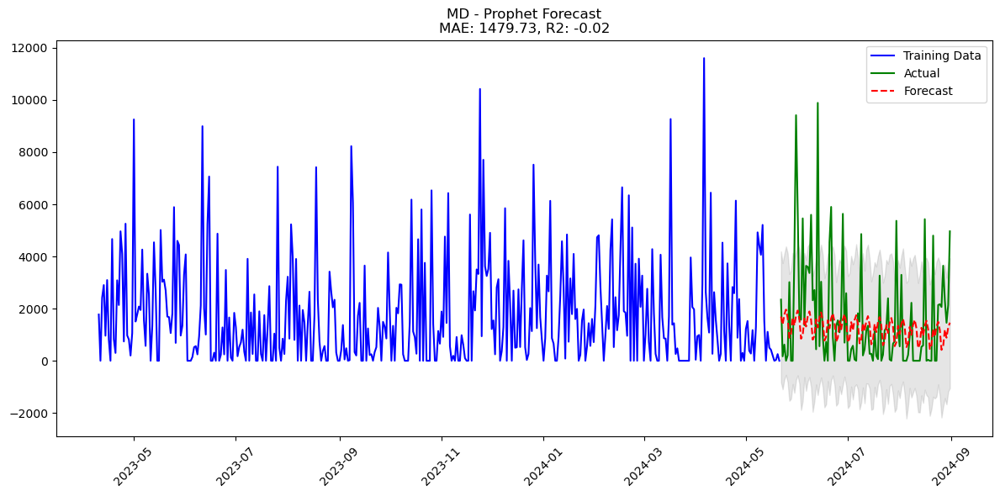

Processing products with Prophet:   7%|▋         | 1/15 [00:05<01:12,  5.19s/it]12:07:46 - cmdstanpy - INFO - Chain [1] start processing
12:07:46 - cmdstanpy - INFO - Chain [1] done processing
12:07:47 - cmdstanpy - INFO - Chain [1] start processing
12:07:47 - cmdstanpy - INFO - Chain [1] done processing
12:07:47 - cmdstanpy - INFO - Chain [1] start processing
12:07:47 - cmdstanpy - INFO - Chain [1] done processing
12:07:47 - cmdstanpy - INFO - Chain [1] start processing
12:07:47 - cmdstanpy - INFO - Chain [1] done processing
12:07:47 - cmdstanpy - INFO - Chain [1] start processing
12:07:47 - cmdstanpy - INFO - Chain [1] done processing
12:07:47 - cmdstanpy - INFO - Chain [1] start processing
12:07:47 - cmdstanpy - INFO - Chain [1] done processing
12:07:47 - cmdstanpy - INFO - Chain [1] start processing
12:07:47 - cmdstanpy - INFO - Chain [1] done processing
12:07:47 - cmdstanpy - INFO - Chain [1] start processing
12:07:47 - cmdstanpy - INFO - Chain [1] done processing
12:07:48 - cmdst

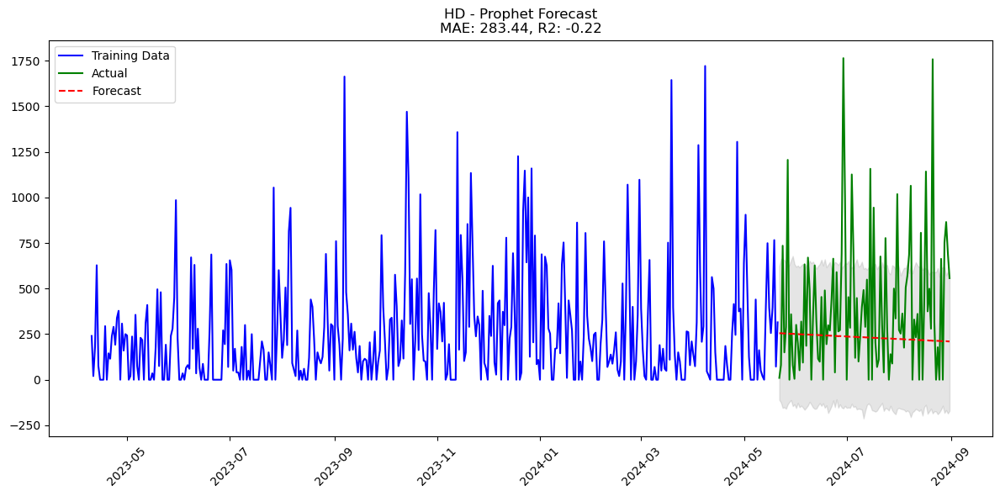

Processing products with Prophet:  13%|█▎        | 2/15 [00:09<00:59,  4.61s/it]12:07:51 - cmdstanpy - INFO - Chain [1] start processing
12:07:51 - cmdstanpy - INFO - Chain [1] done processing
12:07:51 - cmdstanpy - INFO - Chain [1] start processing
12:07:51 - cmdstanpy - INFO - Chain [1] done processing
12:07:51 - cmdstanpy - INFO - Chain [1] start processing
12:07:51 - cmdstanpy - INFO - Chain [1] done processing
12:07:51 - cmdstanpy - INFO - Chain [1] start processing
12:07:51 - cmdstanpy - INFO - Chain [1] done processing
12:07:51 - cmdstanpy - INFO - Chain [1] start processing
12:07:51 - cmdstanpy - INFO - Chain [1] done processing
12:07:51 - cmdstanpy - INFO - Chain [1] start processing
12:07:51 - cmdstanpy - INFO - Chain [1] done processing
12:07:52 - cmdstanpy - INFO - Chain [1] start processing
12:07:52 - cmdstanpy - INFO - Chain [1] done processing
12:07:52 - cmdstanpy - INFO - Chain [1] start processing
12:07:52 - cmdstanpy - INFO - Chain [1] done processing
12:07:52 - cmdst

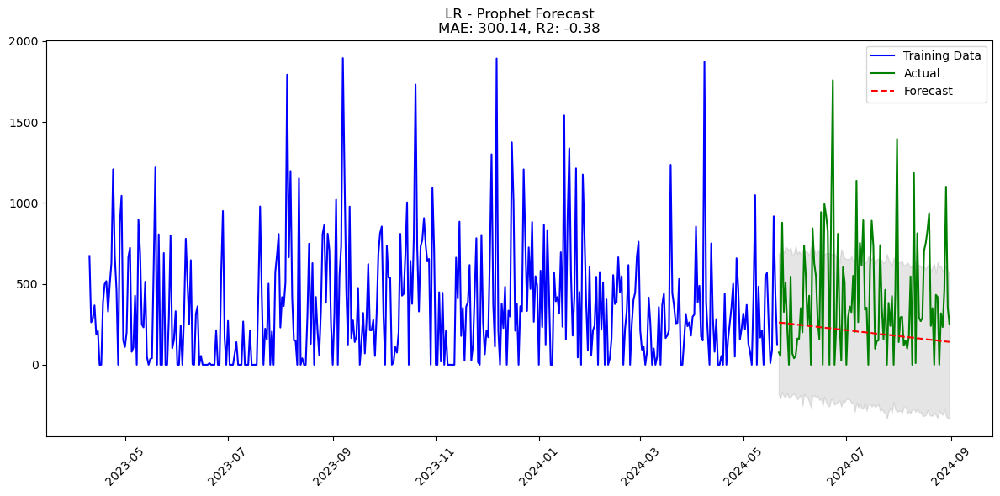

Processing products with Prophet:  20%|██        | 3/15 [00:14<00:55,  4.63s/it]12:07:55 - cmdstanpy - INFO - Chain [1] start processing
12:07:55 - cmdstanpy - INFO - Chain [1] done processing
12:07:55 - cmdstanpy - INFO - Chain [1] start processing
12:07:55 - cmdstanpy - INFO - Chain [1] done processing
12:07:56 - cmdstanpy - INFO - Chain [1] start processing
12:07:56 - cmdstanpy - INFO - Chain [1] done processing
12:07:56 - cmdstanpy - INFO - Chain [1] start processing
12:07:56 - cmdstanpy - INFO - Chain [1] done processing
12:07:56 - cmdstanpy - INFO - Chain [1] start processing
12:07:56 - cmdstanpy - INFO - Chain [1] done processing
12:07:56 - cmdstanpy - INFO - Chain [1] start processing
12:07:56 - cmdstanpy - INFO - Chain [1] done processing
12:07:56 - cmdstanpy - INFO - Chain [1] start processing
12:07:56 - cmdstanpy - INFO - Chain [1] done processing
12:07:56 - cmdstanpy - INFO - Chain [1] start processing
12:07:56 - cmdstanpy - INFO - Chain [1] done processing
12:07:56 - cmdst

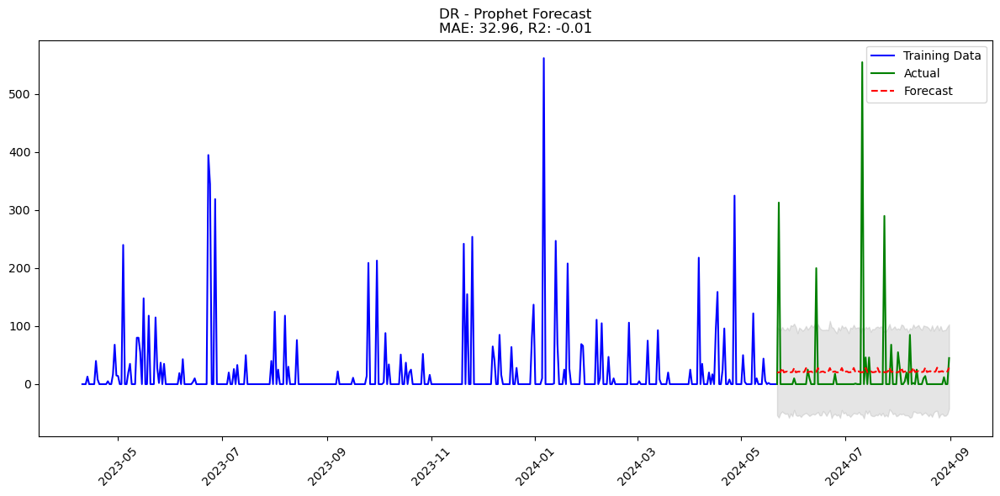

Processing products with Prophet:  27%|██▋       | 4/15 [00:18<00:50,  4.58s/it]12:08:00 - cmdstanpy - INFO - Chain [1] start processing
12:08:00 - cmdstanpy - INFO - Chain [1] done processing
12:08:00 - cmdstanpy - INFO - Chain [1] start processing
12:08:00 - cmdstanpy - INFO - Chain [1] done processing
12:08:00 - cmdstanpy - INFO - Chain [1] start processing
12:08:00 - cmdstanpy - INFO - Chain [1] done processing
12:08:00 - cmdstanpy - INFO - Chain [1] start processing
12:08:00 - cmdstanpy - INFO - Chain [1] done processing
12:08:00 - cmdstanpy - INFO - Chain [1] start processing
12:08:00 - cmdstanpy - INFO - Chain [1] done processing
12:08:01 - cmdstanpy - INFO - Chain [1] start processing
12:08:01 - cmdstanpy - INFO - Chain [1] done processing
12:08:01 - cmdstanpy - INFO - Chain [1] start processing
12:08:01 - cmdstanpy - INFO - Chain [1] done processing
12:08:01 - cmdstanpy - INFO - Chain [1] start processing
12:08:01 - cmdstanpy - INFO - Chain [1] done processing
12:08:01 - cmdst

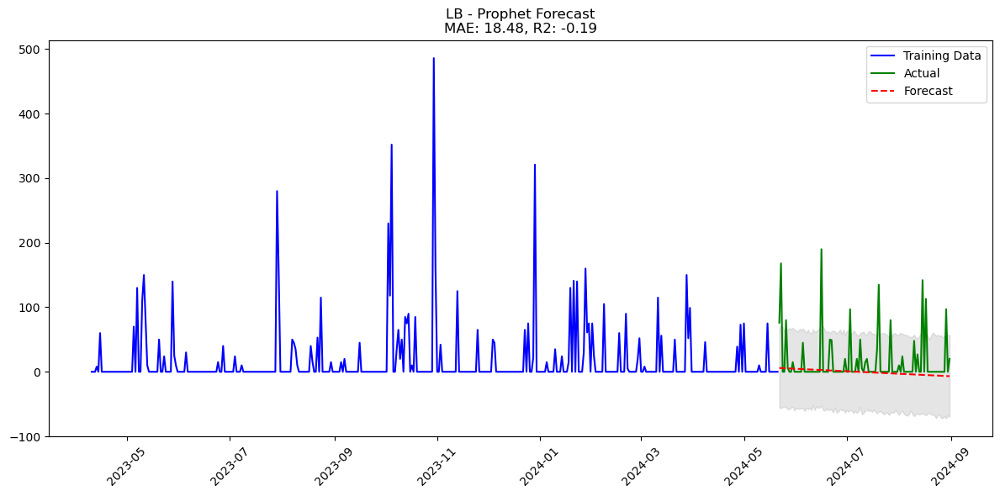

Processing products with Prophet:  33%|███▎      | 5/15 [00:22<00:44,  4.44s/it]12:08:04 - cmdstanpy - INFO - Chain [1] start processing
12:08:04 - cmdstanpy - INFO - Chain [1] done processing
12:08:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
12:08:04 - cmdstanpy - INFO - Chain [1] start processing
12:08:04 - cmdstanpy - INFO - Chain [1] done processing
12:08:04 - cmdstanpy - INFO - Chain [1] start processing
12:08:04 - cmdstanpy - INFO - Chain [1] done processing
12:08:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
12:08:05 - cmdstanpy - INFO - Chain [1] start processing
12:08:05 - cmdstanpy - INFO - Chain [1] done processing
12:08:05 - cmdstanpy - INFO - Chain [1] start processing
12:08:05 - cmdstanpy - INFO - Chain [1] done processing
12:08:05 - cmdstanpy - ERROR - Chain [1] er

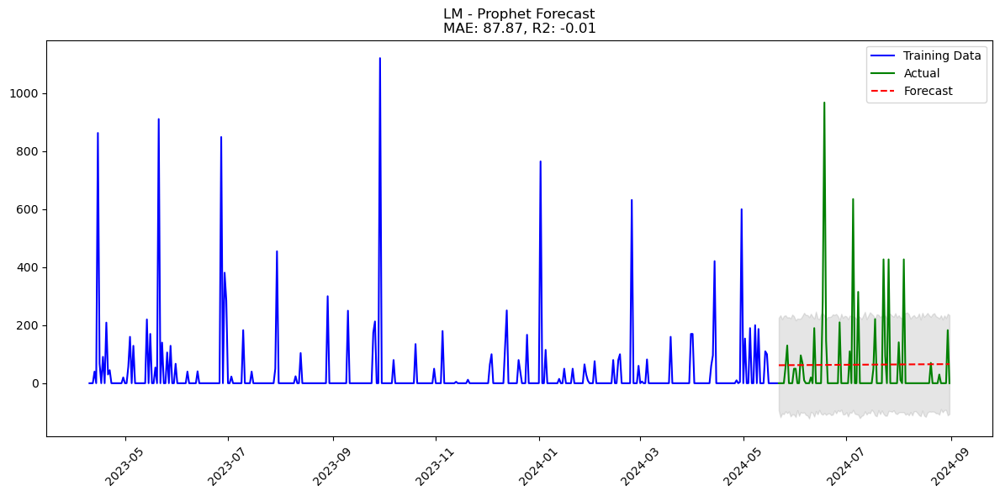

Processing products with Prophet:  40%|████      | 6/15 [00:29<00:48,  5.34s/it]12:08:11 - cmdstanpy - INFO - Chain [1] start processing
12:08:11 - cmdstanpy - INFO - Chain [1] done processing
12:08:11 - cmdstanpy - INFO - Chain [1] start processing
12:08:11 - cmdstanpy - INFO - Chain [1] done processing
12:08:11 - cmdstanpy - INFO - Chain [1] start processing
12:08:11 - cmdstanpy - INFO - Chain [1] done processing
12:08:11 - cmdstanpy - INFO - Chain [1] start processing
12:08:12 - cmdstanpy - INFO - Chain [1] done processing
12:08:12 - cmdstanpy - INFO - Chain [1] start processing
12:08:12 - cmdstanpy - INFO - Chain [1] done processing
12:08:12 - cmdstanpy - INFO - Chain [1] start processing
12:08:12 - cmdstanpy - INFO - Chain [1] done processing
12:08:12 - cmdstanpy - INFO - Chain [1] start processing
12:08:12 - cmdstanpy - INFO - Chain [1] done processing
12:08:12 - cmdstanpy - INFO - Chain [1] start processing
12:08:12 - cmdstanpy - INFO - Chain [1] done processing
12:08:12 - cmdst

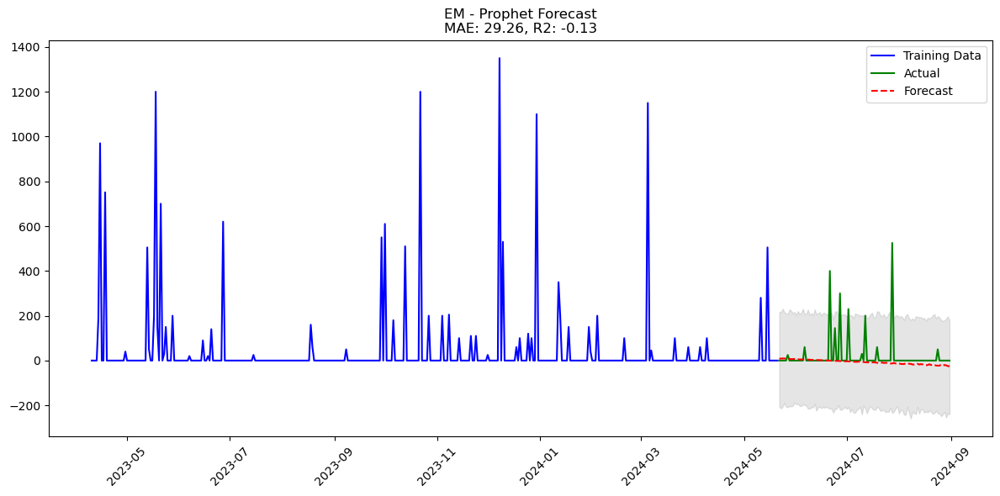

Processing products with Prophet:  47%|████▋     | 7/15 [00:33<00:39,  4.95s/it]12:08:15 - cmdstanpy - INFO - Chain [1] start processing
12:08:15 - cmdstanpy - INFO - Chain [1] done processing
12:08:15 - cmdstanpy - INFO - Chain [1] start processing
12:08:15 - cmdstanpy - INFO - Chain [1] done processing
12:08:15 - cmdstanpy - INFO - Chain [1] start processing
12:08:16 - cmdstanpy - INFO - Chain [1] done processing
12:08:16 - cmdstanpy - INFO - Chain [1] start processing
12:08:16 - cmdstanpy - INFO - Chain [1] done processing
12:08:16 - cmdstanpy - INFO - Chain [1] start processing
12:08:16 - cmdstanpy - INFO - Chain [1] done processing
12:08:16 - cmdstanpy - INFO - Chain [1] start processing
12:08:16 - cmdstanpy - INFO - Chain [1] done processing
12:08:16 - cmdstanpy - INFO - Chain [1] start processing
12:08:16 - cmdstanpy - INFO - Chain [1] done processing
12:08:16 - cmdstanpy - INFO - Chain [1] start processing
12:08:16 - cmdstanpy - INFO - Chain [1] done processing
12:08:16 - cmdst

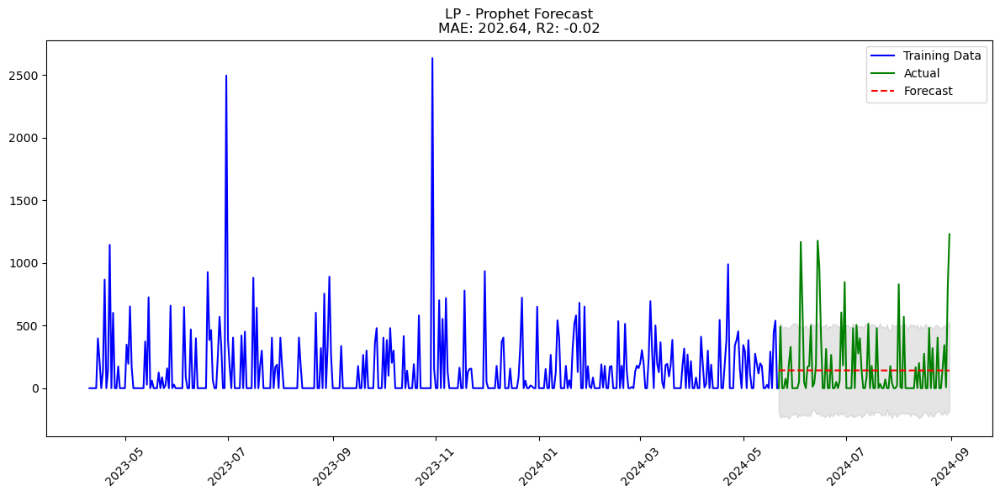

Processing products with Prophet:  53%|█████▎    | 8/15 [00:38<00:32,  4.68s/it]12:08:19 - cmdstanpy - INFO - Chain [1] start processing
12:08:19 - cmdstanpy - INFO - Chain [1] done processing
12:08:19 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
12:08:19 - cmdstanpy - INFO - Chain [1] start processing
12:08:20 - cmdstanpy - INFO - Chain [1] done processing
12:08:20 - cmdstanpy - INFO - Chain [1] start processing
12:08:20 - cmdstanpy - INFO - Chain [1] done processing
12:08:20 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
12:08:20 - cmdstanpy - INFO - Chain [1] start processing
12:08:21 - cmdstanpy - INFO - Chain [1] done processing
12:08:21 - cmdstanpy - INFO - Chain [1] start processing
12:08:21 - cmdstanpy - INFO - Chain [1] done processing
12:08:21 - cmdstanpy - ERROR - Chain [1] er

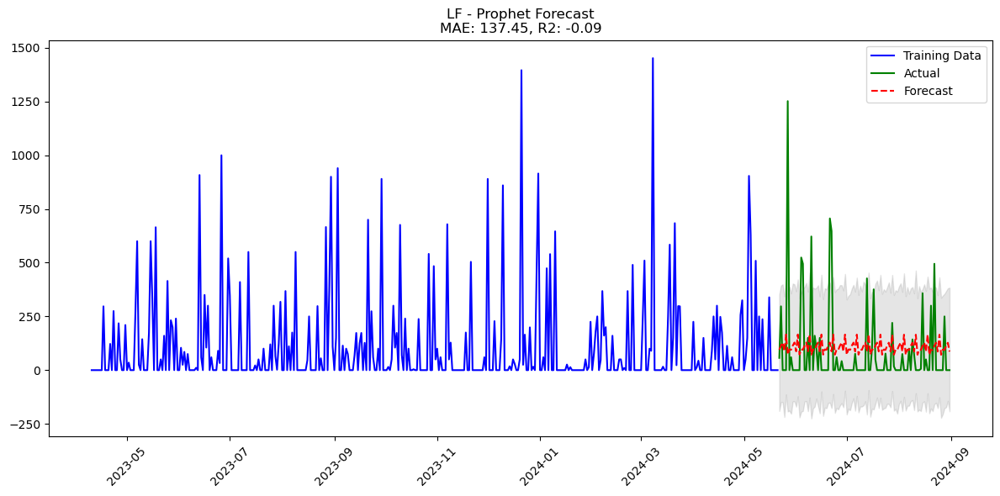

Processing products with Prophet:  60%|██████    | 9/15 [00:46<00:34,  5.77s/it]12:08:27 - cmdstanpy - INFO - Chain [1] start processing
12:08:27 - cmdstanpy - INFO - Chain [1] done processing
12:08:28 - cmdstanpy - INFO - Chain [1] start processing
12:08:28 - cmdstanpy - INFO - Chain [1] done processing
12:08:28 - cmdstanpy - INFO - Chain [1] start processing
12:08:28 - cmdstanpy - INFO - Chain [1] done processing
12:08:28 - cmdstanpy - INFO - Chain [1] start processing
12:08:28 - cmdstanpy - INFO - Chain [1] done processing
12:08:28 - cmdstanpy - INFO - Chain [1] start processing
12:08:28 - cmdstanpy - INFO - Chain [1] done processing
12:08:28 - cmdstanpy - INFO - Chain [1] start processing
12:08:28 - cmdstanpy - INFO - Chain [1] done processing
12:08:28 - cmdstanpy - INFO - Chain [1] start processing
12:08:28 - cmdstanpy - INFO - Chain [1] done processing
12:08:28 - cmdstanpy - INFO - Chain [1] start processing
12:08:29 - cmdstanpy - INFO - Chain [1] done processing
12:08:29 - cmdst

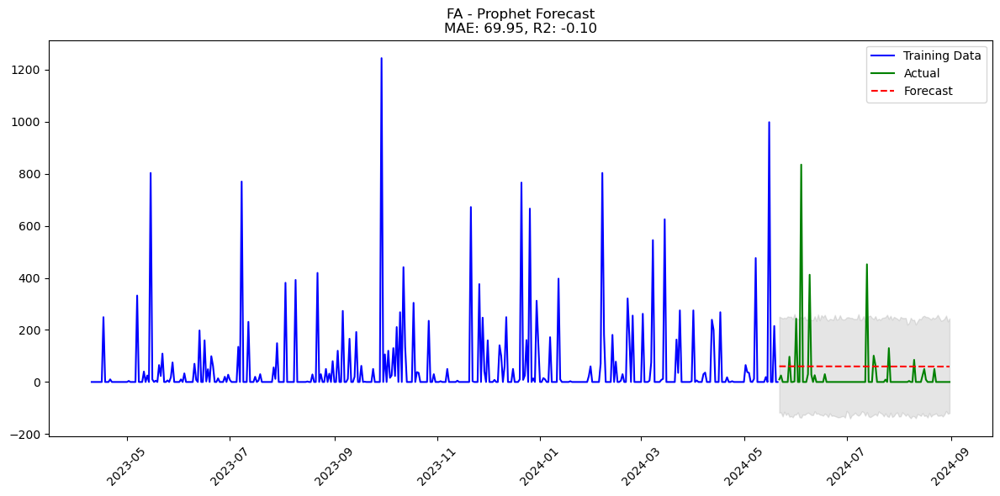

Processing products with Prophet:  67%|██████   | 10/15 [00:50<00:26,  5.22s/it]12:08:32 - cmdstanpy - INFO - Chain [1] start processing
12:08:32 - cmdstanpy - INFO - Chain [1] done processing
12:08:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
12:08:32 - cmdstanpy - INFO - Chain [1] start processing
12:08:33 - cmdstanpy - INFO - Chain [1] done processing
12:08:33 - cmdstanpy - INFO - Chain [1] start processing
12:08:33 - cmdstanpy - INFO - Chain [1] done processing
12:08:33 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
12:08:33 - cmdstanpy - INFO - Chain [1] start processing
12:08:34 - cmdstanpy - INFO - Chain [1] done processing
12:08:34 - cmdstanpy - INFO - Chain [1] start processing
12:08:34 - cmdstanpy - INFO - Chain [1] done processing
12:08:34 - cmdstanpy - ERROR - Chain [1] er

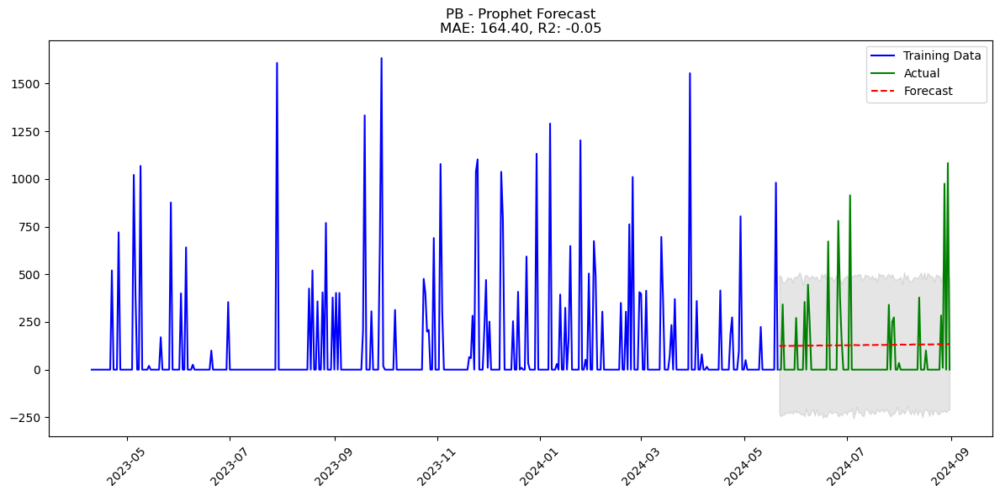

Processing products with Prophet:  73%|██████▌  | 11/15 [00:58<00:24,  6.13s/it]12:08:40 - cmdstanpy - INFO - Chain [1] start processing
12:08:40 - cmdstanpy - INFO - Chain [1] done processing
12:08:40 - cmdstanpy - INFO - Chain [1] start processing
12:08:40 - cmdstanpy - INFO - Chain [1] done processing
12:08:40 - cmdstanpy - INFO - Chain [1] start processing
12:08:40 - cmdstanpy - INFO - Chain [1] done processing
12:08:40 - cmdstanpy - INFO - Chain [1] start processing
12:08:40 - cmdstanpy - INFO - Chain [1] done processing
12:08:40 - cmdstanpy - INFO - Chain [1] start processing
12:08:40 - cmdstanpy - INFO - Chain [1] done processing
12:08:40 - cmdstanpy - INFO - Chain [1] start processing
12:08:40 - cmdstanpy - INFO - Chain [1] done processing
12:08:41 - cmdstanpy - INFO - Chain [1] start processing
12:08:41 - cmdstanpy - INFO - Chain [1] done processing
12:08:41 - cmdstanpy - INFO - Chain [1] start processing
12:08:41 - cmdstanpy - INFO - Chain [1] done processing
12:08:41 - cmdst

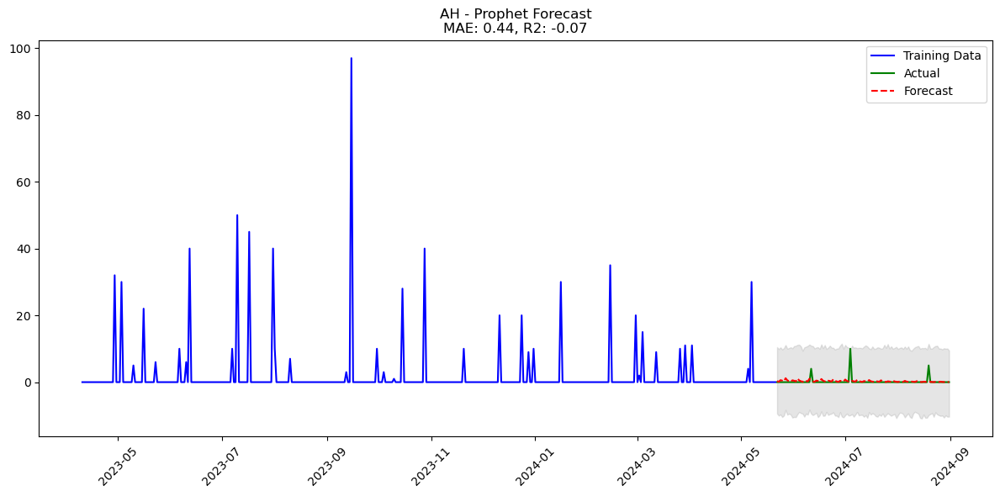

Processing products with Prophet:  80%|███████▏ | 12/15 [01:02<00:16,  5.54s/it]12:08:44 - cmdstanpy - INFO - Chain [1] start processing
12:08:44 - cmdstanpy - INFO - Chain [1] done processing
12:08:44 - cmdstanpy - INFO - Chain [1] start processing
12:08:44 - cmdstanpy - INFO - Chain [1] done processing
12:08:44 - cmdstanpy - INFO - Chain [1] start processing
12:08:44 - cmdstanpy - INFO - Chain [1] done processing
12:08:44 - cmdstanpy - INFO - Chain [1] start processing
12:08:44 - cmdstanpy - INFO - Chain [1] done processing
12:08:44 - cmdstanpy - INFO - Chain [1] start processing
12:08:44 - cmdstanpy - INFO - Chain [1] done processing
12:08:45 - cmdstanpy - INFO - Chain [1] start processing
12:08:45 - cmdstanpy - INFO - Chain [1] done processing
12:08:45 - cmdstanpy - INFO - Chain [1] start processing
12:08:45 - cmdstanpy - INFO - Chain [1] done processing
12:08:45 - cmdstanpy - INFO - Chain [1] start processing
12:08:45 - cmdstanpy - INFO - Chain [1] done processing
12:08:45 - cmdst

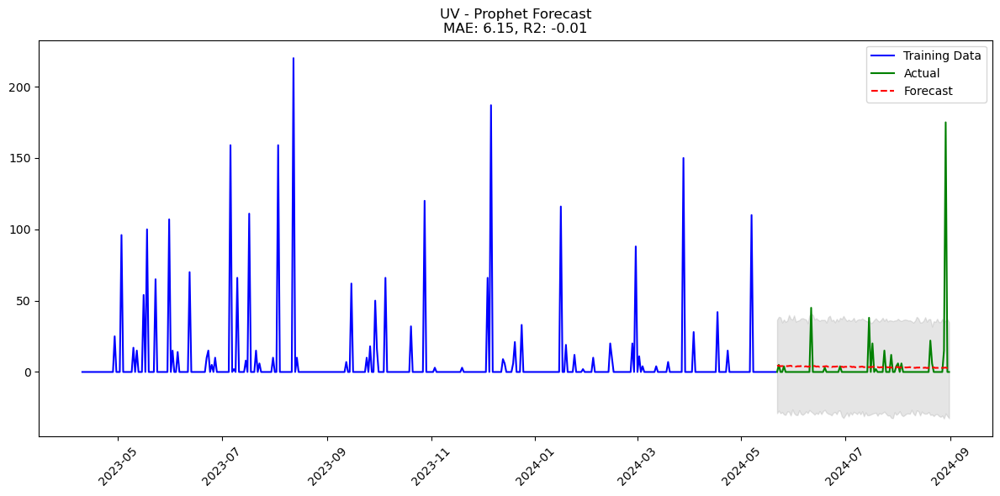

Processing products with Prophet:  87%|███████▊ | 13/15 [01:06<00:10,  5.09s/it]12:08:48 - cmdstanpy - INFO - Chain [1] start processing
12:08:48 - cmdstanpy - INFO - Chain [1] done processing
12:08:48 - cmdstanpy - INFO - Chain [1] start processing
12:08:48 - cmdstanpy - INFO - Chain [1] done processing
12:08:48 - cmdstanpy - INFO - Chain [1] start processing
12:08:48 - cmdstanpy - INFO - Chain [1] done processing
12:08:48 - cmdstanpy - INFO - Chain [1] start processing
12:08:48 - cmdstanpy - INFO - Chain [1] done processing
12:08:48 - cmdstanpy - INFO - Chain [1] start processing
12:08:49 - cmdstanpy - INFO - Chain [1] done processing
12:08:49 - cmdstanpy - INFO - Chain [1] start processing
12:08:49 - cmdstanpy - INFO - Chain [1] done processing
12:08:49 - cmdstanpy - INFO - Chain [1] start processing
12:08:49 - cmdstanpy - INFO - Chain [1] done processing
12:08:49 - cmdstanpy - INFO - Chain [1] start processing
12:08:49 - cmdstanpy - INFO - Chain [1] done processing
12:08:49 - cmdst

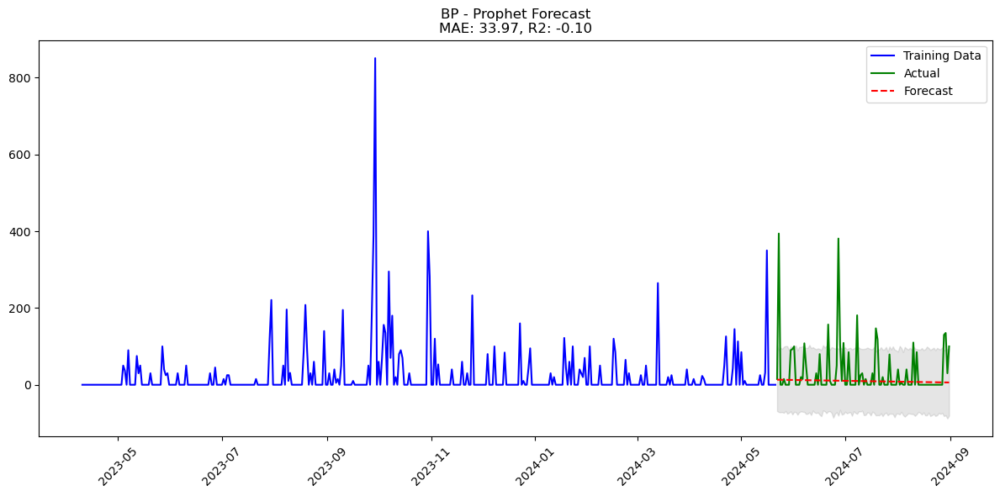

Processing products with Prophet:  93%|████████▍| 14/15 [01:11<00:04,  5.00s/it]12:08:53 - cmdstanpy - INFO - Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:53 - cmdstanpy - INFO - Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:53 - cmdstanpy - INFO - Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:53 - cmdstanpy - INFO - Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:53 - cmdstanpy - INFO - Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:53 - cmdstanpy - INFO - Chain [1] start processing
12:08:53 - cmdstanpy - INFO - Chain [1] done processing
12:08:54 - cmdstanpy - INFO - Chain [1] start processing
12:08:54 - cmdstanpy - INFO - Chain [1] done processing
12:08:54 - cmdstanpy - INFO - Chain [1] start processing
12:08:54 - cmdstanpy - INFO - Chain [1] done processing
12:08:54 - cmdst

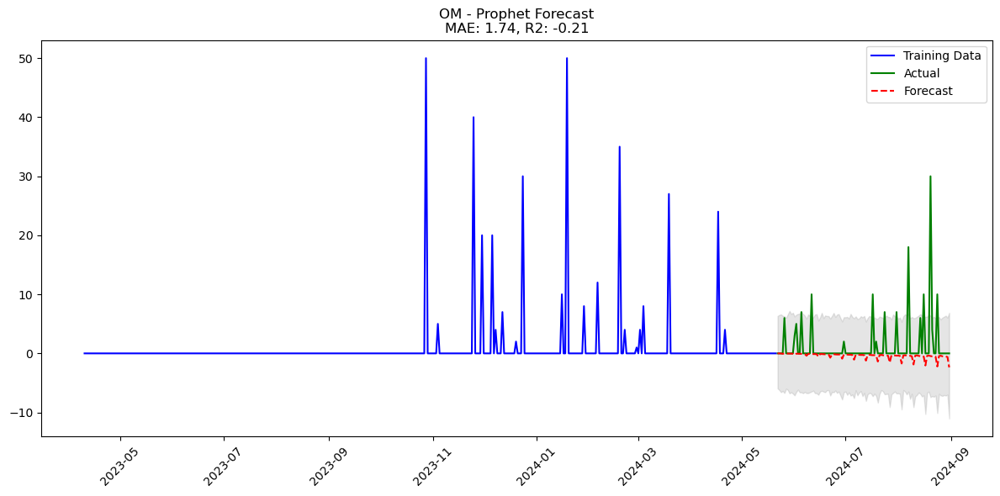

Processing products with Prophet: 100%|█████████| 15/15 [01:15<00:00,  5.05s/it]


In [74]:
# Main Prophet analysis
prophet_results = []
products = df_new['Product'].unique()

for product_id in tqdm(products, desc="Processing products with Prophet"):
    ts = prepare_daily_product_data(df_agg, product_id)
    
    if len(ts) < 60:
        continue
    
    # Split data
    train_size = int(len(ts) * 0.7)
    val_size = int(len(ts) * 0.1)
    train = ts.iloc[:train_size]
    val = ts.iloc[train_size:train_size+val_size]
    test = ts.iloc[train_size+val_size:]
    
    try:
        # TUNE: Get best parameters only
        best_params = tune_prophet(train, val)
        
        if best_params is None:
            print(f"No valid parameters found for {product_id}")
            continue
            
        # CREATE NEW MODEL with best parameters
        model = Prophet(
            weekly_seasonality=True,
            daily_seasonality=False,
            yearly_seasonality=False,
            **best_params
        )
        
        # Train on combined train+val data
        combined = pd.concat([train, val])
        combined_df = pd.DataFrame({'ds': combined.index, 'y': combined.values})
        model.fit(combined_df)  # Fit the new model instance
        
        # Forecast test period
        future = model.make_future_dataframe(periods=len(test), freq='D')
        forecast = model.predict(future)
        test_pred = forecast['yhat'].values[-len(test):]
        
        #df = pd.DataFrame(test_pred)
        # Construct a unique filename per product
        #filename = f"{product_name}_data.csv"
        # Save to CSV
        #df.to_csv(filename, index=False)
        
        # Calculate metrics
        results = {
            'Product': product_id,
            'Parameters': str(best_params),
            'MAE': mean_absolute_error(test, test_pred),
            'RMSE': np.sqrt(mean_squared_error(test, test_pred)),
            'R2_Score': r2_score(test, test_pred)
        }
        prophet_results.append(results)
        
        # Plot results
        plt.figure(figsize=(12, 6))
        plt.plot(combined.index, combined.values, 'b-', label='Training Data')
        plt.plot(test.index, test.values, 'g-', label='Actual')
        plt.plot(test.index, test_pred, 'r--', label='Forecast')
        plt.fill_between(test.index, 
                         forecast['yhat_lower'].values[-len(test):], 
                         forecast['yhat_upper'].values[-len(test):], 
                         alpha=0.2, color='gray')
        plt.title(f"{product_id} - Prophet Forecast\nMAE: {results['MAE']:.2f}, R2: {results['R2_Score']:.2f}")
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        #plt.savefig(f"prophet_{product_id}.png", dpi=150)
        #plt.close()
        plt.show()
        
    except Exception as e:
        print(f"Failed for {product_id}: {str(e)}")

In [75]:
# Save results
prophet_results_df = pd.DataFrame(prophet_results)
#prophet_results_df.to_csv('prophet_results.csv', index=False)
print("Prophet analysis completed. Results saved to prophet_results.csv")

Prophet analysis completed. Results saved to prophet_results.csv


In [77]:
prophet_results_df

,Product,Parameters,MAE,RMSE,R2_Score
0,MD,"{'changepoint_prior_scale': 0.5, 'seasonality_...",1479.733947,2060.536488,-0.019899
1,HD,"{'changepoint_prior_scale': 0.5, 'seasonality_...",283.442031,402.600155,-0.223278
2,LR,"{'changepoint_prior_scale': 0.5, 'seasonality_...",300.143309,413.165800,-0.383492
3,DR,"{'changepoint_prior_scale': 0.1, 'seasonality_...",32.963847,71.765102,-0.010410
4,LB,"{'changepoint_prior_scale': 0.5, 'seasonality_...",18.482390,40.912243,-0.193284
5,LM,"{'changepoint_prior_scale': 0.001, 'seasonalit...",87.874603,142.283432,-0.006835
6,EM,"{'changepoint_prior_scale': 0.5, 'seasonality_...",29.261244,82.137067,-0.127045
7,LP,"{'changepoint_prior_scale': 0.1, 'seasonality_...",202.640437,288.362313,-0.015768
8,LF,"{'changepoint_prior_scale': 0.5, 'seasonality_...",137.449698,202.072541,-0.088179
9,FA,"{'changepoint_prior_scale': 0.5, 'seasonality_...",69.953844,109.635472,-0.098867


## SARIMAX

In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import ParameterGrid
from statsmodels.tsa.statespace.sarimax import SARIMAX
from scipy.stats import boxcox ,boxcox_normmax
from scipy.special import inv_boxcox
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

In [86]:
def tune_sarimax(train, val):
    """Hyperparameter tuning for SARIMAX"""
    best_score = float('inf')
    best_params = None
    best_model = None
    
    # Define parameter grid
    param_grid = {
        'order': [(1, 0, 0), (0, 0, 1), (1, 0, 1), (2, 0, 1)],
        'seasonal_order': [(1, 0, 1, 7), (0, 1, 1, 7), (1, 1, 1, 7)]
    }
    
    print(f"Testing {len(list(ParameterGrid(param_grid)))} SARIMAX parameter combinations")
    
    for params in ParameterGrid(param_grid):
        try:
            # Create and fit SARIMAX model
            model = SARIMAX(
                train,
                order=params['order'],
                seasonal_order=params['seasonal_order'],
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            model_fit = model.fit(disp=False)
            
            # Forecast validation period
            forecast = model_fit.get_forecast(steps=len(val))
            val_pred = forecast.predicted_mean
            
            # Calculate validation score
            score = mean_absolute_error(val, val_pred)
            
            if score < best_score:
                best_score = score
                best_params = params
                best_model = model_fit
                
        except Exception as e:
            # Skip invalid parameter combinations
            continue
    
    return best_params, best_model

Processing products with SARIMAX:   0%|                  | 0/15 [00:00<?, ?it/s]

Testing 12 SARIMAX parameter combinations


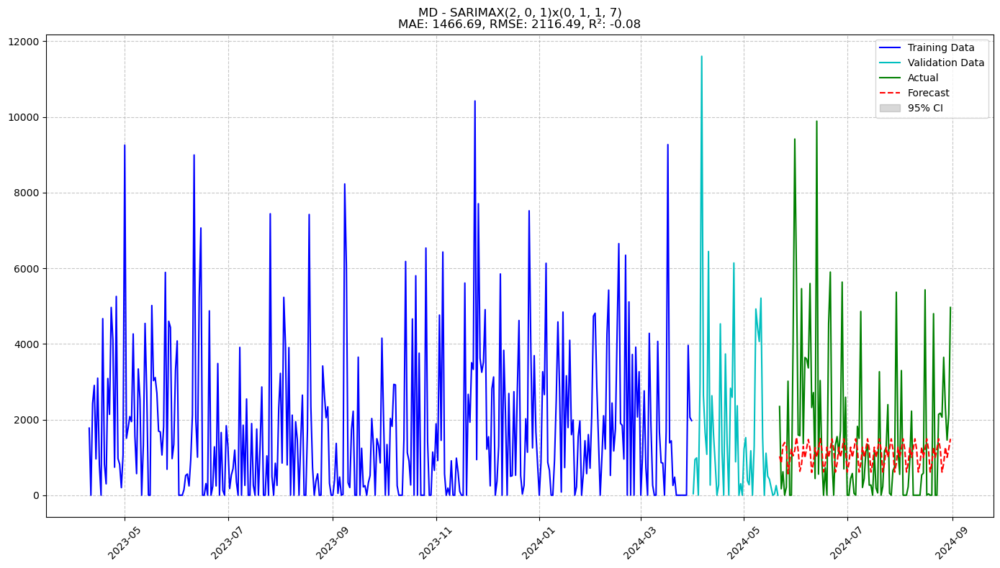

Processing products with SARIMAX:   7%|▋         | 1/15 [00:05<01:23,  5.98s/it]

Results for MD:
Order: (2, 0, 1), Seasonal Order: (0, 1, 1, 7)
MAE: 1466.69, RMSE: 2116.49, R²: -0.08
Testing 12 SARIMAX parameter combinations


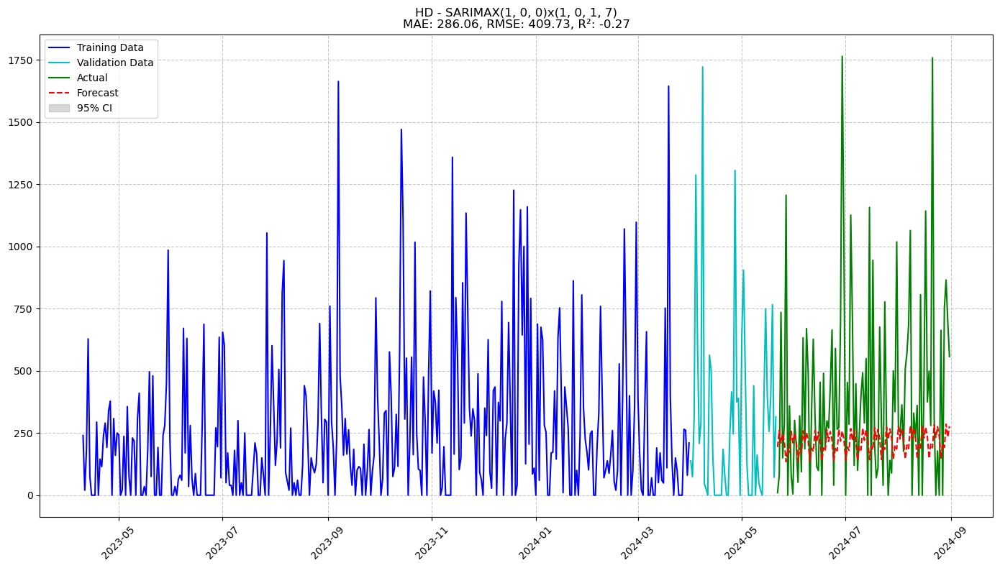

Processing products with SARIMAX:  13%|█▎        | 2/15 [00:10<01:08,  5.24s/it]

Results for HD:
Order: (1, 0, 0), Seasonal Order: (1, 0, 1, 7)
MAE: 286.06, RMSE: 409.73, R²: -0.27
Testing 12 SARIMAX parameter combinations


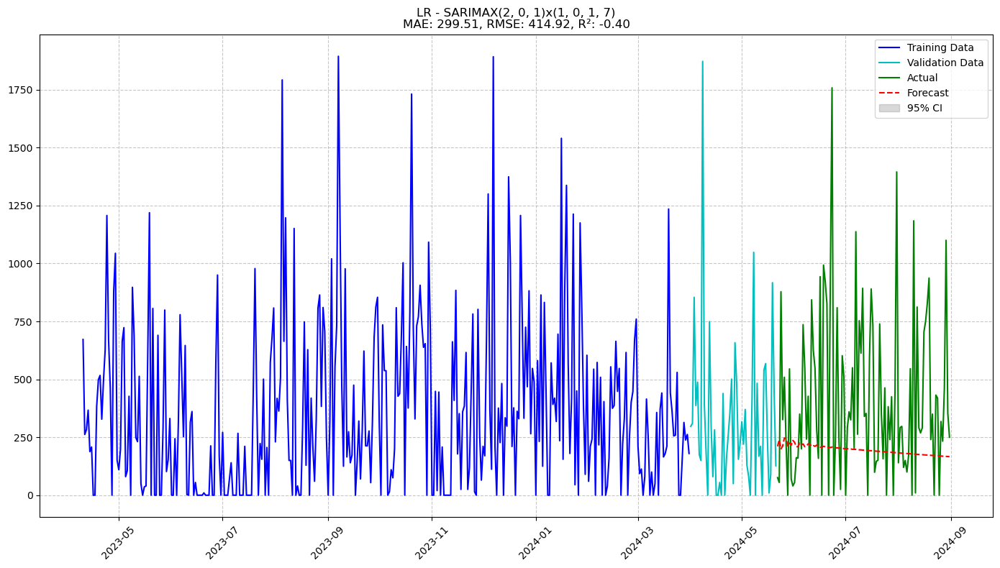

Processing products with SARIMAX:  20%|██        | 3/15 [00:16<01:04,  5.38s/it]

Results for LR:
Order: (2, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 299.51, RMSE: 414.92, R²: -0.40
Testing 12 SARIMAX parameter combinations


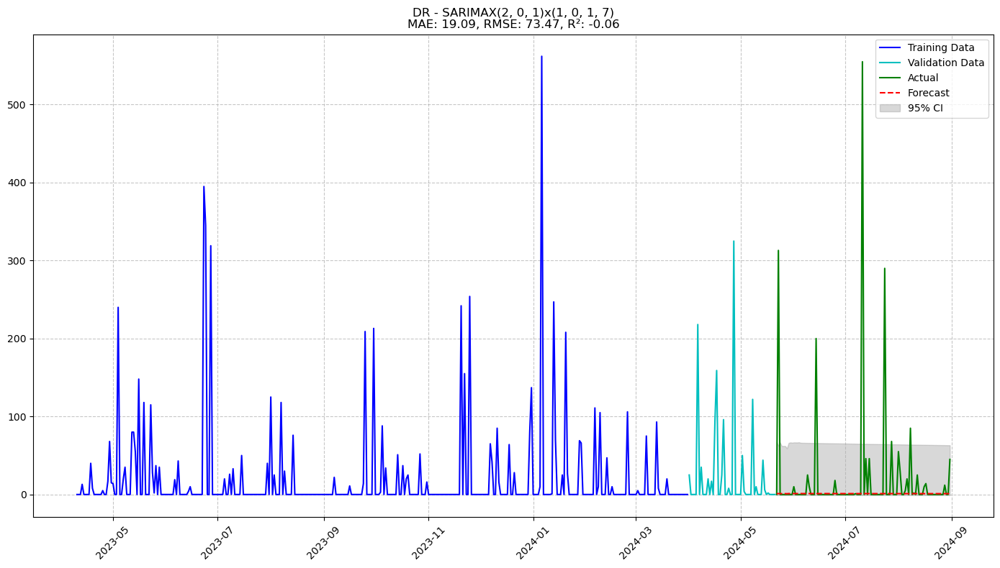

Processing products with SARIMAX:  27%|██▋       | 4/15 [00:20<00:53,  4.88s/it]

Results for DR:
Order: (2, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 19.09, RMSE: 73.47, R²: -0.06
Testing 12 SARIMAX parameter combinations


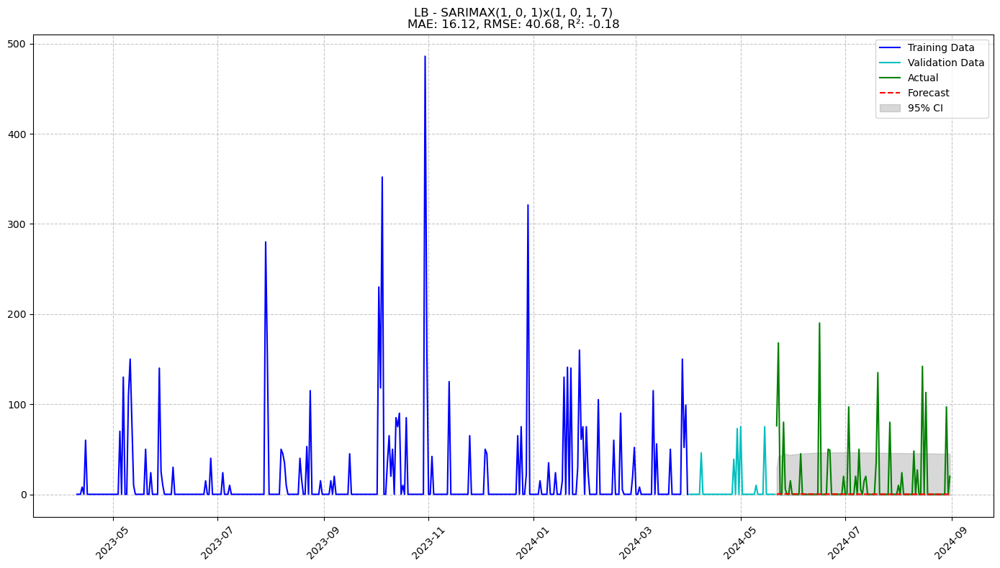

Processing products with SARIMAX:  33%|███▎      | 5/15 [00:25<00:48,  4.88s/it]

Results for LB:
Order: (1, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 16.12, RMSE: 40.68, R²: -0.18
Testing 12 SARIMAX parameter combinations


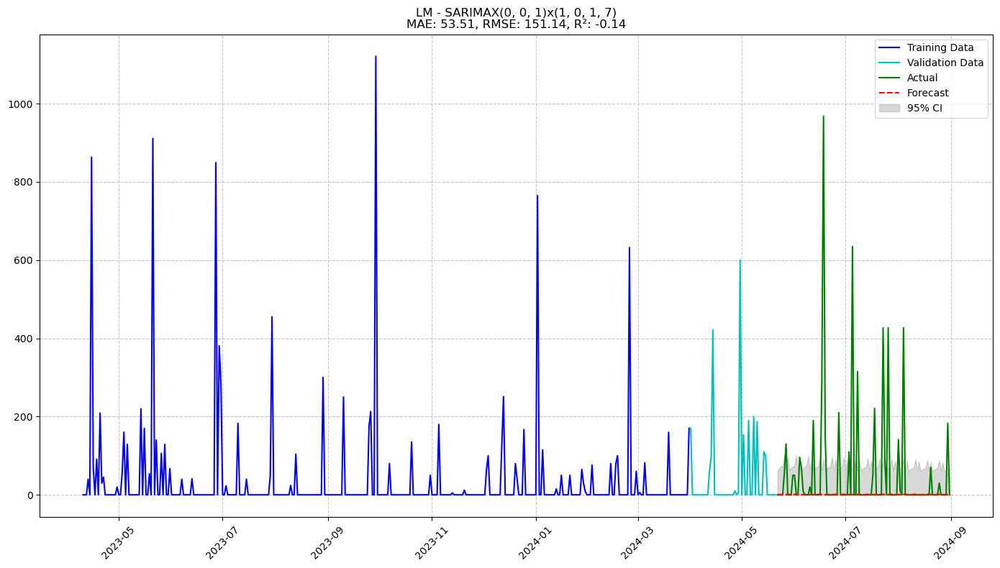

Processing products with SARIMAX:  40%|████      | 6/15 [00:29<00:42,  4.71s/it]

Results for LM:
Order: (0, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 53.51, RMSE: 151.14, R²: -0.14
Testing 12 SARIMAX parameter combinations


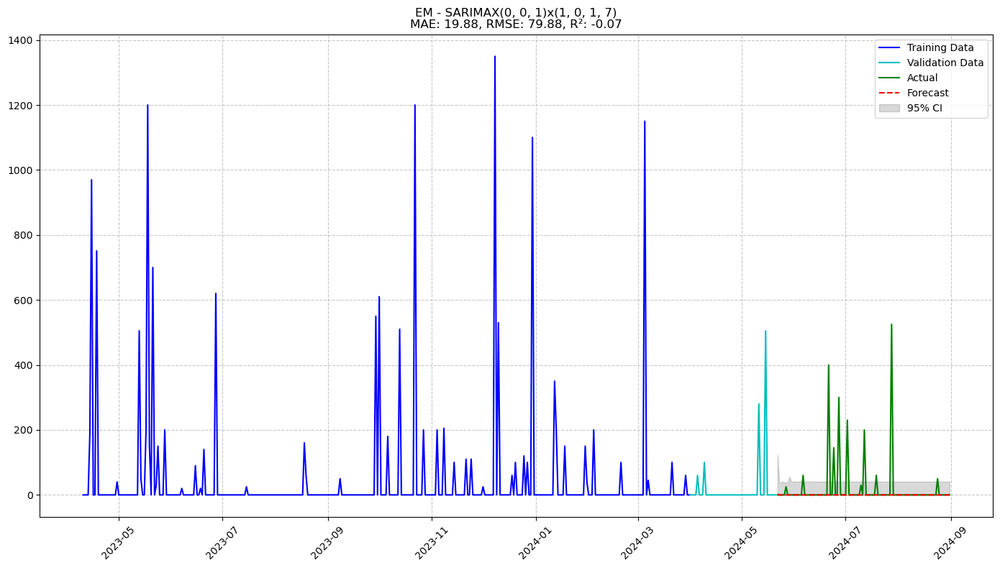

Processing products with SARIMAX:  47%|████▋     | 7/15 [00:33<00:35,  4.43s/it]

Results for EM:
Order: (0, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 19.88, RMSE: 79.88, R²: -0.07
Testing 12 SARIMAX parameter combinations


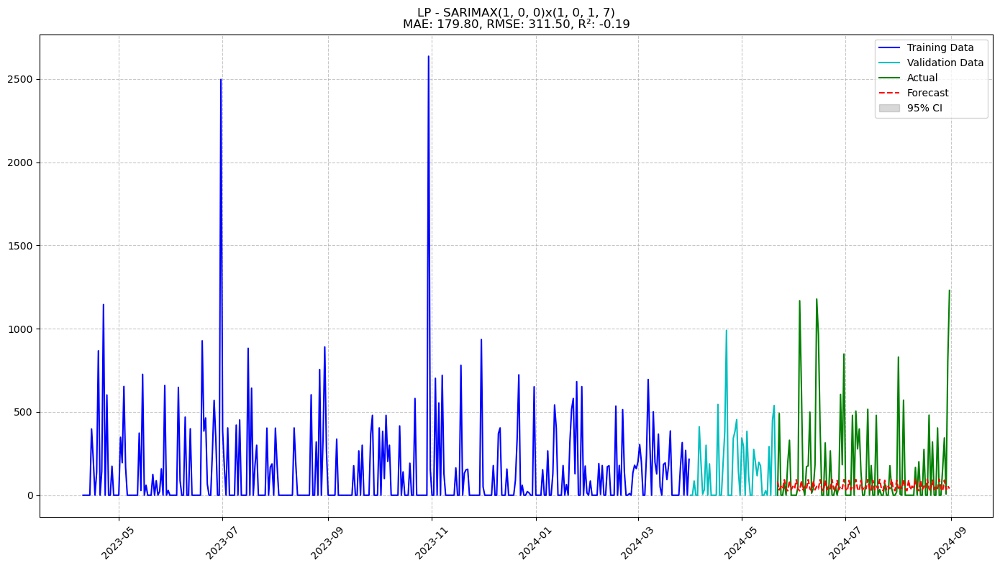

Processing products with SARIMAX:  53%|█████▎    | 8/15 [00:37<00:30,  4.42s/it]

Results for LP:
Order: (1, 0, 0), Seasonal Order: (1, 0, 1, 7)
MAE: 179.80, RMSE: 311.50, R²: -0.19
Testing 12 SARIMAX parameter combinations


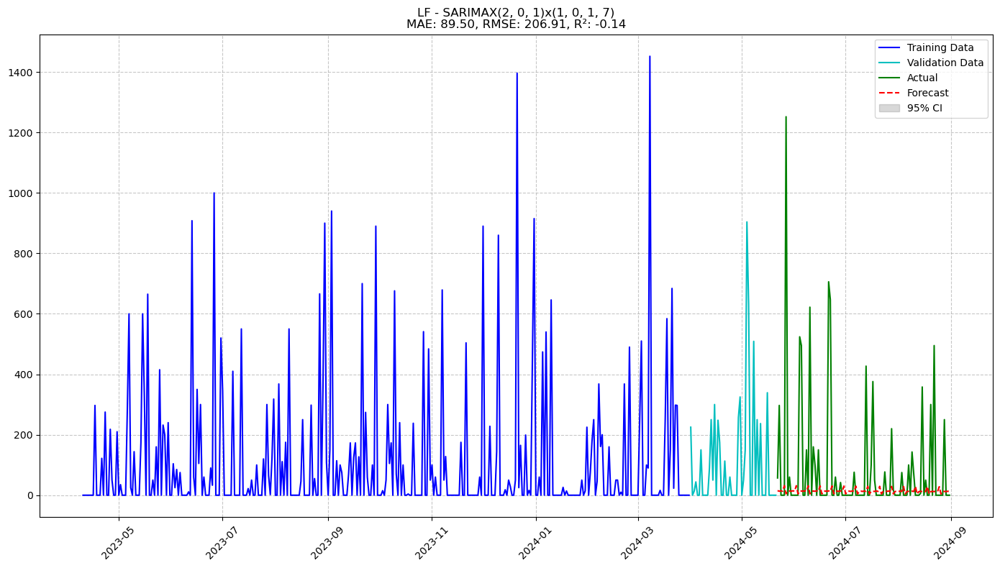

Processing products with SARIMAX:  60%|██████    | 9/15 [00:44<00:30,  5.01s/it]

Results for LF:
Order: (2, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 89.50, RMSE: 206.91, R²: -0.14
Testing 12 SARIMAX parameter combinations


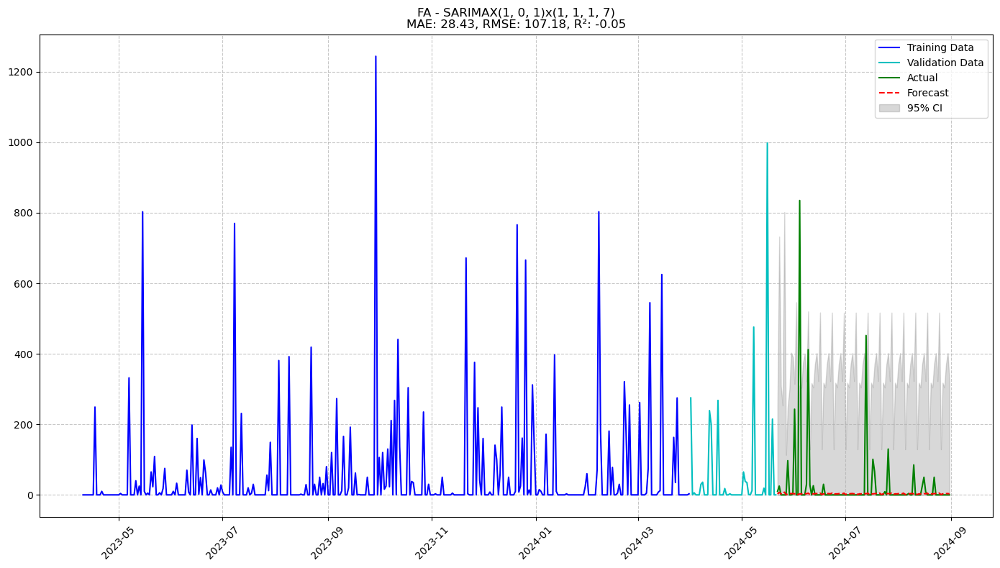

Processing products with SARIMAX:  67%|██████   | 10/15 [00:48<00:24,  4.82s/it]

Results for FA:
Order: (1, 0, 1), Seasonal Order: (1, 1, 1, 7)
MAE: 28.43, RMSE: 107.18, R²: -0.05
Testing 12 SARIMAX parameter combinations


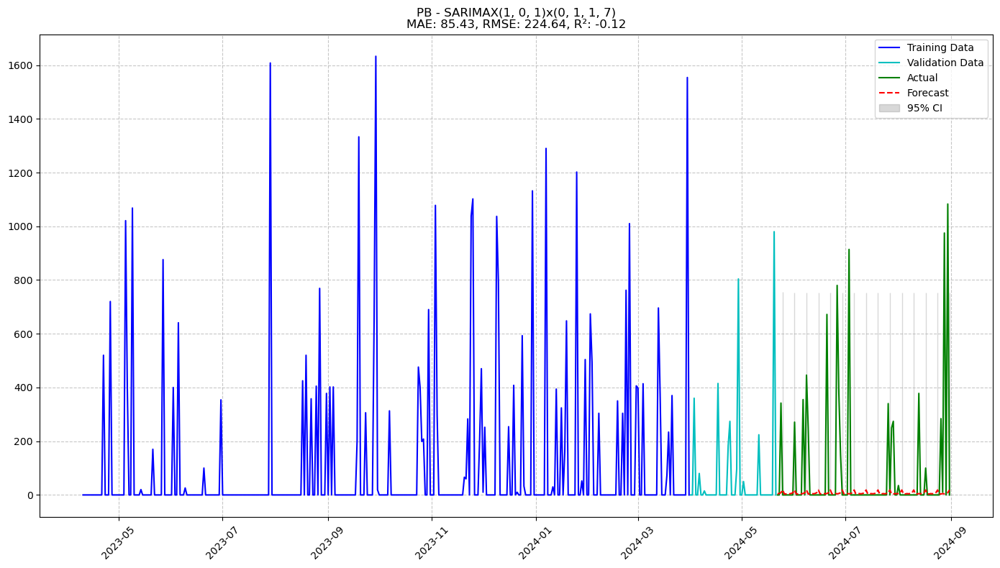

Processing products with SARIMAX:  73%|██████▌  | 11/15 [00:53<00:19,  4.81s/it]

Results for PB:
Order: (1, 0, 1), Seasonal Order: (0, 1, 1, 7)
MAE: 85.43, RMSE: 224.64, R²: -0.12
Testing 12 SARIMAX parameter combinations


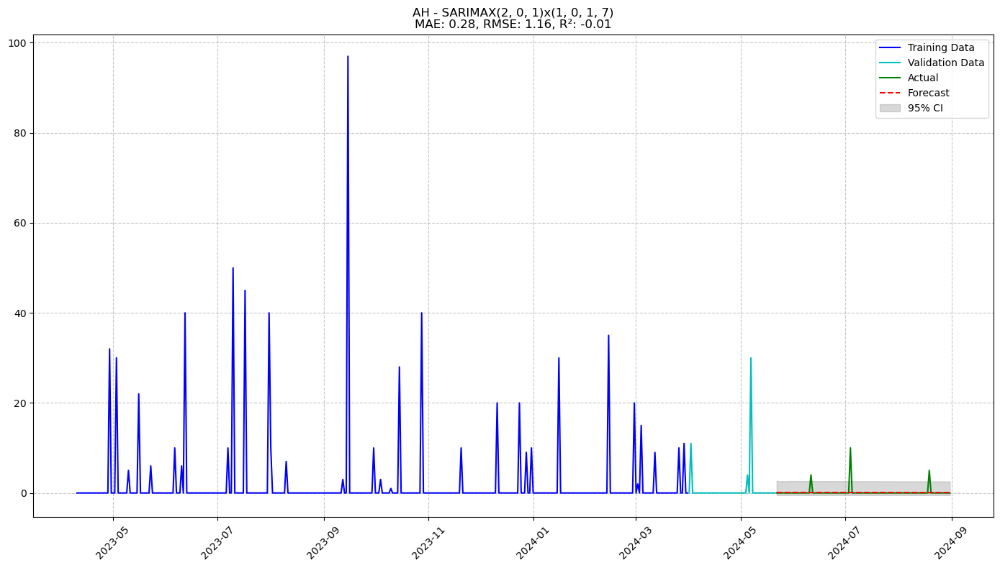

Processing products with SARIMAX:  80%|███████▏ | 12/15 [00:58<00:15,  5.04s/it]

Results for AH:
Order: (2, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 0.28, RMSE: 1.16, R²: -0.01
Testing 12 SARIMAX parameter combinations


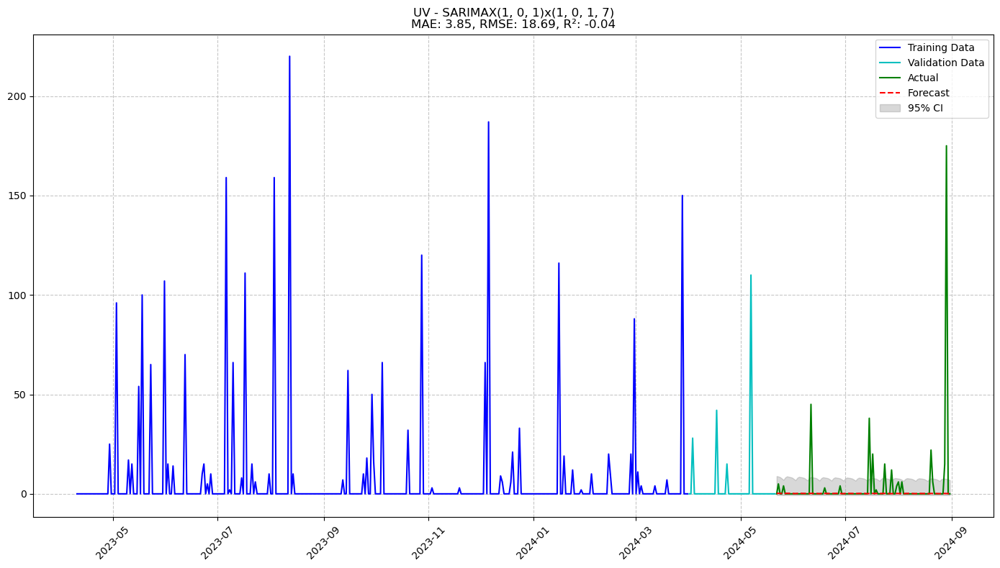

Processing products with SARIMAX:  87%|███████▊ | 13/15 [01:02<00:09,  4.73s/it]

Results for UV:
Order: (1, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 3.85, RMSE: 18.69, R²: -0.04
Testing 12 SARIMAX parameter combinations


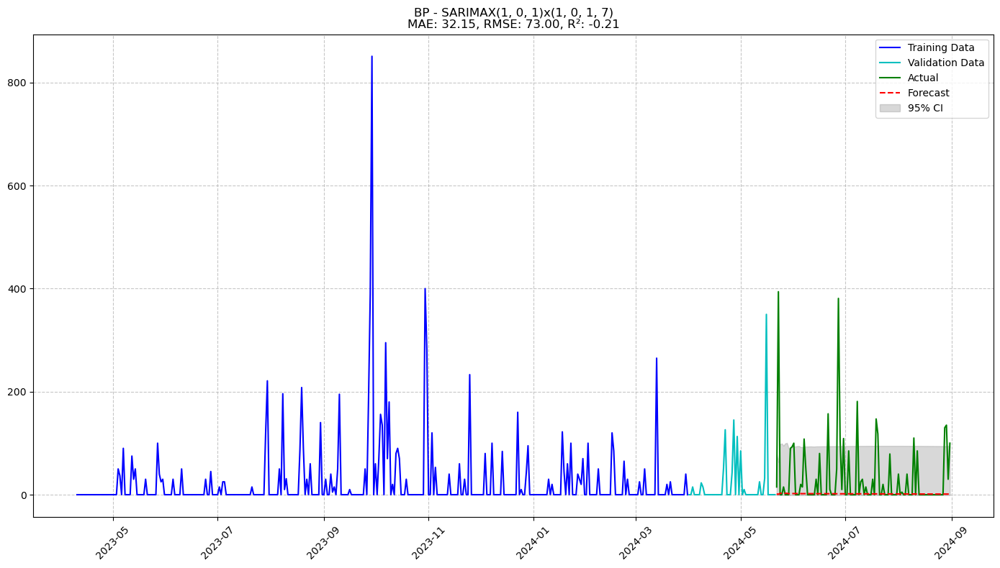

Processing products with SARIMAX:  93%|████████▍| 14/15 [01:06<00:04,  4.47s/it]

Results for BP:
Order: (1, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 32.15, RMSE: 73.00, R²: -0.21
Testing 12 SARIMAX parameter combinations


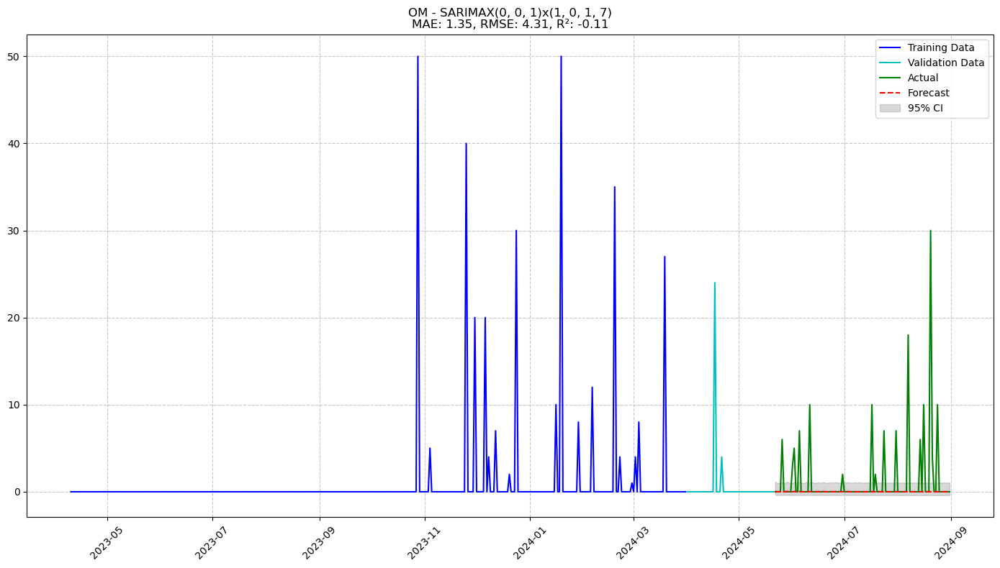

Processing products with SARIMAX: 100%|█████████| 15/15 [01:10<00:00,  4.73s/it]

Results for OM:
Order: (0, 0, 1), Seasonal Order: (1, 0, 1, 7)
MAE: 1.35, RMSE: 4.31, R²: -0.11


In [87]:
# Main SARIMAX analysis
sarimax_results = []
products = df_new['Product'].unique()

# Pre-aggregate data
df_agg = df_new.groupby(['Product', 'Invoice_Date'])['Invoice_Quantity'].sum().reset_index()

for product_id in tqdm(products, desc="Processing products with SARIMAX"):
    ts = prepare_daily_product_data(df_agg, product_id)
    
    # Skip products with insufficient data
    if len(ts) < 90:  # SARIMAX requires sufficient data
        print(f"Skipping {product_id} - only {len(ts)} days of data")
        continue
    
    # Handle zero values for Box-Cox transformation
    constant_shift = 1
    ts_shifted = ts + constant_shift
    
    # Apply Box-Cox transformation
    optimal_lambda = boxcox_normmax(ts_shifted)
    ts_transformed = boxcox(ts_shifted, lmbda=optimal_lambda)
    
    # Split data (70% train, 10% validation, 20% test)
    train_size = int(len(ts_transformed) * 0.7)
    val_size = int(len(ts_transformed) * 0.1)
    train = ts_transformed[:train_size]
    val = ts_transformed[train_size:train_size+val_size]
    test = ts_transformed[train_size+val_size:]
    
    try:
        # Tune hyperparameters
        best_params, best_model = tune_sarimax(train, val)
        
        if best_params is None:
            print(f"No valid SARIMAX parameters found for {product_id}")
            continue
            
        # Retrain on combined train+validation data
        combined = pd.concat([train, val])
        model = SARIMAX(
            combined,
            order=best_params['order'],
            seasonal_order=best_params['seasonal_order'],
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        model_fit = model.fit(disp=False)
        
        # Forecast test period
        forecast = model_fit.get_forecast(steps=len(test))
        test_pred = forecast.predicted_mean
        
        # Calculate prediction intervals
        conf_int = forecast.conf_int()
        
        # Inverse transformations
        train_orig = inv_boxcox(train, optimal_lambda) - constant_shift
        val_orig = inv_boxcox(val, optimal_lambda) - constant_shift
        test_orig = inv_boxcox(test, optimal_lambda) - constant_shift
        test_pred_orig = inv_boxcox(test_pred, optimal_lambda) - constant_shift
        conf_int_lower = inv_boxcox(conf_int.iloc[:, 0], optimal_lambda) - constant_shift
        conf_int_upper = inv_boxcox(conf_int.iloc[:, 1], optimal_lambda) - constant_shift
        
        # Calculate metrics
        results = {
            'Product': product_id,
            'Order': str(best_params['order']),
            'Seasonal_Order': str(best_params['seasonal_order']),
            'MAE': mean_absolute_error(test_orig, test_pred_orig),
            'RMSE': np.sqrt(mean_squared_error(test_orig, test_pred_orig)),
            'R2_Score': r2_score(test_orig, test_pred_orig)
        }
        sarimax_results.append(results)
        
        # Create date indices for plotting
        train_dates = ts.index[:train_size]
        val_dates = ts.index[train_size:train_size+val_size]
        test_dates = ts.index[train_size+val_size:]
        combined_dates = ts.index[:train_size+val_size]
        
        # Plot results
        plt.figure(figsize=(14, 8))
        
        # Plot training data
        plt.plot(train_dates, train_orig, 'b-', label='Training Data')
        
        # Plot validation data
        plt.plot(val_dates, val_orig, 'c-', label='Validation Data')
        
        # Plot test data
        plt.plot(test_dates, test_orig, 'g-', label='Actual')
        
        # Plot forecast
        plt.plot(test_dates, test_pred_orig, 'r--', label='Forecast')
        
        # Plot confidence interval
        plt.fill_between(test_dates, 
                         conf_int_lower, 
                         conf_int_upper, 
                         color='gray', alpha=0.3, label='95% CI')
        
        plt.title(f"{product_id} - SARIMAX{best_params['order']}x{best_params['seasonal_order']}\n"
                  f"MAE: {results['MAE']:.2f}, RMSE: {results['RMSE']:.2f}, R²: {results['R2_Score']:.2f}")
        plt.legend()
        plt.xticks(rotation=45)
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.tight_layout()
        #plt.savefig(f"sarimax_{product_id}.png", dpi=150)
        #plt.close()
        plt.show()
        
        print(f"Results for {product_id}:")
        print(f"Order: {best_params['order']}, Seasonal Order: {best_params['seasonal_order']}")
        print(f"MAE: {results['MAE']:.2f}, RMSE: {results['RMSE']:.2f}, R²: {results['R2_Score']:.2f}")
    
    except Exception as e:
        print(f"Failed for {product_id}: {str(e)}")



In [88]:
# Save results
sarimax_results_df = pd.DataFrame(sarimax_results)
#sarimax_results_df.to_csv('sarimax_results.csv', index=False)
print("SARIMAX analysis completed. Results saved to sarimax_results.csv")

SARIMAX analysis completed. Results saved to sarimax_results.csv


In [89]:
sarimax_results_df

,Product,Order,Seasonal_Order,MAE,RMSE,R2_Score
0,MD,"(2, 0, 1)","(0, 1, 1, 7)",1466.689787,2116.490383,-0.076042
1,HD,"(1, 0, 0)","(1, 0, 1, 7)",286.062723,409.725331,-0.266960
2,LR,"(2, 0, 1)","(1, 0, 1, 7)",299.512146,414.920515,-0.395268
3,DR,"(2, 0, 1)","(1, 0, 1, 7)",19.089467,73.474615,-0.059121
4,LB,"(1, 0, 1)","(1, 0, 1, 7)",16.124140,40.677530,-0.179631
5,LM,"(0, 0, 1)","(1, 0, 1, 7)",53.507640,151.136008,-0.136018
6,EM,"(0, 0, 1)","(1, 0, 1, 7)",19.883279,79.876198,-0.065853
7,LP,"(1, 0, 0)","(1, 0, 1, 7)",179.796170,311.500684,-0.185320
8,LF,"(2, 0, 1)","(1, 0, 1, 7)",89.499202,206.907165,-0.140872
9,FA,"(1, 0, 1)","(1, 1, 1, 7)",28.428618,107.175457,-0.050107


## ARIMA Implementation modified

In [92]:
import os

# Suppress warnings
warnings.filterwarnings("ignore")
os.makedirs("arima_results", exist_ok=True)

# Assuming df_new is your DataFrame
min_date = df_new['Invoice_Date'].min()
max_date = df_new['Invoice_Date'].max()
full_days = pd.date_range(start=min_date, end=max_date, freq='D')

def prepare_daily_product_data(product_df, product_id):
    """Create complete daily time series for a product"""
    product_data = product_df[product_df['Product'] == product_id].copy()
    daily_sales = product_data.groupby('Invoice_Date')['Invoice_Quantity'].sum().reset_index()
    daily_sales = daily_sales.set_index('Invoice_Date')
    
    if daily_sales.index.duplicated().any():
        daily_sales = daily_sales.groupby(level=0).sum()
    
    daily_sales = daily_sales.reindex(full_days, fill_value=0)
    return daily_sales['Invoice_Quantity']

def calculate_metrics(actual, forecast):
    """Calculate robust time series metrics"""
    actual = np.array(actual)
    forecast = np.array(forecast)
    non_zero_mask = (actual > 0)
    
    mae = mean_absolute_error(actual, forecast)
    rmse = np.sqrt(mean_squared_error(actual, forecast))
    
    # MAPE
    if np.any(non_zero_mask):
        mape = np.mean(np.abs(actual[non_zero_mask] - forecast[non_zero_mask]) / actual[non_zero_mask]) * 100
    else:
        mape = np.nan
        
    # sMAPE
    denominator = np.abs(actual) + np.abs(forecast)
    valid_mask = (denominator > 0)
    if np.any(valid_mask):
        smape = 2.0 * np.mean(np.abs(actual[valid_mask] - forecast[valid_mask]) / denominator[valid_mask]) * 100
    else:
        smape = np.nan
        
    # MASE (using naive seasonal forecast)
    if len(actual) > 7:
        naive = np.roll(actual, 7)
        naive[:7] = actual[:7]
        mae_naive = mean_absolute_error(actual[7:], naive[7:])
        mase = mae / mae_naive if mae_naive > 0 else np.nan
    else:
        mase = np.nan
        
    # R²
    mean_actual = np.mean(actual)
    ss_total = np.sum((actual - mean_actual) ** 2)
    ss_res = np.sum((actual - forecast) ** 2)
    r2 = 1 - (ss_res / ss_total) if ss_total > 0 else np.nan
    
    return {
        'MAE': mae,
        'RMSE': rmse,
        'MAPE': mape,
        'sMAPE': smape,
        'MASE': mase,
        'R2': r2
    }

# Main ARIMA analysis
arima_results = []
products = df_new['Product'].unique()
df_agg = df_new.groupby(['Product', 'Invoice_Date'])['Invoice_Quantity'].sum().reset_index()

for product_id in tqdm(products, desc="Processing products with ARIMA"):
    ts = prepare_daily_product_data(df_agg, product_id)
    
    # Skip products with insufficient data
    if len(ts) < 60:
        print(f"Skipping {product_id} - only {len(ts)} days of data")
        continue
    
    # Handle zero values
    constant_shift = 1
    ts_shifted = ts + constant_shift
    
    # Split data
    train_size = int(len(ts_shifted) * 0.7)
    val_size = int(len(ts_shifted) * 0.1)
    train_shifted = ts_shifted.iloc[:train_size]
    val_shifted = ts_shifted.iloc[train_size:train_size+val_size]
    test_shifted = ts_shifted.iloc[train_size+val_size:]
    
    # Calculate lambda ONLY on training data
    optimal_lambda = boxcox_normmax(train_shifted)
    
    # Apply Box-Cox transformation
    train_transformed = boxcox(train_shifted, lmbda=optimal_lambda)
    val_transformed = boxcox(val_shifted, lmbda=optimal_lambda)
    test_transformed = boxcox(test_shifted, lmbda=optimal_lambda)
    
    try:
        # AutoARIMA for parameter tuning
        model = auto_arima(
            train_transformed,
            seasonal=True,
            m=7,
            suppress_warnings=True,
            error_action="ignore",
            stepwise=True,
            trace=False,
            max_order=10,
            test='adf',
            with_intercept=True
        )
        
        # Create date indices
        train_dates = ts.index[:train_size]
        val_dates = ts.index[train_size:train_size+val_size]
        test_dates = ts.index[train_size+val_size:]
        combined_dates = ts.index[:train_size+val_size]
        
        # Forecast validation period
        val_pred_transformed = model.predict(n_periods=len(val_transformed))
        
        # Update model with validation data
        model.update(val_transformed)
        
        # Forecast test period
        test_pred_transformed, conf_int = model.predict(
            n_periods=len(test_transformed),
            return_conf_int=True
        )
        
        # Inverse transformation with clipping
        train_orig = np.maximum(inv_boxcox(train_transformed, optimal_lambda) - constant_shift, 0)
        val_orig = np.maximum(inv_boxcox(val_transformed, optimal_lambda) - constant_shift, 0)
        test_orig = np.maximum(inv_boxcox(test_transformed, optimal_lambda) - constant_shift, 0)
        val_pred_orig = np.maximum(inv_boxcox(val_pred_transformed, optimal_lambda) - constant_shift, 0)
        test_pred_orig = np.maximum(inv_boxcox(test_pred_transformed, optimal_lambda) - constant_shift, 0)
        
        # Calculate confidence intervals
        conf_int_lower = np.maximum(inv_boxcox(conf_int[:, 0], optimal_lambda) - constant_shift, 0)
        conf_int_upper = np.maximum(inv_boxcox(conf_int[:, 1], optimal_lambda) - constant_shift, 0)
        
        # Calculate all metrics
        val_metrics = calculate_metrics(val_orig, val_pred_orig)
        test_metrics = calculate_metrics(test_orig, test_pred_orig)
        
        # Create results dictionary
        results = {
            'Product': product_id,
            'Order': str(model.order),
            'Seasonal_Order': str(model.seasonal_order),
            'Lambda': optimal_lambda,
            'Train_Start': train_dates[0].strftime('%Y-%m-%d'),
            'Train_End': train_dates[-1].strftime('%Y-%m-%d'),
            'Test_Start': test_dates[0].strftime('%Y-%m-%d'),
            'Test_End': test_dates[-1].strftime('%Y-%m-%d'),
            'Train_Days': len(train_orig),
            'Test_Days': len(test_orig)
        }
        
        # Add metrics with prefix
        for k, v in test_metrics.items():
            results[f'Test_{k}'] = v
        for k, v in val_metrics.items():
            results[f'Val_{k}'] = v
            
        arima_results.append(results)
        
        # Plot results
        plt.figure(figsize=(14, 8))
        
        # Training data
        plt.plot(train_dates, train_orig, 'b-', label='Training Data', alpha=0.8)
        
        # Validation data
        plt.plot(val_dates, val_orig, 'c-', label='Validation Data', alpha=0.8)
        
        # Validation forecast
        plt.plot(val_dates, val_pred_orig, 'm--', label='Validation Forecast', alpha=0.8)
        
        # Test data
        plt.plot(test_dates, test_orig, 'g-', label='Actual', linewidth=2)
        
        # Test forecast
        plt.plot(test_dates, test_pred_orig, 'r--', label='Test Forecast', linewidth=2)
        
        # Confidence interval
        plt.fill_between(test_dates, conf_int_lower, conf_int_upper, 
                         color='gray', alpha=0.3, label='95% CI')
        
        # Formatting
        plt.title(f"{product_id} - ARIMA{model.order}x{model.seasonal_order}")
        plt.xlabel('Date')
        plt.ylabel('Quantity')
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend()
        plt.xticks(rotation=45)
        
        # Add metrics box
        metric_text = (f"Test MAE: {test_metrics['MAE']:.2f}\n"
                      f"Test RMSE: {test_metrics['RMSE']:.2f}\n"
                      f"Test MAPE: {test_metrics['MAPE']:.1f}%\n"
                      f"Test R²: {test_metrics['R2']:.2f}")
        plt.annotate(metric_text, xy=(0.05, 0.7), xycoords='axes fraction', 
                     bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        plt.tight_layout()
        plt.savefig(f"arima_results/{product_id}.png", dpi=150)
        plt.close()
        
        print(f"Completed {product_id}: Test MAE={test_metrics['MAE']:.2f}, R²={test_metrics['R2']:.2f}")
        
    except Exception as e:
        print(f"Failed for {product_id}: {str(e)}")

# Save results
arima_results_df = pd.DataFrame(arima_results)
# arima_results_df.to_csv('arima_results/arima_metrics.csv', index=False)

print("="*80)
print("ARIMA analysis complete!")
print(f"Processed {len(arima_results)}/{len(products)} products")
print(f"Results saved to arima_results/ directory")
print("="*80)

Processing products with ARIMA:   7%|▊           | 1/15 [00:10<02:29, 10.70s/it]

Completed MD: Test MAE=1454.21, R²=-0.08


Processing products with ARIMA:  13%|█▌          | 2/15 [00:17<01:46,  8.22s/it]

Completed HD: Test MAE=309.29, R²=-0.46


Processing products with ARIMA:  20%|██▍         | 3/15 [00:26<01:43,  8.63s/it]

Completed LR: Test MAE=275.65, R²=-0.17


Processing products with ARIMA:  27%|███▏        | 4/15 [00:29<01:12,  6.60s/it]

Completed DR: Test MAE=19.31, R²=-0.06


Processing products with ARIMA:  33%|████        | 5/15 [00:37<01:10,  7.09s/it]

Completed LB: Test MAE=16.86, R²=-0.15


Processing products with ARIMA:  40%|████▊       | 6/15 [00:39<00:48,  5.41s/it]

Completed LM: Test MAE=53.91, R²=-0.13


Processing products with ARIMA:  47%|█████▌      | 7/15 [00:43<00:37,  4.66s/it]

Completed EM: Test MAE=20.71, R²=-0.06


Processing products with ARIMA:  53%|██████▍     | 8/15 [00:45<00:28,  4.00s/it]

Completed LP: Test MAE=179.53, R²=-0.24


Processing products with ARIMA:  60%|███████▏    | 9/15 [00:48<00:21,  3.51s/it]

Completed LF: Test MAE=89.59, R²=-0.12


Processing products with ARIMA:  67%|███████▎   | 10/15 [00:51<00:17,  3.59s/it]

Completed FA: Test MAE=28.33, R²=-0.05


Processing products with ARIMA:  73%|████████   | 11/15 [00:53<00:12,  3.15s/it]

Completed PB: Test MAE=85.12, R²=-0.13


Processing products with ARIMA:  80%|████████▊  | 12/15 [00:56<00:08,  2.89s/it]

Completed AH: Test MAE=0.34, R²=-0.00


Processing products with ARIMA:  87%|█████████▌ | 13/15 [01:01<00:06,  3.49s/it]

Completed UV: Test MAE=4.01, R²=-0.03


Processing products with ARIMA:  93%|██████████▎| 14/15 [01:06<00:04,  4.17s/it]

Completed BP: Test MAE=32.42, R²=-0.19


Processing products with ARIMA: 100%|███████████| 15/15 [01:20<00:00,  5.34s/it]

Completed OM: Test MAE=1.36, R²=-0.10
ARIMA analysis complete!
Processed 15/15 products
Results saved to arima_results/ directory


In [93]:
arima_results_df

,Product,Order,Seasonal_Order,Lambda,Train_Start,Train_End,Test_Start,Test_End,Train_Days,Test_Days,...,Test_MAPE,Test_sMAPE,Test_MASE,Test_R2,Val_MAE,Val_RMSE,Val_MAPE,Val_sMAPE,Val_MASE,Val_R2
0,MD,"(1, 0, 1)","(0, 0, 1, 7)",0.483143,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,206.227073,112.737304,0.733064,-0.080810,1471.778616,2317.562523,251.333365,105.156395,0.689460,-0.095550
1,HD,"(1, 0, 1)","(0, 0, 0, 7)",0.444061,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,119.597257,104.333514,0.879941,-0.455173,261.584087,399.963612,96.838808,118.355059,0.711617,-0.159675
2,LR,"(1, 0, 1)","(0, 0, 0, 7)",0.568571,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,106.393023,81.519123,0.756762,-0.169788,226.981397,338.271308,134.183062,83.591164,0.692064,-0.035630
3,DR,"(0, 0, 0)","(1, 0, 0, 7)",-0.003838,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,88.023981,191.528657,0.560330,-0.056578,25.109240,65.052790,88.768386,187.983003,0.527354,-0.147661
4,LB,"(0, 0, 2)","(0, 0, 0, 7)",0.105671,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,93.043552,193.594532,0.689003,-0.147864,7.674833,19.448483,94.059103,197.487423,0.601948,-0.052214
5,LM,"(0, 0, 0)","(0, 0, 0, 7)",0.041939,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,97.130262,197.192731,0.520267,-0.131778,45.890897,119.558028,94.935912,195.847672,0.488437,-0.153386
6,EM,"(0, 0, 0)","(1, 0, 0, 7)",0.015476,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,98.570851,199.398621,0.503734,-0.058908,19.486951,82.224571,98.776399,199.624592,0.647114,-0.046402
7,LP,"(0, 0, 0)","(0, 0, 0, 7)",0.347557,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,94.142440,165.038769,0.692422,-0.241266,156.060052,239.678191,94.446675,167.041264,0.789269,-0.357025
8,LF,"(0, 0, 0)","(0, 0, 0, 7)",0.226499,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,86.253407,183.038825,0.672468,-0.118565,107.643559,202.308418,84.927739,179.709767,0.533910,-0.238842
9,FA,"(0, 0, 0)","(1, 0, 0, 7)",-0.019893,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,85.059937,190.222219,0.542024,-0.051558,58.427569,171.912300,92.151953,185.151655,0.606038,-0.112729


## Prophet Implementation modified

In [98]:

import pmdarima as pm
from pmdarima import auto_arima


In [99]:
def calculate_metrics(actual, forecast):
    """Calculate robust time series metrics"""
    actual = np.array(actual)
    forecast = np.array(forecast)
    non_zero_mask = (actual > 0)
    
    mae = mean_absolute_error(actual, forecast)
    rmse = np.sqrt(mean_squared_error(actual, forecast))
    
    # MAPE
    if np.any(non_zero_mask):
        mape = np.mean(np.abs(actual[non_zero_mask] - forecast[non_zero_mask]) / actual[non_zero_mask]) * 100
    else:
        mape = np.nan
        
    # sMAPE
    denominator = np.abs(actual) + np.abs(forecast)
    valid_mask = (denominator > 0)
    if np.any(valid_mask):
        smape = 2.0 * np.mean(np.abs(actual[valid_mask] - forecast[valid_mask]) / denominator[valid_mask]) * 100
    else:
        smape = np.nan
        
    # MASE (using naive seasonal forecast)
    if len(actual) > 7:
        naive = np.roll(actual, 7)
        naive[:7] = actual[:7]
        mae_naive = mean_absolute_error(actual[7:], naive[7:])
        mase = mae / mae_naive if mae_naive > 0 else np.nan
    else:
        mase = np.nan
        
    # R²
    mean_actual = np.mean(actual)
    ss_total = np.sum((actual - mean_actual) ** 2)
    ss_res = np.sum((actual - forecast) ** 2)
    r2 = 1 - (ss_res / ss_total) if ss_total > 0 else np.nan
    
    return {
        'MAE': mae,
        'RMSE': rmse,
        'MAPE': mape,
        'sMAPE': smape,
        'MASE': mase,
        'R2': r2
    }

In [100]:
# Main ARIMA analysis
arima_results = []
products = df_new['Product'].unique()
df_agg = df_new.groupby(['Product', 'Invoice_Date'])['Invoice_Quantity'].sum().reset_index()

for product_id in tqdm(products, desc="Processing products with ARIMA"):
    ts = prepare_daily_product_data(df_agg, product_id)
    
    # Skip products with insufficient data
    if len(ts) < 60:
        print(f"Skipping {product_id} - only {len(ts)} days of data")
        continue
    
    # Handle zero values
    constant_shift = 1
    ts_shifted = ts + constant_shift
    
    # Split data
    train_size = int(len(ts_shifted) * 0.7)
    val_size = int(len(ts_shifted) * 0.1)
    train_shifted = ts_shifted.iloc[:train_size]
    val_shifted = ts_shifted.iloc[train_size:train_size+val_size]
    test_shifted = ts_shifted.iloc[train_size+val_size:]
    
    # Calculate lambda ONLY on training data
    optimal_lambda = boxcox_normmax(train_shifted)
    
    # Apply Box-Cox transformation
    train_transformed = boxcox(train_shifted, lmbda=optimal_lambda)
    val_transformed = boxcox(val_shifted, lmbda=optimal_lambda)
    test_transformed = boxcox(test_shifted, lmbda=optimal_lambda)
    
    try:
        # AutoARIMA for parameter tuning
        model = auto_arima(
            train_transformed,
            seasonal=True,
            m=7,
            suppress_warnings=True,
            error_action="ignore",
            stepwise=True,
            trace=False,
            max_order=10,
            test='adf',
            with_intercept=True
        )
        
        # Create date indices
        train_dates = ts.index[:train_size]
        val_dates = ts.index[train_size:train_size+val_size]
        test_dates = ts.index[train_size+val_size:]
        combined_dates = ts.index[:train_size+val_size]
        
        # Forecast validation period
        val_pred_transformed = model.predict(n_periods=len(val_transformed))
        
        # Update model with validation data
        model.update(val_transformed)
        
        # Forecast test period
        test_pred_transformed, conf_int = model.predict(
            n_periods=len(test_transformed),
            return_conf_int=True
        )
        
        # Inverse transformation with clipping
        train_orig = np.maximum(inv_boxcox(train_transformed, optimal_lambda) - constant_shift, 0)
        val_orig = np.maximum(inv_boxcox(val_transformed, optimal_lambda) - constant_shift, 0)
        test_orig = np.maximum(inv_boxcox(test_transformed, optimal_lambda) - constant_shift, 0)
        val_pred_orig = np.maximum(inv_boxcox(val_pred_transformed, optimal_lambda) - constant_shift, 0)
        test_pred_orig = np.maximum(inv_boxcox(test_pred_transformed, optimal_lambda) - constant_shift, 0)
        
        # Calculate confidence intervals
        conf_int_lower = np.maximum(inv_boxcox(conf_int[:, 0], optimal_lambda) - constant_shift, 0)
        conf_int_upper = np.maximum(inv_boxcox(conf_int[:, 1], optimal_lambda) - constant_shift, 0)
        
        # Calculate all metrics
        val_metrics = calculate_metrics(val_orig, val_pred_orig)
        test_metrics = calculate_metrics(test_orig, test_pred_orig)
        
        # Create results dictionary
        results = {
            'Product': product_id,
            'Order': str(model.order),
            'Seasonal_Order': str(model.seasonal_order),
            'Lambda': optimal_lambda,
            'Train_Start': train_dates[0].strftime('%Y-%m-%d'),
            'Train_End': train_dates[-1].strftime('%Y-%m-%d'),
            'Test_Start': test_dates[0].strftime('%Y-%m-%d'),
            'Test_End': test_dates[-1].strftime('%Y-%m-%d'),
            'Train_Days': len(train_orig),
            'Test_Days': len(test_orig)
        }
        
        # Add metrics with prefix
        for k, v in test_metrics.items():
            results[f'Test_{k}'] = v
        for k, v in val_metrics.items():
            results[f'Val_{k}'] = v
            
        arima_results.append(results)
        
        # Plot results
        plt.figure(figsize=(14, 8))
        
        # Training data
        plt.plot(train_dates, train_orig, 'b-', label='Training Data', alpha=0.8)
        
        # Validation data
        plt.plot(val_dates, val_orig, 'c-', label='Validation Data', alpha=0.8)
        
        # Validation forecast
        plt.plot(val_dates, val_pred_orig, 'm--', label='Validation Forecast', alpha=0.8)
        
        # Test data
        plt.plot(test_dates, test_orig, 'g-', label='Actual', linewidth=2)
        
        # Test forecast
        plt.plot(test_dates, test_pred_orig, 'r--', label='Test Forecast', linewidth=2)
        
        # Confidence interval
        plt.fill_between(test_dates, conf_int_lower, conf_int_upper, 
                         color='gray', alpha=0.3, label='95% CI')
        
        # Formatting
        plt.title(f"{product_id} - ARIMA{model.order}x{model.seasonal_order}")
        plt.xlabel('Date')
        plt.ylabel('Quantity')
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend()
        plt.xticks(rotation=45)
        
        # Add metrics box
        metric_text = (f"Test MAE: {test_metrics['MAE']:.2f}\n"
                      f"Test RMSE: {test_metrics['RMSE']:.2f}\n"
                      f"Test MAPE: {test_metrics['MAPE']:.1f}%\n"
                      f"Test R²: {test_metrics['R2']:.2f}")
        plt.annotate(metric_text, xy=(0.05, 0.7), xycoords='axes fraction', 
                     bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        plt.tight_layout()
        plt.savefig(f"arima_results/{product_id}.png", dpi=150)
        plt.close()
        
        print(f"Completed {product_id}: Test MAE={test_metrics['MAE']:.2f}, R²={test_metrics['R2']:.2f}")
        
    except Exception as e:
        print(f"Failed for {product_id}: {str(e)}")

# Save results
arima_results_df = pd.DataFrame(arima_results)
#arima_results_df.to_csv('arima_results/arima_metrics.csv', index=False)


Processing products with ARIMA:   7%|▊           | 1/15 [00:10<02:30, 10.75s/it]

Completed MD: Test MAE=1454.21, R²=-0.08


Processing products with ARIMA:  13%|█▌          | 2/15 [00:17<01:47,  8.26s/it]

Completed HD: Test MAE=309.29, R²=-0.46


Processing products with ARIMA:  20%|██▍         | 3/15 [00:26<01:43,  8.66s/it]

Completed LR: Test MAE=275.65, R²=-0.17


Processing products with ARIMA:  27%|███▏        | 4/15 [00:29<01:13,  6.64s/it]

Completed DR: Test MAE=19.31, R²=-0.06


Processing products with ARIMA:  33%|████        | 5/15 [00:37<01:11,  7.14s/it]

Completed LB: Test MAE=16.86, R²=-0.15


Processing products with ARIMA:  40%|████▊       | 6/15 [00:40<00:48,  5.42s/it]

Completed LM: Test MAE=53.91, R²=-0.13


Processing products with ARIMA:  47%|█████▌      | 7/15 [00:43<00:37,  4.68s/it]

Completed EM: Test MAE=20.71, R²=-0.06


Processing products with ARIMA:  53%|██████▍     | 8/15 [00:45<00:28,  4.04s/it]

Completed LP: Test MAE=179.53, R²=-0.24


Processing products with ARIMA:  60%|███████▏    | 9/15 [00:48<00:21,  3.54s/it]

Completed LF: Test MAE=89.59, R²=-0.12


Processing products with ARIMA:  67%|███████▎   | 10/15 [00:52<00:18,  3.62s/it]

Completed FA: Test MAE=28.33, R²=-0.05


Processing products with ARIMA:  73%|████████   | 11/15 [00:54<00:12,  3.18s/it]

Completed PB: Test MAE=85.12, R²=-0.13


Processing products with ARIMA:  80%|████████▊  | 12/15 [00:56<00:08,  2.92s/it]

Completed AH: Test MAE=0.34, R²=-0.00


Processing products with ARIMA:  87%|█████████▌ | 13/15 [01:01<00:07,  3.53s/it]

Completed UV: Test MAE=4.01, R²=-0.03


Processing products with ARIMA:  93%|██████████▎| 14/15 [01:07<00:04,  4.19s/it]

Completed BP: Test MAE=32.42, R²=-0.19


Processing products with ARIMA: 100%|███████████| 15/15 [01:20<00:00,  5.37s/it]

Completed OM: Test MAE=1.36, R²=-0.10


In [101]:
arima_results_df

,Product,Order,Seasonal_Order,Lambda,Train_Start,Train_End,Test_Start,Test_End,Train_Days,Test_Days,...,Test_MAPE,Test_sMAPE,Test_MASE,Test_R2,Val_MAE,Val_RMSE,Val_MAPE,Val_sMAPE,Val_MASE,Val_R2
0,MD,"(1, 0, 1)","(0, 0, 1, 7)",0.483143,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,206.227073,112.737304,0.733064,-0.080810,1471.778616,2317.562523,251.333365,105.156395,0.689460,-0.095550
1,HD,"(1, 0, 1)","(0, 0, 0, 7)",0.444061,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,119.597257,104.333514,0.879941,-0.455173,261.584087,399.963612,96.838808,118.355059,0.711617,-0.159675
2,LR,"(1, 0, 1)","(0, 0, 0, 7)",0.568571,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,106.393023,81.519123,0.756762,-0.169788,226.981397,338.271308,134.183062,83.591164,0.692064,-0.035630
3,DR,"(0, 0, 0)","(1, 0, 0, 7)",-0.003838,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,88.023981,191.528657,0.560330,-0.056578,25.109240,65.052790,88.768386,187.983003,0.527354,-0.147661
4,LB,"(0, 0, 2)","(0, 0, 0, 7)",0.105671,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,93.043552,193.594532,0.689003,-0.147864,7.674833,19.448483,94.059103,197.487423,0.601948,-0.052214
5,LM,"(0, 0, 0)","(0, 0, 0, 7)",0.041939,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,97.130262,197.192731,0.520267,-0.131778,45.890897,119.558028,94.935912,195.847672,0.488437,-0.153386
6,EM,"(0, 0, 0)","(1, 0, 0, 7)",0.015476,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,98.570851,199.398621,0.503734,-0.058908,19.486951,82.224571,98.776399,199.624592,0.647114,-0.046402
7,LP,"(0, 0, 0)","(0, 0, 0, 7)",0.347557,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,94.142440,165.038769,0.692422,-0.241266,156.060052,239.678191,94.446675,167.041264,0.789269,-0.357025
8,LF,"(0, 0, 0)","(0, 0, 0, 7)",0.226499,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,86.253407,183.038825,0.672468,-0.118565,107.643559,202.308418,84.927739,179.709767,0.533910,-0.238842
9,FA,"(0, 0, 0)","(1, 0, 0, 7)",-0.019893,2023-04-10,2024-03-31,2024-05-22,2024-08-31,357,102,...,85.059937,190.222219,0.542024,-0.051558,58.427569,171.912300,92.151953,185.151655,0.606038,-0.112729


## LSTM

In [76]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner import HyperModel, RandomSearch
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import os

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

2025-07-02 17:22:13.277385: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-07-02 17:22:13.952714: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-07-02 17:22:14.225303: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751457134.659681  354123 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751457134.734717  354123 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1751457135.717162  354123 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

In [77]:
class LSTMTuner(HyperModel):
    def __init__(self, input_shape):
        self.input_shape = input_shape
        
    def build(self, hp):
        model = keras.Sequential()
        
        # Input layer with correct shape
        model.add(layers.Input(shape=self.input_shape))
        
        # Tune number of LSTM layers
        num_layers = hp.Int('num_layers', 1, 2, default=1)
        for i in range(num_layers):
            model.add(layers.LSTM(
                units=hp.Int(f'units_{i}', min_value=32, max_value=128, step=32, default=64),
                return_sequences=i < num_layers - 1
            ))
            # Add dropout
            model.add(layers.Dropout(
                hp.Float(f'dropout_{i}', min_value=0.0, max_value=0.3, step=0.1, default=0.2)
            ))
        
        model.add(layers.Dense(1))
        
        # Tune learning rate
        lr = hp.Float('lr', min_value=1e-4, max_value=1e-2, sampling='log', default=1e-3)
        
        # Tune batch size
        batch_size = hp.Int('batch_size', 16, 64, step=16, default=32)
        
        model.compile(
            optimizer=keras.optimizers.Adam(learning_rate=lr),
            loss='mse'
        )
        return model, batch_size  # Return both model and batch_size

def create_lstm_sequences(data, n_steps):
    """Convert time series into LSTM input-output sequences with correct dimensions"""
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:(i + n_steps)])
        y.append(data[i + n_steps])
    X = np.array(X)
    # Reshape to [samples, timesteps, features]
    X = X.reshape(X.shape[0], X.shape[1], 1)
    return X, np.array(y)

def prepare_lstm_data(series, n_steps):
    """Prepare data for LSTM modeling with correct dimensions"""
    # Scale data
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(series.values.reshape(-1, 1)).flatten()
    
    # Create sequences with proper reshaping
    X, y = create_lstm_sequences(scaled_data, n_steps)
    
    # Split into train/val/test (70/15/15)
    train_size = int(0.7 * len(X))
    val_size = int(0.15 * len(X))
    
    X_train, X_val, X_test = X[:train_size], X[train_size:train_size+val_size], X[train_size+val_size:]
    y_train, y_val, y_test = y[:train_size], y[train_size:train_size+val_size], y[train_size+val_size:]
    
    return X_train, y_train, X_val, y_val, X_test, y_test, scaler

def tune_lstm_model(X_train, y_train, X_val, y_val, max_trials=10, executions_per_trial=1, epochs=50):
    """Hyperparameter tuning with proper input shape"""
    # Get input shape from data
    input_shape = (X_train.shape[1], X_train.shape[2])
    
    tuner = RandomSearch(
        lambda hp: LSTMTuner(input_shape=input_shape).build(hp)[0],  # Only return model
        objective='val_loss',
        max_trials=max_trials,
        executions_per_trial=executions_per_trial,
        directory='lstm_tuning',
        project_name='sales_forecast',
        overwrite=True
    )
    
    # Early stopping callback
    early_stop = keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=5, restore_best_weights=True
    )
    
    # Start search with fixed batch size (will be tuned per trial)
    tuner.search(
        X_train, y_train,
        epochs=epochs,
        validation_data=(X_val, y_val),
        callbacks=[early_stop],
        verbose=1
    )
    
    # Get best model and hyperparameters
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
    best_model = tuner.get_best_models(num_models=1)[0]
    
    # Get the batch size from best hyperparameters
    batch_size = best_hps.get('batch_size')
    
    return best_model, best_hps, batch_size


Trial 20 Complete [00h 00m 11s]
val_loss: 0.0

Best val_loss So Far: 0.0
Total elapsed time: 00h 05m 48s
Training final model...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00 - learning_rate: 0.0070
Epoch 2/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00 - learning_rate: 0.0070
Epoch 3/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00 - learning_rate: 0.0070
Epoch 4/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00 - learning_rate: 0.0070
Epoch 5/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00 - learning_rate: 0.0070
Epoch 6/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00 - learning_rate: 0.0070
Epoch 7/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00 - learning_rate: 0.0035
Epoch 8/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0

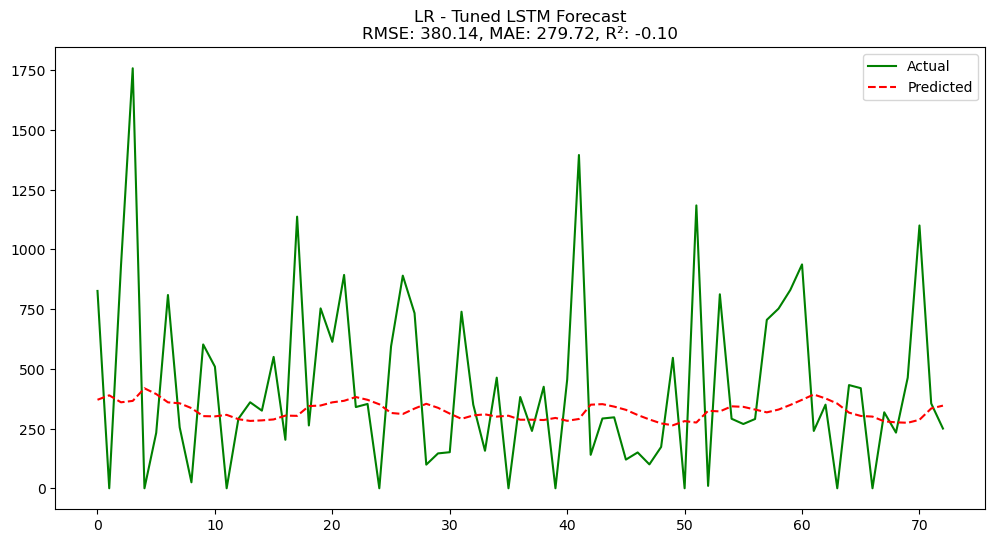

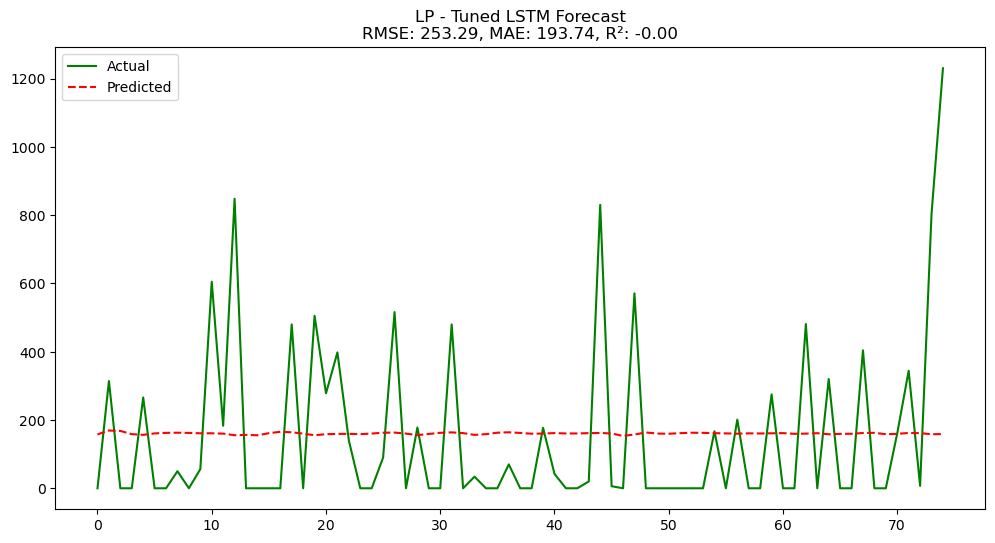

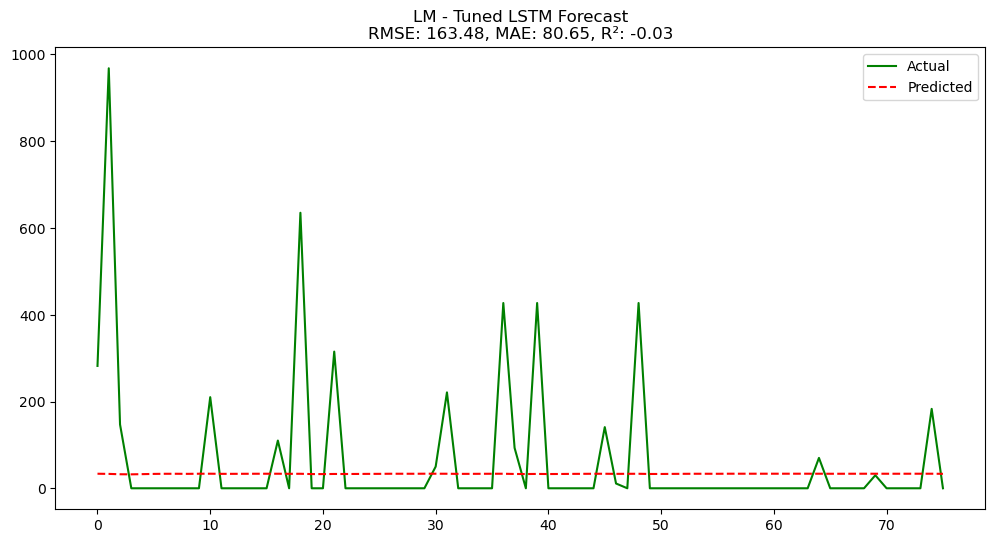

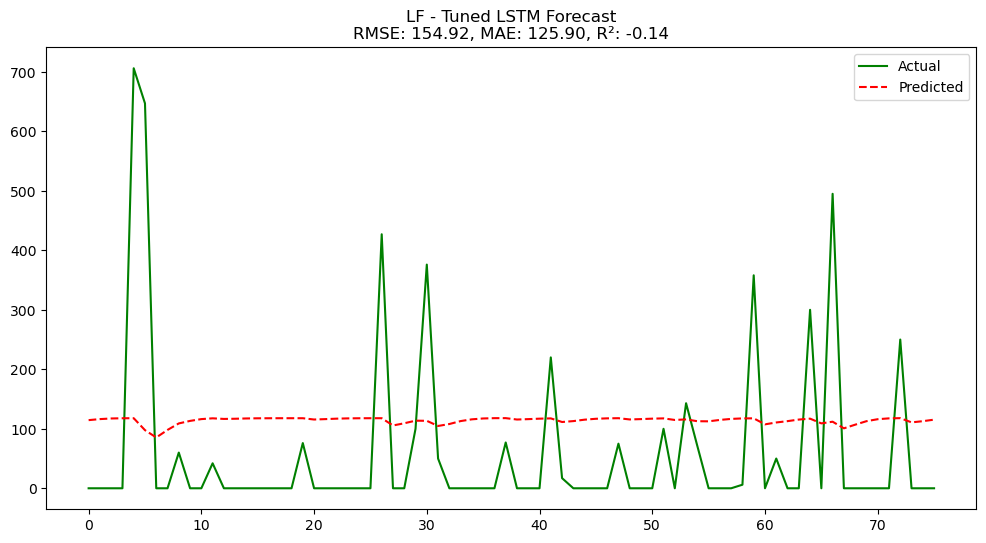

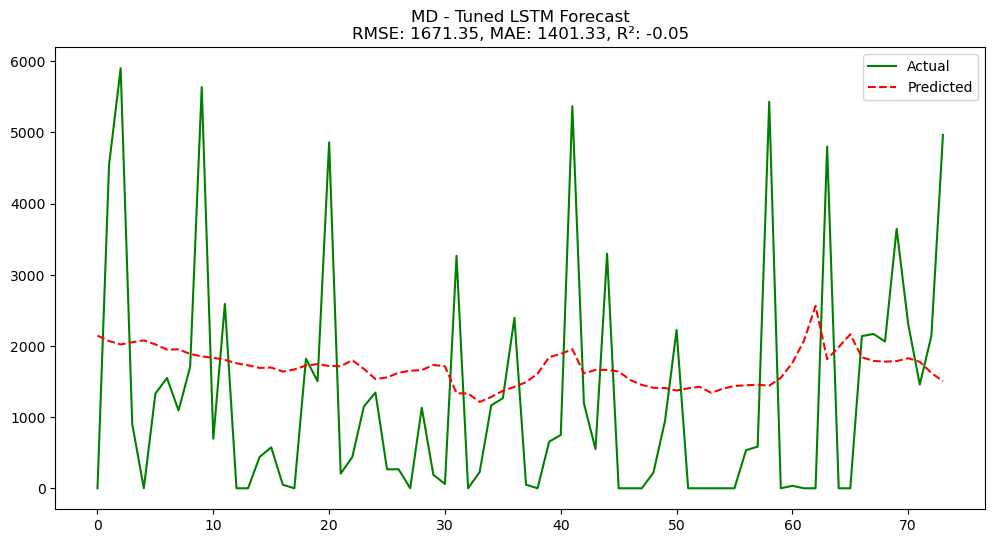

...

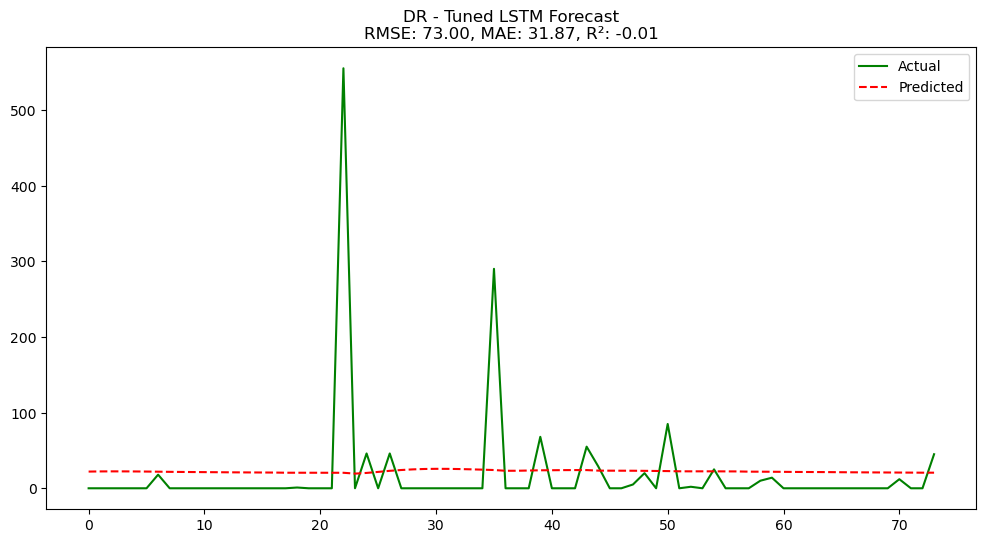

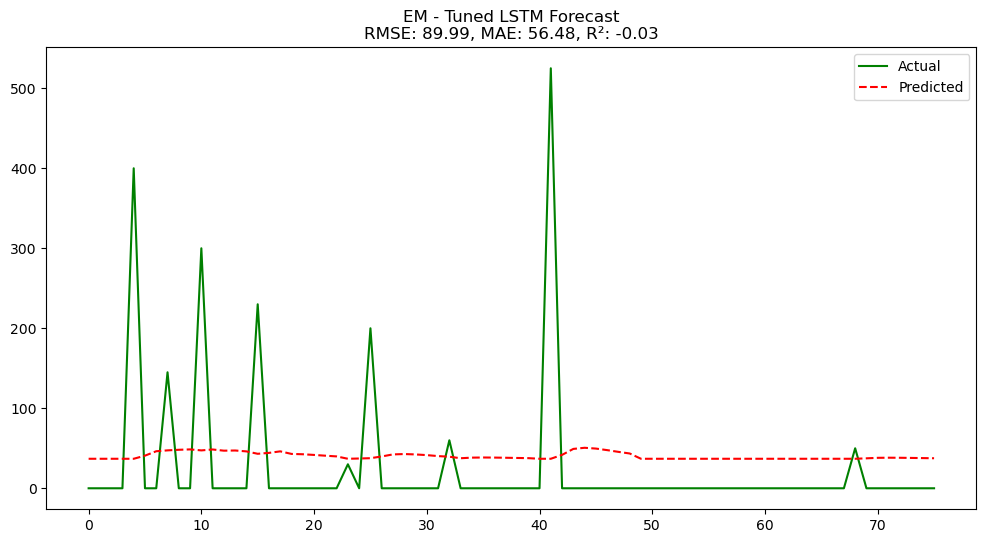

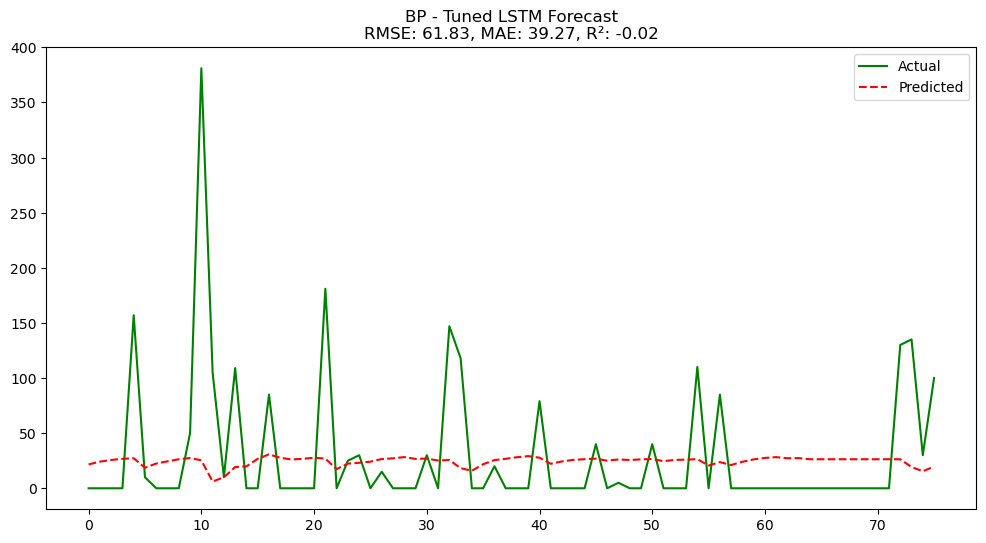

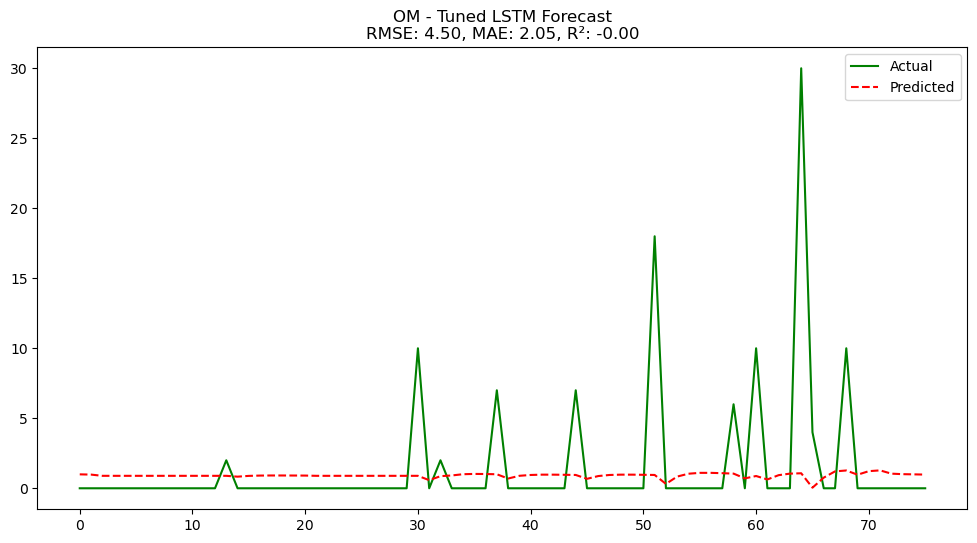

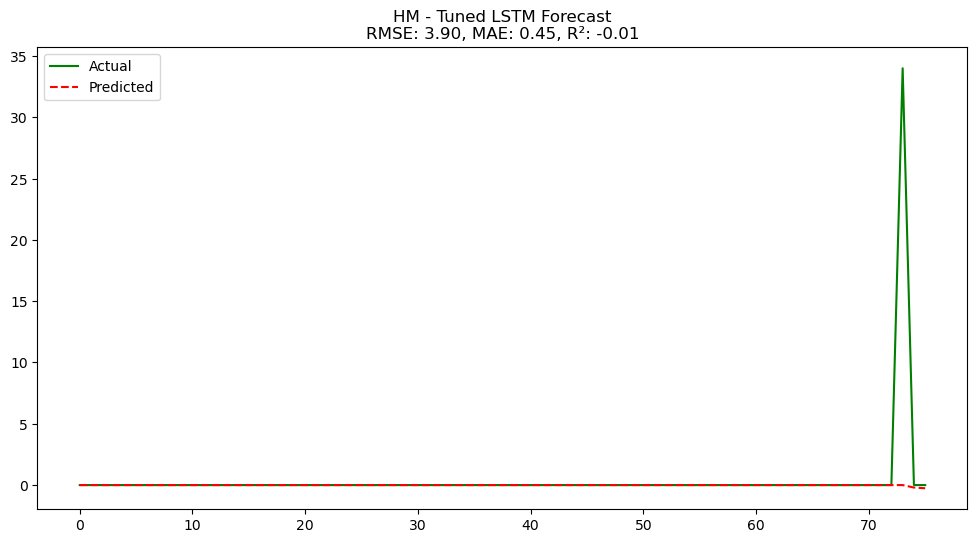

In [78]:
import time
from sklearn.metrics import r2_score

def train_final_model(model, X_train, y_train, X_val, y_val, batch_size, epochs=200):
    """Train final model with best hyperparameters"""
    # Learning rate scheduler
    lr_scheduler = keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6
    )
    
    # Early stopping
    early_stop = keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=10, restore_best_weights=True
    )
    
    # Train model
    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=epochs,
        batch_size=batch_size,
        callbacks=[lr_scheduler, early_stop],
        verbose=1
    )
    
    return model, history

# Main parameter tuning pipeline
tuning_results = []
products = df['Product'].unique()  # All products

# Time the process
start_time = time.time()

for i, product_id in enumerate(products):
    print(f"\n{'='*50}\nProcessing {i+1}/{len(products)}: {product_id}\n{'='*50}")
    
    # Prepare time series
    ts = prepare_daily_product_data(df, product_id)
    
    # Skip products with insufficient data
    if len(ts) < 120:  # Minimum 4 months of daily data
        print(f"Skipping - only {len(ts)} days of data")
        continue
    
    # Tune lookback window (n_steps)
    best_score = float('inf')
    best_n_steps = 7
    
    for n_steps in [7, 14, 21, 28]:
        try:
            # Prepare data
            X_train, y_train, X_val, y_val, _, _, _ = prepare_lstm_data(ts, n_steps)
            
            # Build simple model for evaluation
            model = keras.Sequential([
                layers.LSTM(32, input_shape=(n_steps, 1)),
                layers.Dense(1)
            ])
            model.compile(optimizer='adam', loss='mse')
            
            # Quick train
            history = model.fit(
                X_train, y_train,
                validation_data=(X_val, y_val),
                epochs=20,
                verbose=0
            )
            
            # Evaluate
            val_loss = min(history.history['val_loss'])
            if val_loss < best_score:
                best_score = val_loss
                best_n_steps = n_steps
                
            print(f"n_steps={n_steps} val_loss={val_loss:.4f}")
        except:
            continue
    
    print(f"Selected n_steps: {best_n_steps}")
    
    # Prepare full dataset with best n_steps
    X_train, y_train, X_val, y_val, X_test, y_test, scaler = prepare_lstm_data(
        ts, best_n_steps
    )
    
    # Hyperparameter tuning
    print("Starting hyperparameter tuning...")
    best_model, best_hps, batch_size = tune_lstm_model(  # Unpack 3 values
        X_train, y_train, X_val, y_val,
        max_trials=20,
        executions_per_trial=1,
        epochs=50
    )
    
    # Train final model
    print("Training final model...")
    final_model, history = train_final_model(
        best_model, X_train, y_train, X_val, y_val, batch_size
    )
    
    # Evaluate on test set
    y_pred = final_model.predict(X_test)
    y_test_orig = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_pred_orig = scaler.inverse_transform(y_pred).flatten()
    
    # Calculate metrics
    rmse = np.sqrt(mean_squared_error(y_test_orig, y_pred_orig))
    mae = mean_absolute_error(y_test_orig, y_pred_orig)
    R2_score = r2_score(y_test_orig, y_pred_orig)
    
    # Store results
    tuning_results.append({
        'product': product_id,
        'n_steps': best_n_steps,
        'num_layers': best_hps.get('num_layers'),
        'units': [best_hps.get(f'units_{i}') for i in range(best_hps.get('num_layers'))],
        'dropout': [best_hps.get(f'dropout_{i}') for i in range(best_hps.get('num_layers'))],
        'learning_rate': best_hps.get('lr'),
        'batch_size': batch_size,
        'rmse': rmse,
        'mae': mae,
        'R2_score': R2_score,
        'train_time': history.history['time'][-1] if 'time' in history.history else None
    })
    
    # Plot predictions
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_orig, 'g-', label='Actual')
    plt.plot(y_pred_orig, 'r--', label='Predicted')
    plt.title(f"{product_id} - Tuned LSTM Forecast\nRMSE: {rmse:.2f}, MAE: {mae:.2f}, R²: {R2_score:.2f}")
    plt.legend()
    #plt.savefig(f"{product_id}_tuned_lstm_forecast.png")
    #plt.close()
    plt.show()
    
    print(f"Completed {product_id} | RMSE: {rmse:.2f}, R²: {R2_score:.2f}")

In [83]:
# Save results
if tuning_results:
    results_df = pd.DataFrame(tuning_results)
    #results_df.to_csv('lstm_tuning_results.csv', index=False)
    
    # Print summary
    total_time = time.time() - start_time
    print(f"\nTuning completed in {total_time/3600:.2f} hours")
    print(f"Average RMSE: {results_df['rmse'].mean():.2f}")
    print(f"Average R²: {results_df['R2_score'].mean():.2f}")
    print(f"Best model: {results_df.loc[results_df['rmse'].idxmin()]['product']}")
else:
    print("No products successfully tuned")


Tuning completed in 1.57 hours
Average RMSE: 214.25
Average R²: -0.17
Best model: AH
